This notebook contains the analysis and visualisations for the FIFA 19 dataset.
Also, the overall score of a player is predicted using various regression algorithms, ensemble algorithms and neural network.

The kernels from which references have been taken are:
* https://www.kaggle.com/shriramganesh/awards-section-how-to-fill-nan-values/data
* https://www.kaggle.com/nitindatta/fifa-in-depth-analysis-with-linear-regression
* https://www.kaggle.com/rupavj/fifa-17-detailed-analysis/notebook

**Table of contents**
1. Information about the data
2. Data cleaning 
3. Grouping similar skills together
4. Data analysis and visualisation
5. Club level analysis
6. National level analysis
7. Preparing data for modelling
8. Modelling

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import time 

%matplotlib inline

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['data.csv']


1. **Information about the data**

In [2]:
df = pd.read_csv('../input/data.csv')
print(df.shape)

(18207, 89)


In [3]:
df.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


Number of null values in each column

In [4]:
df.isnull().sum()

Unnamed: 0                      0
ID                              0
Name                            0
Age                             0
Photo                           0
Nationality                     0
Flag                            0
Overall                         0
Potential                       0
Club                          241
Club Logo                       0
Value                           0
Wage                            0
Special                         0
Preferred Foot                 48
International Reputation       48
Weak Foot                      48
Skill Moves                    48
Work Rate                      48
Body Type                      48
Real Face                      48
Position                       60
Jersey Number                  60
Joined                       1553
Loaned From                 16943
Contract Valid Until          289
Height                         48
Weight                         48
LS                           2085
ST            

In [5]:
df.describe()

,Unnamed: 0,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,...,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,...,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,9103.000000,214298.338606,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,...,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,5256.052511,29965.244204,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,...,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,0.000000,16.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,...,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,4551.500000,200315.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,...,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,9103.000000,221759.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,...,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,13654.500000,236529.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,18206.000000,246620.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,...,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.000000,91.000000,90.000000,94.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 89 columns):
Unnamed: 0                  18207 non-null int64
ID                          18207 non-null int64
Name                        18207 non-null object
Age                         18207 non-null int64
Photo                       18207 non-null object
Nationality                 18207 non-null object
Flag                        18207 non-null object
Overall                     18207 non-null int64
Potential                   18207 non-null int64
Club                        17966 non-null object
Club Logo                   18207 non-null object
Value                       18207 non-null object
Wage                        18207 non-null object
Special                     18207 non-null int64
Preferred Foot              18159 non-null object
International Reputation    18159 non-null float64
Weak Foot                   18159 non-null float64
Skill Moves                 18159 non-null fl

2. **Data cleaning**

Function for removing 'lbs' from the 'weight' column

In [7]:
def weight_correction(df):
    try:
        value = float(df[:-3])
    except:
        value = 0
    return value
df['Weight'] = df.Weight.apply(weight_correction)

In [8]:
df.Weight = pd.to_numeric(df.Weight)

In [9]:
df.Weight = df.Weight.replace(0, np.nan)

Function for converting values in 'value' and 'wage' columns to numeric type

In [10]:
def value_to_int(df_value):
    try:
        value = float(df_value[1:-1])
        suffix = df_value[-1:]
        if suffix == 'M':
            value = value * 1000000
        elif suffix == 'K':
            value = value * 1000
    except ValueError:
        value = 0
    return value

df['Value'] = df['Value'].apply(value_to_int)
df['Wage'] = df['Wage'].apply(value_to_int)

df.Value = df.Value.replace(0, np.nan)
df.Wage = df.Wage.replace(0, np.nan)

Filling the NaN values

In [11]:
df.Weight.isna().sum()

48

In [12]:
df.Weight.mean()

165.97912880665234

According to https://www.sportsrec.com/5464445/the-ideal-weight-for-a-soccer-player,

The normal weight range for a player with a height of 5 feet 9 inches is 136 to 169 pounds.
Since the mean weight of the player is 165 pounds in our data and it gels with the global data, we could set the mean weight to fill the null values.

In [13]:
df['Weight'].fillna(df.Weight.mean(), inplace = True)

In [14]:
df.Height.isna().sum()

48

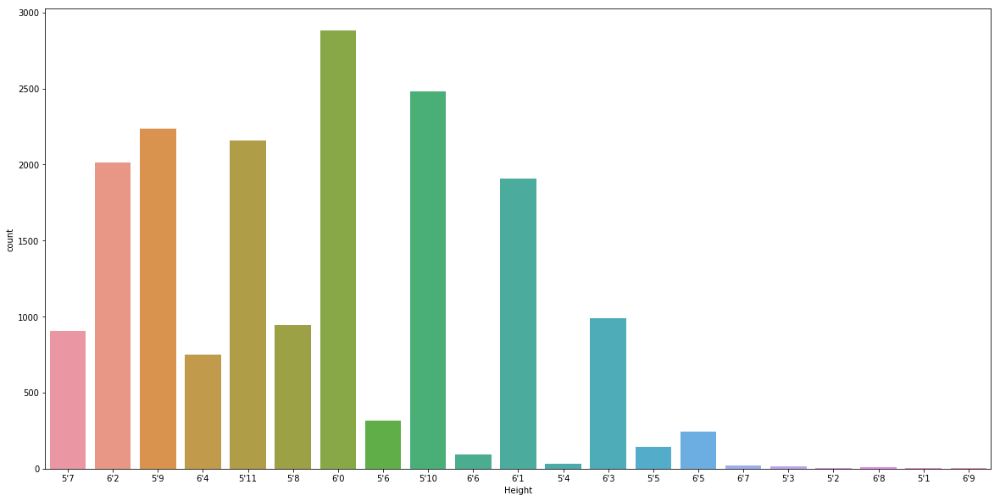

In [15]:
plt.figure(figsize = (20, 10))
sns.countplot(x = 'Height', data = df)
plt.show()

According to https://www.sportsrec.com/5464445/the-ideal-weight-for-a-soccer-player,

The average height of players is 5 feet, 11 and 1/2 inches. Also, from the data, we find that most of the players have their height between 5 feet, 9 inches and 6 feet, 1 inch. So, we can fill the null values in the 'height' column with 5 feet, 11 inches.

In [16]:
df['Height'].fillna("5'11", inplace = True)

In [17]:
wf_missing = df['Weak Foot'].isna()
wf_missing.sum()

48

In [18]:
weak_foot_prob = df['Weak Foot'].value_counts(normalize = True)
weak_foot_prob

3.0    0.624979
2.0    0.207115
4.0    0.146594
5.0    0.012611
1.0    0.008701
Name: Weak Foot, dtype: float64

We will fill the null values with the same probability distribution

In [19]:
df.loc[wf_missing, 'Weak Foot'] = np.random.choice(weak_foot_prob.index, size = wf_missing.sum(), p = weak_foot_prob.values)

In [20]:
pf_missing = df['Preferred Foot'].isna()
pf_missing.sum()

48

In [21]:
foot_distribution = df['Preferred Foot'].value_counts(normalize = True)
foot_distribution

Right    0.768104
Left     0.231896
Name: Preferred Foot, dtype: float64

We will fill the null values with the same probability distribution

In [22]:
df.loc[pf_missing, 'Preferred Foot'] = np.random.choice(foot_distribution.index, size = pf_missing.sum(), p = foot_distribution.values)

In [23]:
fp_missing = df.Position.isna()
fp_missing.sum()

60

In [24]:
position_prob = df.Position.value_counts(normalize = True)
position_prob 

ST     0.118587
GK     0.111589
CB     0.097978
CM     0.076817
LB     0.072850
RB     0.071141
RM     0.061939
LM     0.060341
CAM    0.052791
CDM    0.052240
RCB    0.036480
LCB    0.035708
LCM    0.021767
RCM    0.021546
LW     0.020995
RW     0.020389
RDM    0.013666
LDM    0.013391
LS     0.011407
RS     0.011186
RWB    0.004794
LWB    0.004298
CF     0.004078
RAM    0.001157
LAM    0.001157
RF     0.000882
LF     0.000827
Name: Position, dtype: float64

We will fill the null values with the same probability distribution

In [25]:
df.loc[fp_missing, 'Position'] = np.random.choice(position_prob.index, p = position_prob.values, size = fp_missing.sum())

In [26]:
fs_missing = df['Skill Moves'].isna()
fs_missing.sum()

48

In [27]:
skill_moves_prob = df['Skill Moves'].value_counts(normalize=True)
skill_moves_prob

2.0    0.471667
3.0    0.363456
1.0    0.111570
4.0    0.050498
5.0    0.002809
Name: Skill Moves, dtype: float64

We will fill the null values with the same probability distribution

In [28]:
df.loc[fs_missing, 'Skill Moves'] = np.random.choice(skill_moves_prob.index, p = skill_moves_prob.values, size = fs_missing.sum())

In [29]:
bt_missing = df['Body Type'].isna()
bt_missing.sum()

48

In [30]:
bt_prob = df['Body Type'].value_counts(normalize = True)
bt_prob

Normal                 0.583457
Lean                   0.353378
Stocky                 0.062779
PLAYER_BODY_TYPE_25    0.000055
Akinfenwa              0.000055
Courtois               0.000055
Messi                  0.000055
Neymar                 0.000055
Shaqiri                0.000055
C. Ronaldo             0.000055
Name: Body Type, dtype: float64

'Neymar', 'Messi', 'Shaqiri', 'Akinfenwa', 'Courtois' are definitely not body types but the names of football players. So, we will fill the null values with 'normal' and 'lean'.

In [31]:
df.loc[bt_missing, 'Body Type'] = np.random.choice(['Normal', 'Lean'], p = [.63,.37], size = bt_missing.sum())

In [32]:
wage_missing = df['Wage'].isna()
wage_missing.sum()

241

In [33]:
wage_prob = df.Wage.value_counts(normalize = True)
wage_prob

1000.0      0.272737
2000.0      0.157353
3000.0      0.103362
4000.0      0.069854
5000.0      0.048369
6000.0      0.037961
7000.0      0.027162
8000.0      0.023544
9000.0      0.018257
10000.0     0.017756
11000.0     0.016253
12000.0     0.014249
13000.0     0.012635
15000.0     0.011132
14000.0     0.010464
17000.0     0.008961
18000.0     0.008460
16000.0     0.007570
20000.0     0.007459
19000.0     0.007236
22000.0     0.007125
21000.0     0.006178
24000.0     0.005677
26000.0     0.005288
25000.0     0.005121
23000.0     0.005009
27000.0     0.003451
29000.0     0.003395
31000.0     0.003340
30000.0     0.003340
              ...   
170000.0    0.000167
150000.0    0.000167
87000.0     0.000167
90000.0     0.000167
215000.0    0.000167
355000.0    0.000167
315000.0    0.000167
97000.0     0.000111
83000.0     0.000111
185000.0    0.000111
260000.0    0.000111
340000.0    0.000111
210000.0    0.000111
200000.0    0.000056
235000.0    0.000056
225000.0    0.000056
245000.0    0

We will fill the null values with the same probability distribution

In [34]:
df.loc[wage_missing, 'Wage'] = np.random.choice(wage_prob.index, p = wage_prob.values, size = wage_missing.sum())

In [35]:
wr_missing = df['Work Rate'].isna()
wr_missing.sum()

48

In [36]:
wr_prob = df['Work Rate'].value_counts(normalize=True)
wr_prob

Medium/ Medium    0.540228
High/ Medium      0.174734
Medium/ High      0.093067
High/ High        0.055895
Medium/ Low       0.046809
High/ Low         0.038493
Low/ Medium       0.024726
Low/ High         0.024175
Low/ Low          0.001872
Name: Work Rate, dtype: float64

We will fill the null values with the same probability distribution

In [37]:
df.loc[wr_missing, 'Work Rate'] = np.random.choice(wr_prob.index, p = wr_prob.values, size = wr_missing.sum())

In [38]:
ir_missing = df['International Reputation'].isna()
ir_missing.sum()

48

In [39]:
ir_prob = df['International Reputation'].value_counts(normalize = True)
ir_prob

1.0    0.910403
2.0    0.069442
3.0    0.017016
4.0    0.002809
5.0    0.000330
Name: International Reputation, dtype: float64

We will fill the null values with the same probability distribution

In [40]:
df.loc[ir_missing, 'International Reputation'] = np.random.choice(ir_prob.index, p = ir_prob.values, size = ir_missing.sum())

We will fill the other null values in the remaining important columns containing float values using the mean.

In [41]:
# filling the missing value for the continous variables for proper data visualization

df['ShortPassing'].fillna(df['ShortPassing'].mean(), inplace = True)
df['Volleys'].fillna(df['Volleys'].mean(), inplace = True)
df['Dribbling'].fillna(df['Dribbling'].mean(), inplace = True)
df['Curve'].fillna(df['Curve'].mean(), inplace = True)
df['FKAccuracy'].fillna(df['FKAccuracy'].mean(), inplace = True)
df['LongPassing'].fillna(df['LongPassing'].mean(), inplace = True)
df['BallControl'].fillna(df['BallControl'].mean(), inplace = True)
df['HeadingAccuracy'].fillna(df['HeadingAccuracy'].mean(), inplace = True)
df['Finishing'].fillna(df['Finishing'].mean(), inplace = True)
df['Crossing'].fillna(df['Crossing'].mean(), inplace = True)
df['Acceleration'].fillna(df['Acceleration'].mean(), inplace = True)
df['SprintSpeed'].fillna(df['SprintSpeed'].mean(), inplace = True)
df['Agility'].fillna(df['Agility'].mean(), inplace = True)
df['Reactions'].fillna(df['Reactions'].mean(), inplace = True)
df['Balance'].fillna(df['Balance'].mean(), inplace = True)
df['ShotPower'].fillna(df['ShotPower'].mean(), inplace = True)
df['Jumping'].fillna(df['Jumping'].mean(), inplace = True)
df['Stamina'].fillna(df['Stamina'].mean(), inplace = True)
df['Strength'].fillna(df['Strength'].mean(), inplace = True)
df['LongShots'].fillna(df['LongShots'].mean(), inplace = True)
df['Aggression'].fillna(df['Aggression'].mean(), inplace = True)
df['Interceptions'].fillna(df['Interceptions'].mean(), inplace = True)
df['Positioning'].fillna(df['Positioning'].mean(), inplace = True)
df['Vision'].fillna(df['Vision'].mean(), inplace = True)
df['Penalties'].fillna(df['Penalties'].mean(), inplace = True)
df['Composure'].fillna(df['Composure'].mean(), inplace = True)
df['Marking'].fillna(df['Marking'].mean(), inplace = True)
df['StandingTackle'].fillna(df['StandingTackle'].mean(), inplace = True)
df['SlidingTackle'].fillna(df['SlidingTackle'].mean(), inplace = True)

We will fill the null values in 'loaned from' as 'none' and in 'club' as 'no club'

In [42]:
df['Loaned From'].fillna('None', inplace = True)
df['Club'].fillna('No Club', inplace = True)

We will fill the null values in the other remaining columns as 0

In [43]:
df.fillna(0, inplace = True)

3. **Group similar skills together**

Here, we are grouping the skills together and generalizing them to 8 categories.
We do this so that we could analyze the players better and positon them accordingly.

In [44]:
def defending(df):
    return int(round((df[['Marking', 'StandingTackle', 
                               'SlidingTackle']].mean()).mean()))

def general(df):
    return int(round((df[['HeadingAccuracy', 'Dribbling', 'Curve', 
                               'BallControl']].mean()).mean()))

def mental(df):
    return int(round((df[['Aggression', 'Interceptions', 'Positioning', 
                               'Vision','Composure']].mean()).mean()))

def passing(df):
    return int(round((df[['Crossing', 'ShortPassing', 
                               'LongPassing']].mean()).mean()))

def mobility(df):
    return int(round((df[['Acceleration', 'SprintSpeed', 
                               'Agility','Reactions']].mean()).mean()))
def power(df):
    return int(round((df[['Balance', 'Jumping', 'Stamina', 
                               'Strength']].mean()).mean()))

def rating(df):
    return int(round((df[['Potential', 'Overall']].mean()).mean()))

def shooting(df):
    return int(round((df[['Finishing', 'Volleys', 'FKAccuracy', 
                               'ShotPower','LongShots', 'Penalties']].mean()).mean()))

Adding these categories to the data

In [45]:
df['Defending'] = df.apply(defending, axis = 1)
df['General'] = df.apply(general, axis = 1)
df['Mental'] = df.apply(mental, axis = 1)
df['Passing'] = df.apply(passing, axis = 1)
df['Mobility'] = df.apply(mobility, axis = 1)
df['Power'] = df.apply(power, axis = 1)
df['Rating'] = df.apply(rating, axis = 1)
df['Shooting'] = df.apply(shooting, axis = 1)

4. **Data analysis and visualisation**

Creating a dataframe which will be used later to compare players across different clubs and countries.

In [46]:
players = df[['Name', 'Defending', 'General', 'Mental', 'Passing',
                'Mobility', 'Power', 'Rating', 'Shooting', 'Age',
                'Nationality', 'Club']]

Representing skill moves of players using countplot

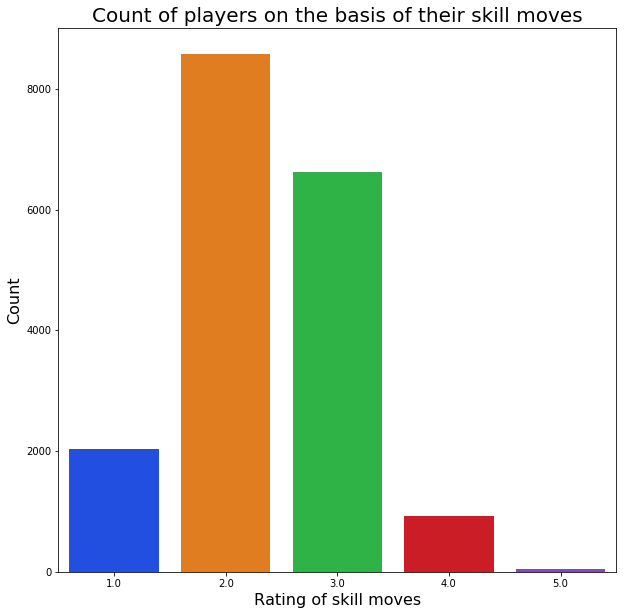

In [47]:
plt.figure(figsize = (10, 10))
ax = sns.countplot(x = 'Skill Moves', data = df, palette = 'bright')
ax.set_title(label = 'Count of players on the basis of their skill moves', fontsize = 20)
ax.set_xlabel(xlabel = 'Rating of skill moves', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
plt.show()

Representing share of weak foot of players using pie chart

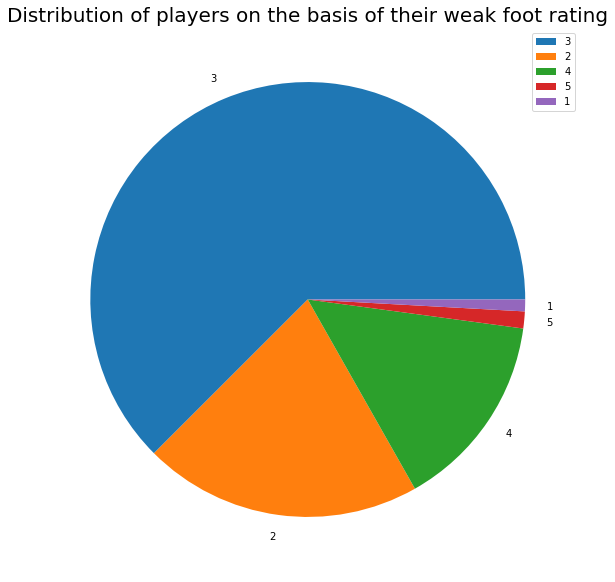

In [48]:
labels = ['3', '2', '4', '5', '1']
sizes = df['Weak Foot'].value_counts()
plt.rcParams['figure.figsize'] = (10, 10)
plt.pie(sizes, labels = labels)
plt.title('Distribution of players on the basis of their weak foot rating', fontsize = 20)
plt.legend()
plt.show()

Representing share of preferred foot of players using countplot

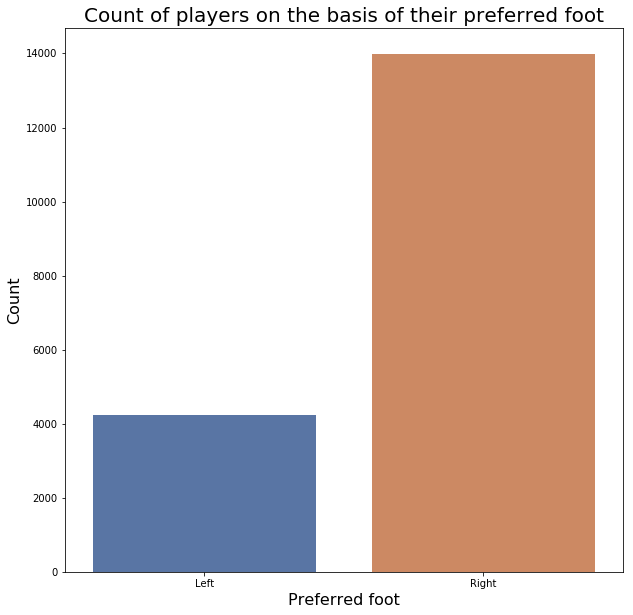

In [49]:
plt.figure(figsize = (10, 10))
ax = sns.countplot(x = 'Preferred Foot', data = df, palette = 'deep')
ax.set_title(label = 'Count of players on the basis of their preferred foot', fontsize = 20)
ax.set_xlabel(xlabel = 'Preferred foot', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
plt.show()

Representing share of international reputation of players using pie chart

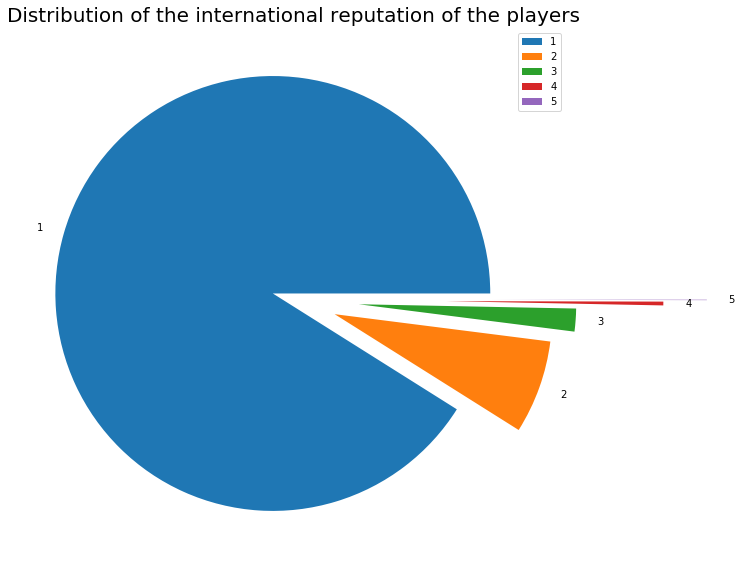

In [50]:
labels = ['1', '2', '3', '4', '5']
sizes = df['International Reputation'].value_counts()
explode = [0.1, 0.2, 0.3, 0.7, 0.9]

plt.rcParams['figure.figsize'] = (10, 10)
plt.pie(sizes, labels = labels, explode = explode)
plt.title('Distribution of the international reputation of the players', fontsize = 20)
plt.legend()
plt.show()

Representing wage range of players using distplot

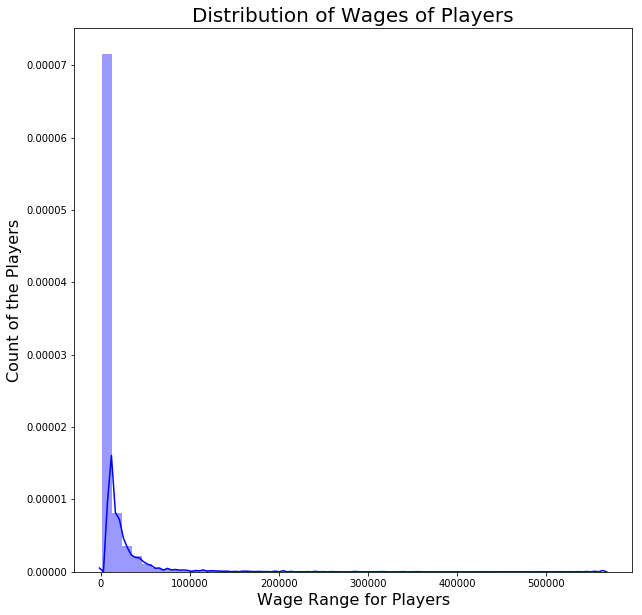

In [51]:
plt.rcParams['figure.figsize'] = (10, 10)
sns.distplot(df['Wage'], color = 'blue')
plt.xlabel('Wage Range for Players', fontsize = 16)
plt.ylabel('Count of the Players', fontsize = 16)
plt.title('Distribution of Wages of Players', fontsize = 20)
plt.show()

Inference-Most of the players have extremely low wages and only a few of the top players have wages above $100000

Representing number of players in different positions using countplot

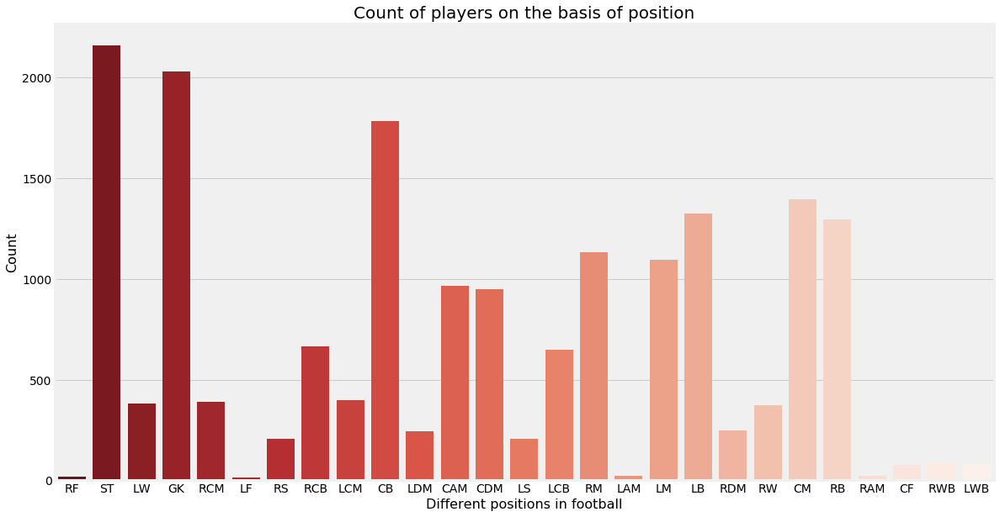

In [52]:
plt.figure(figsize = (20, 10))
plt.style.use('fivethirtyeight')
ax = sns.countplot('Position', data = df, palette = 'Reds_r')
ax.set_xlabel(xlabel = 'Different positions in football', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
ax.set_title(label = 'Count of players on the basis of position', fontsize = 20)
plt.show()

Representing distribution of work rate of players using countplot

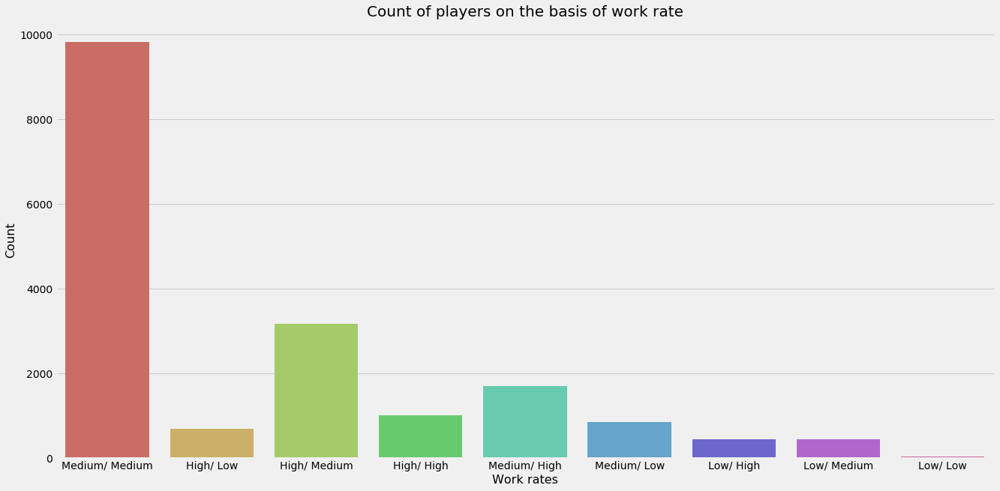

In [53]:
plt.figure(figsize = (20, 10))
plt.style.use('fast')
sns.countplot(x = 'Work Rate', data = df, palette = 'hls')
plt.title('Count of players on the basis of work rate', fontsize = 20)
plt.xlabel('Work rates', fontsize = 16)
plt.ylabel('Count', fontsize = 16)
plt.show()

Representing speciality scores of players using distplot

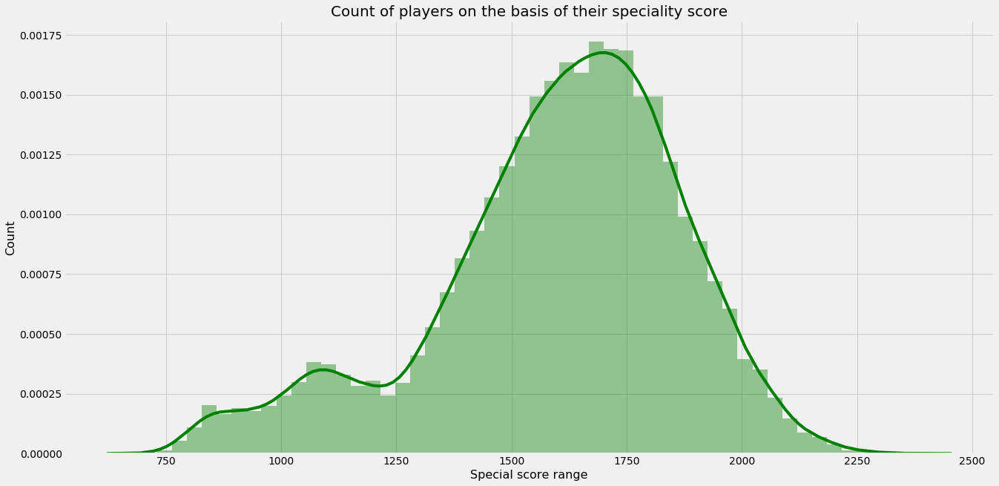

In [54]:
x = df.Special
plt.figure(figsize = (20, 10))
plt.style.use('tableau-colorblind10')
ax = sns.distplot(x, bins = 50, kde = True, color = 'g')
ax.set_xlabel(xlabel = 'Special score range', fontsize = 16)
ax.set_ylabel(ylabel = 'Count',fontsize = 16)
ax.set_title(label = 'Count of players on the basis of their speciality score', fontsize = 20)
plt.show()

Representing potential score of players using distplot

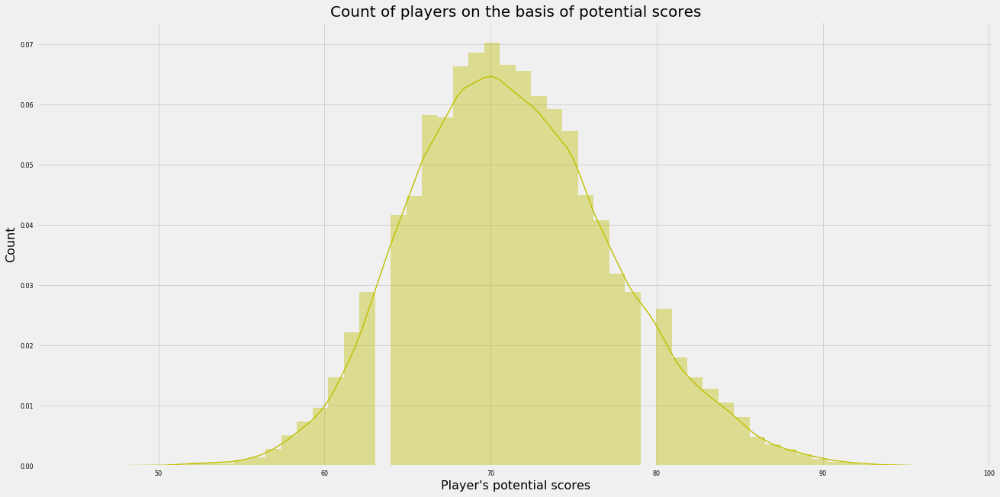

In [55]:
x = df.Potential
plt.figure(figsize = (20, 10))
plt.style.use('seaborn-paper')
ax = sns.distplot(x, bins = 50, color = 'y')
ax.set_xlabel(xlabel = "Player\'s potential scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
ax.set_title(label = 'Count of players on the basis of potential scores', fontsize = 20)
plt.show()

Representing overall score of players using distplot

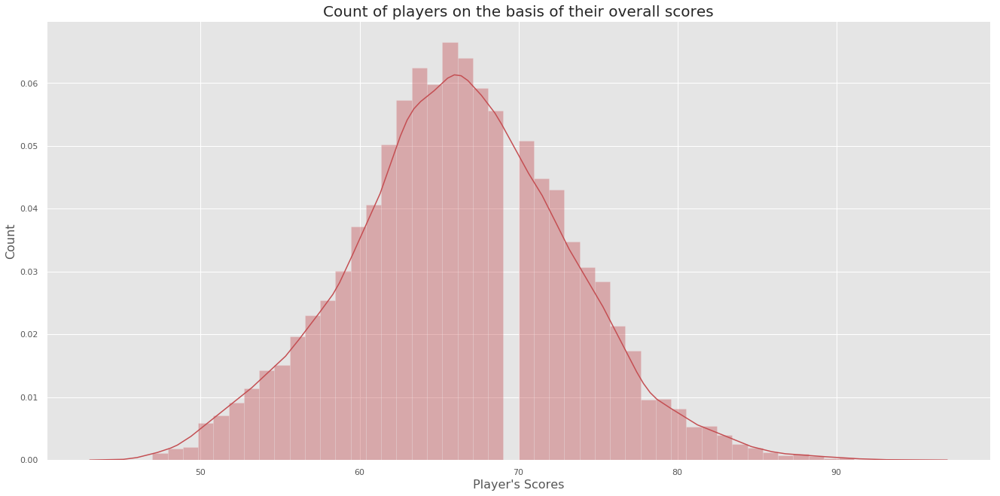

In [56]:
sns.set(style = "dark", palette = "deep", color_codes = True)
x = df.Overall
plt.figure(figsize = (20, 10))
plt.style.use('ggplot')
ax = sns.distplot(x, bins = 50, color = 'r')
ax.set_xlabel(xlabel = "Player\'s Scores", fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
ax.set_title(label = 'Count of players on the basis of their overall scores', fontsize = 20)
plt.show()

Plotting age against potential

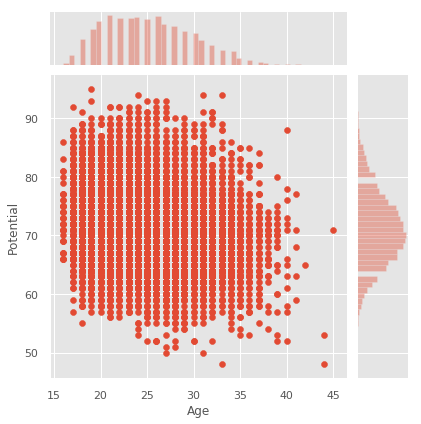

In [57]:
plt.style.use('fast')
sns.jointplot(x = 'Age', y = 'Potential', data = df)
plt.show()

Inference-As expected, the potential of players is greatest during their 20s and decrease with increase in age.

Plotting special against overall

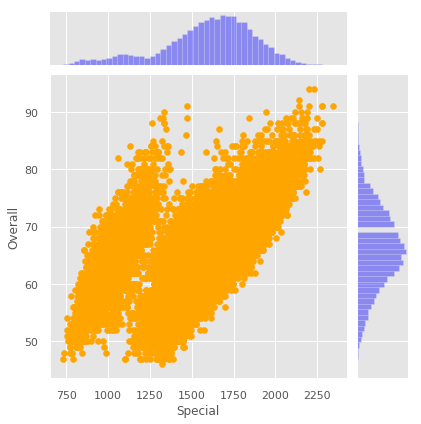

In [58]:
sns.jointplot(x = 'Special', y = 'Overall', data = df, joint_kws={'color':'orange'}, marginal_kws={'color':'blue'})
plt.show()

Inference-Overall rating has a high correlation with special rating.

Representing number of players from different countries using barplot

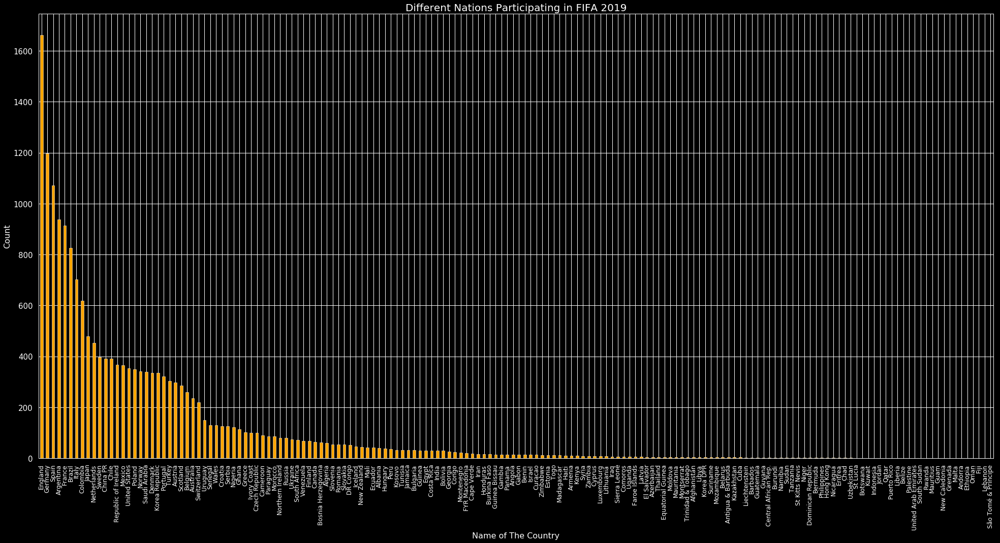

In [59]:
plt.style.use('dark_background')
df['Nationality'].value_counts().plot.bar(color = 'orange', figsize = (30, 15))
plt.title('Different Nations Participating in FIFA 2019', fontsize = 20)
plt.xlabel('Name of The Country', fontsize = 16)
plt.ylabel('Count', fontsize = 16)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 15)
plt.show()

Inference-The most number of players are from top European and South American footballing nations like England, Germany, Spain, Argentina, France, Brazil etc.

The top 4 features of players according to different positions

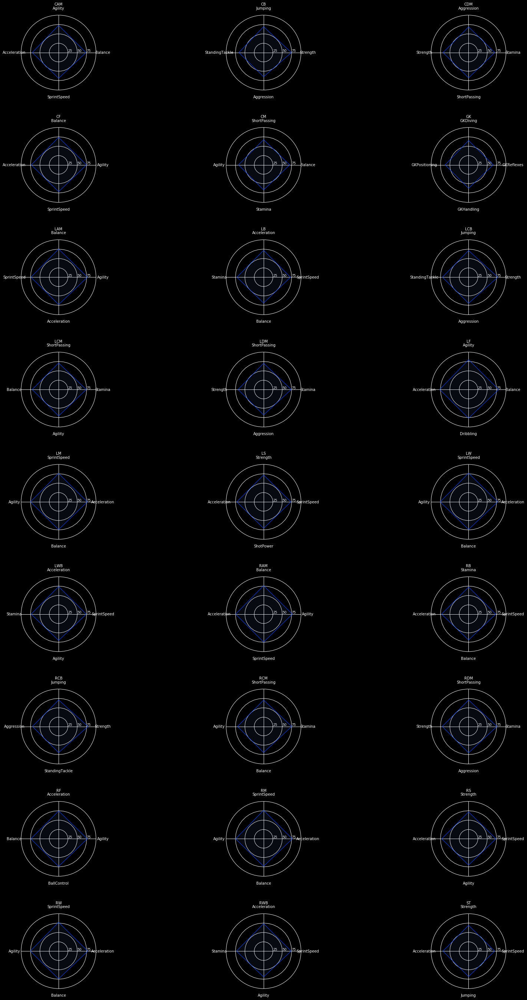

In [60]:
player_features = (
    'Acceleration', 'Aggression', 'Agility', 
    'Balance', 'BallControl', 'Composure', 
    'Crossing', 'Dribbling', 'FKAccuracy', 
    'Finishing', 'GKDiving', 'GKHandling', 
    'GKKicking', 'GKPositioning', 'GKReflexes', 
    'HeadingAccuracy', 'Interceptions', 'Jumping', 
    'LongPassing', 'LongShots', 'Marking', 'Penalties', 
    'ShortPassing', 'Volleys', 'Dribbling', 'Curve',
    'Finishing', 'Crossing', 'SprintSpeed', 'Reactions',
    'ShotPower', 'Stamina', 'Strength',
    'Positioning', 'StandingTackle', 'SlidingTackle'
)

from math import pi
idx = 1
plt.style.use('seaborn-bright')
plt.figure(figsize = (25,45))
for position_name, features in df.groupby(df['Position'])[player_features].mean().iterrows():
    top_features = dict(features.nlargest(4))
    
    # number of variable
    categories = top_features.keys()
    N = len(categories)

    # We are going to plot the first line of the data frame.
    # But we need to repeat the first value to close the circular graph:
    values = list(top_features.values())
    values += values[:1]

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(9, 3, idx, polar = True)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color = 'white', size = 10)
    
    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([25,50,75], ["25","50","75"], color = "white", size = 9)
    plt.ylim(0,100)
    
    plt.subplots_adjust(hspace = 0.5)
    
    # Plot data
    ax.plot(angles, values, linewidth = 1, linestyle = 'solid')

    # Fill area
    ax.fill(angles, values, 'b', alpha = 0.1)
    
    plt.title(position_name, size = 10, y = 1.1)
    
    idx += 1

Radar charts for a few of the top players

Credit:https://www.kaggle.com/typewind/draw-a-radar-chart-with-python-in-a-simple-way

Representing player's abilities on a few important parameters

In [61]:
labels = np.array(['Acceleration', 'Strength', 'Finishing',  
    'LongPassing', 'Penalties', 
    'ShortPassing', 'Volleys',
    'Finishing', 'Crossing', 'SprintSpeed',
    'ShotPower'])

stats = df.loc[0, labels].values
stats_1 = df.loc[1, labels].values
stats_2 = df.loc[2, labels].values

In [62]:
angles = np.linspace(0, 2 * np.pi, len(labels), endpoint = False)

# close the plot
stats = np.concatenate((stats, [stats[0]]))
stats_1 = np.concatenate((stats_1, [stats_1[0]]))
stats_2 = np.concatenate((stats_2, [stats_2[0]]))

angles = np.concatenate((angles, [angles[0]]))

Radar chart for Lionel Messi

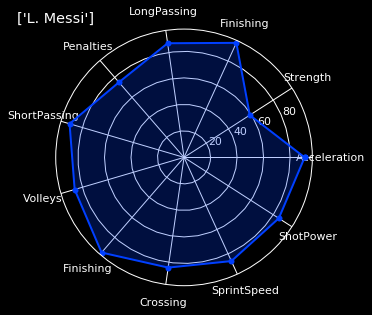

In [63]:
fig = plt.figure()
ax = fig.add_subplot(111, polar = True)
ax.plot(angles, stats, 'o-', linewidth = 2)
ax.fill(angles, stats, alpha = 0.25)
ax.set_thetagrids(angles * 180/np.pi, labels)
ax.set_title([df.loc[0, 'Name']], position = (0, 1))# Changing the 1st argument in df.loc will give the radar charts for different players
ax.grid(True)

Radar chart for Cristiano Ronaldo

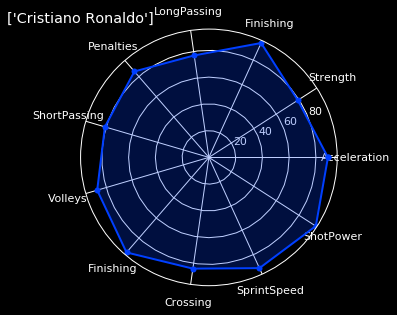

In [64]:
fig = plt.figure()
ax_1 = fig.add_subplot(111, polar = True)
ax_1.plot(angles, stats_1, 'o-', linewidth = 2)
ax_1.fill(angles, stats_1, alpha = 0.25)
ax_1.set_thetagrids(angles * 180/np.pi, labels)
ax_1.set_title([df.loc[1, 'Name']], position = (0, 1))
ax_1.grid(True)

Radar chart for Neymar Jr.

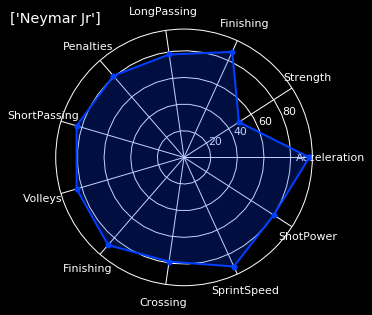

In [65]:
fig = plt.figure()
ax_2 = fig.add_subplot(111, polar = True)
ax_2.plot(angles, stats_2, 'o-', linewidth = 2)
ax_2.fill(angles, stats_2, alpha = 0.25)
ax_2.set_thetagrids(angles * 180/np.pi, labels)
ax_2.set_title([df.loc[2, 'Name']], position = (0, 1))
ax_2.grid(True)

Plotting overall rating against international reputation

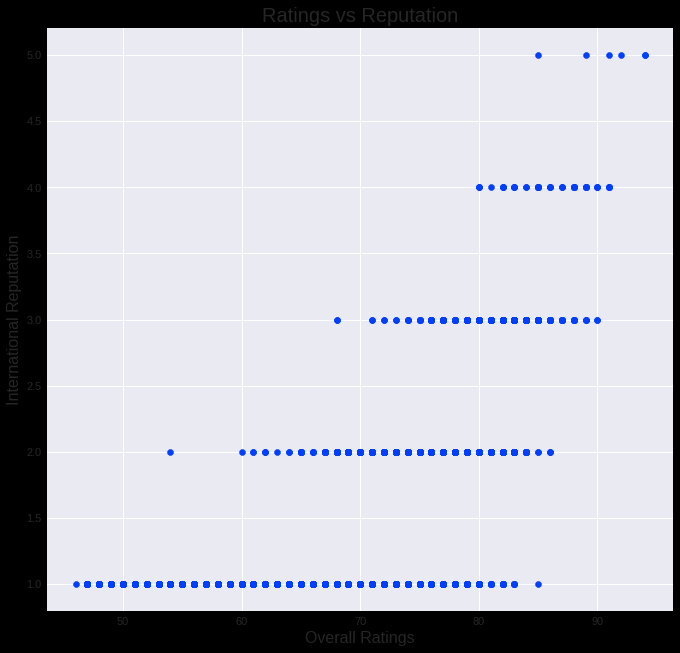

In [66]:
plt.figure(figsize = (10, 10))
plt.style.use('seaborn-darkgrid')
plt.scatter(df['Overall'], df['International Reputation'])
plt.xlabel('Overall Ratings', fontsize = 16)
plt.ylabel('International Reputation', fontsize = 16)
plt.title('Ratings vs Reputation', fontsize = 20)
plt.show()

There is definitely a positive correlation between international reputation and overall rating but surprisingly there are many players rated above 75 who have an international reputation of only 1.

Players with maximum potential grouped by position

In [67]:
df.loc[df.groupby(df['Position'])['Potential'].idxmax()][['Name', 'Position', 'Overall', 'Potential', 'Age', 'Nationality', 'Club']]

,Name,Position,Overall,Potential,Age,Nationality,Club
31,C. Eriksen,CAM,88,91,26,Denmark,Tottenham Hotspur
42,S. Umtiti,CB,87,92,24,France,FC Barcelona
27,Casemiro,CDM,88,90,26,Brazil,Real Madrid
350,A. Milik,CF,81,88,24,Poland,Napoli
78,S. Milinković-Savić,CM,85,90,23,Serbia,Lazio
3,De Gea,GK,91,93,27,Spain,Manchester United
28,J. Rodríguez,LAM,88,89,26,Colombia,FC Bayern München
35,Marcelo,LB,88,88,30,Brazil,Real Madrid
77,M. Škriniar,LCB,85,92,23,Slovakia,Inter
11,T. Kroos,LCM,90,90,28,Germany,Real Madrid


Players with maximum overall grouped by position

In [68]:
df.loc[df.groupby(df['Position'])['Overall'].idxmax()][['Name', 'Position', 'Overall', 'Age', 'Nationality', 'Club']]

,Name,Position,Overall,Age,Nationality,Club
17,A. Griezmann,CAM,89,27,France,Atlético Madrid
12,D. Godín,CB,90,32,Uruguay,Atlético Madrid
20,Sergio Busquets,CDM,89,29,Spain,FC Barcelona
271,Luis Alberto,CF,82,25,Spain,Lazio
67,Thiago,CM,86,27,Spain,FC Bayern München
3,De Gea,GK,91,27,Spain,Manchester United
28,J. Rodríguez,LAM,88,26,Colombia,FC Bayern München
35,Marcelo,LB,88,30,Brazil,Real Madrid
24,G. Chiellini,LCB,89,33,Italy,Juventus
11,T. Kroos,LCM,90,28,Germany,Real Madrid


Plotting mean of overall, age-wise

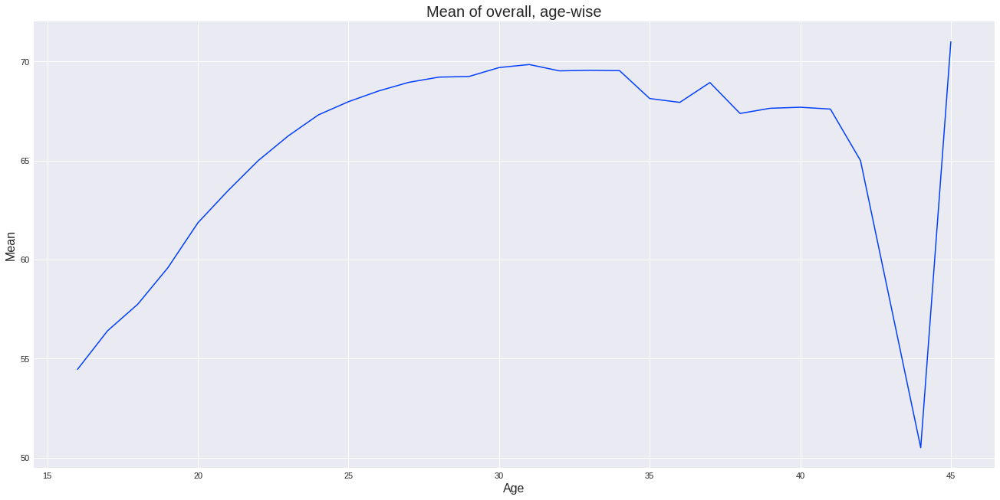

In [69]:
df.groupby('Age')['Overall'].mean().plot(figsize = (20, 10))
plt.xlabel('Age', fontsize = 16)
plt.ylabel('Mean', fontsize = 16)
plt.title('Mean of overall, age-wise', fontsize = 20)
plt.show()

Inference-As expected, the overall is highest during the 20s and starts decreasing with age. However, we see that suddenly it starts increasing around the age of 45, this might be due to outliers and so we will investigate further.

In [70]:
df['Age'].value_counts()

21    1423
26    1387
24    1358
22    1340
23    1332
25    1319
20    1240
27    1162
28    1101
19    1024
29     959
30     917
18     732
31     707
32     574
33     408
34     404
17     289
35     196
36     127
37      82
16      42
38      37
39      25
40      13
41       5
44       2
42       1
45       1
Name: Age, dtype: int64

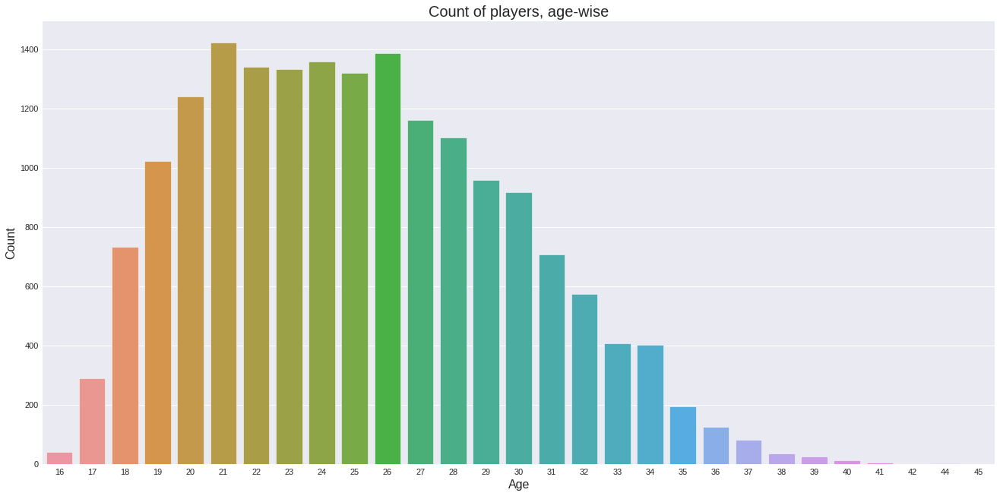

In [71]:
plt.style.use('seaborn-deep')
plt.figure(figsize = (20, 10))
sns.countplot(x = 'Age', data = df)
plt.xlabel('Age', fontsize = 16)
plt.ylabel('Count', fontsize = 16)
plt.title('Count of players, age-wise', fontsize = 20)
plt.show()

As we can observe, there are very few players above the age of 40 and this might be the reason for the anomaly observed in the overall mean vs. age plot.

In [72]:
df[df['Age'] > 40][['Name', 'Overall', 'Age', 'Nationality']]

,Name,Overall,Age,Nationality
1120,J. Villar,77,41,Paraguay
4228,B. Nivet,71,41,France
4741,O. Pérez,71,45,Mexico
7225,C. Muñoz,68,41,Argentina
10545,S. Narazaki,65,42,Japan
12192,H. Sulaimani,63,41,Saudi Arabia
15426,M. Tyler,59,41,England
17726,T. Warner,53,44,Trinidad & Tobago
18183,K. Pilkington,48,44,England


As we can see, the outliers are the reason for the high mean of players aged around 45.

The 15 youngest players of the dataset

In [73]:
df.sort_values('Age', ascending = True)[['Name', 'Age', 'Club', 'Nationality']].head(15)

,Name,Age,Club,Nationality
18206,G. Nugent,16,Tranmere Rovers,England
17743,J. Olstad,16,Sarpsborg 08 FF,Norway
13293,H. Massengo,16,AS Monaco,France
16081,J. Italiano,16,Perth Glory,Australia
18166,N. Ayéva,16,Örebro SK,Sweden
17712,K. Broda,16,Wisła Kraków,Poland
17354,L. D'Arrigo,16,Adelaide United,Australia
13567,Y. Verschaeren,16,RSC Anderlecht,Belgium
16927,B. Nygren,16,IFK Göteborg,Sweden
18018,B. O'Gorman,16,Bray Wanderers,Republic of Ireland


The 15 oldest players of the dataset

In [74]:
df.sort_values('Age', ascending = False)[['Name', 'Age', 'Club', 'Nationality']].head(15)

,Name,Age,Club,Nationality
4741,O. Pérez,45,Pachuca,Mexico
18183,K. Pilkington,44,Cambridge United,England
17726,T. Warner,44,Accrington Stanley,Trinidad & Tobago
10545,S. Narazaki,42,Nagoya Grampus,Japan
7225,C. Muñoz,41,CD Universidad de Concepción,Argentina
1120,J. Villar,41,No Club,Paraguay
12192,H. Sulaimani,41,Ohod Club,Saudi Arabia
15426,M. Tyler,41,Peterborough United,England
4228,B. Nivet,41,ESTAC Troyes,France
10356,F. Kippe,40,Lillestrøm SK,Norway


The top 10 left-footed footballers according to overall rating

In [75]:
df[df['Preferred Foot'] == 'Left'][['Name', 'Age', 'Club', 'Nationality']].head(10)

,Name,Age,Club,Nationality
0,L. Messi,31,FC Barcelona,Argentina
13,David Silva,32,Manchester City,Spain
15,P. Dybala,24,Juventus,Argentina
17,A. Griezmann,27,Atlético Madrid,France
19,T. Courtois,26,Real Madrid,Belgium
24,G. Chiellini,33,Juventus,Italy
26,M. Salah,26,Liverpool,Egypt
28,J. Rodríguez,26,FC Bayern München,Colombia
35,Marcelo,30,Real Madrid,Brazil
36,G. Bale,28,Real Madrid,Wales


The top 10 right-footed footballers according to overall rating

In [76]:
df[df['Preferred Foot'] == 'Right'][['Name', 'Age', 'Club', 'Nationality']].head(10)

,Name,Age,Club,Nationality
1,Cristiano Ronaldo,33,Juventus,Portugal
2,Neymar Jr,26,Paris Saint-Germain,Brazil
3,De Gea,27,Manchester United,Spain
4,K. De Bruyne,27,Manchester City,Belgium
5,E. Hazard,27,Chelsea,Belgium
6,L. Modrić,32,Real Madrid,Croatia
7,L. Suárez,31,FC Barcelona,Uruguay
8,Sergio Ramos,32,Real Madrid,Spain
9,J. Oblak,25,Atlético Madrid,Slovenia
10,R. Lewandowski,29,FC Bayern München,Poland


5. **Club level analysis**

The top clubs on the basis of average overall rating

In [77]:
d = {'Overall': 'Average_Rating'}
best_overall_club_df = df.groupby('Club').agg({'Overall' : 'mean'}).rename(columns = d)
clubs = best_overall_club_df.Average_Rating.nlargest(5).index
print(clubs)

Index(['Juventus', 'Napoli', 'Inter', 'Real Madrid', 'Milan'], dtype='object', name='Club')


The top clubs on the basis of attack

In [78]:
attck_list = ['Shooting', 'Power', 'Passing']

best_attack_df = players.groupby('Club')[attck_list].sum().sum(axis = 1)
clubs = best_attack_df.nlargest(6).index
print(clubs)

Index(['No Club', 'Manchester United', 'Liverpool', 'FC Barcelona',
       'Manchester City', 'Tottenham Hotspur'],
      dtype='object', name='Club')


'No Club' is on top as more than 200 players have not been assigned clubs which is much higher than the number of players in any club and hence the sum of attack of those players would be higher than that of any club.

The top clubs on the basis of defence

In [79]:
best_defense_df = players.groupby('Club')['Defending'].sum()
clubs = best_defense_df.nlargest(6).index
print(clubs)

Index(['No Club', 'FC Barcelona', 'Manchester United', 'Arsenal', 'Lazio',
       'Real Madrid'],
      dtype='object', name='Club')


The same reason as above for 'No Club' being at the top.

Finding the clubs with the most number of players

In [80]:
df['Club'].value_counts().head(15)

No Club                    241
FC Barcelona                33
AS Monaco                   33
TSG 1899 Hoffenheim         33
Eintracht Frankfurt         33
Chelsea                     33
Tottenham Hotspur           33
Burnley                     33
Liverpool                   33
Wolverhampton Wanderers     33
Manchester City             33
Valencia CF                 33
Rayo Vallecano              33
Newcastle United            33
Everton                     33
Name: Club, dtype: int64

Comparing the top clubs on the basis of a few important parameters

In [81]:
some_clubs = ('Manchester United', 'Arsenal', 'Juventus', 'Paris Saint-Germain', 'Napoli', 'Manchester City',
             'Tottenham Hotspur', 'FC Barcelona', 'Inter', 'Chelsea', 'Real Madrid', 'Borussia Dortmund', 'Liverpool', 'Roma', 'Ajax')

Representing distribution of overall rating in top clubs

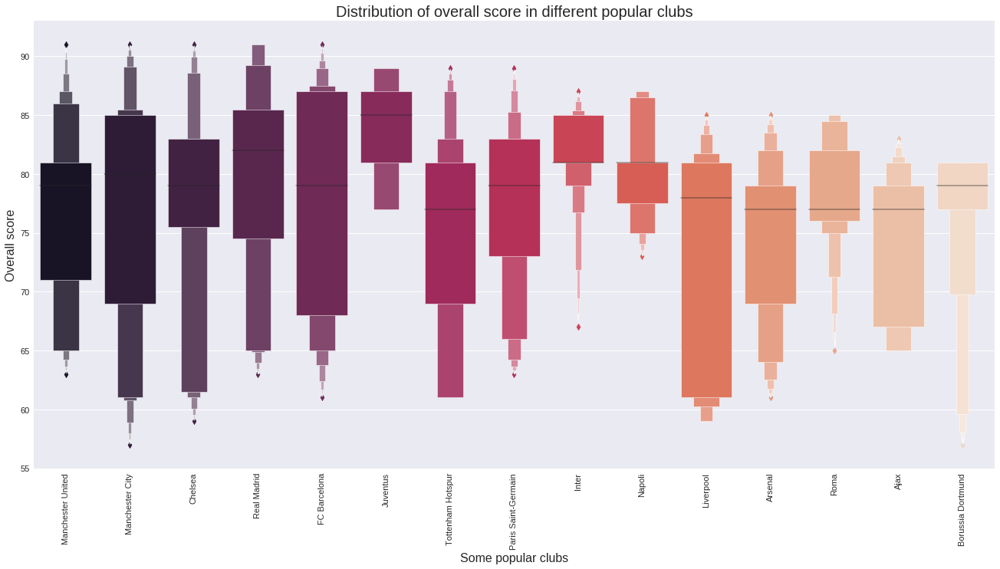

In [82]:
df_clubs = df.loc[df['Club'].isin(some_clubs) & df['Overall']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = df_clubs['Club'], y = df_clubs['Overall'], palette = 'rocket')
ax.set_xlabel(xlabel = 'Some popular clubs', fontsize = 16)
ax.set_ylabel(ylabel = 'Overall score', fontsize = 16)
ax.set_title(label = 'Distribution of overall score in different popular clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

Representing distribution of age in top clubs

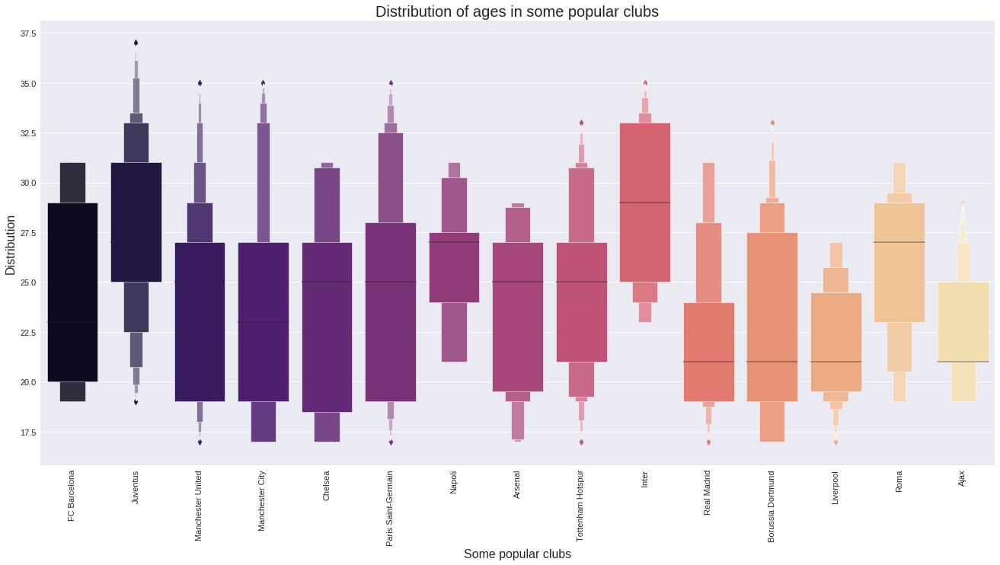

In [83]:
df_club = df.loc[df['Club'].isin(some_clubs) & df['Age']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = 'Club', y = 'Age', data = df_club, palette = 'magma')
ax.set_xlabel(xlabel = 'Some popular clubs', fontsize = 16)
ax.set_ylabel(ylabel = 'Distribution', fontsize = 16)
ax.set_title(label = 'Distribution of ages in some popular clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

Representing distribution of wages in top clubs

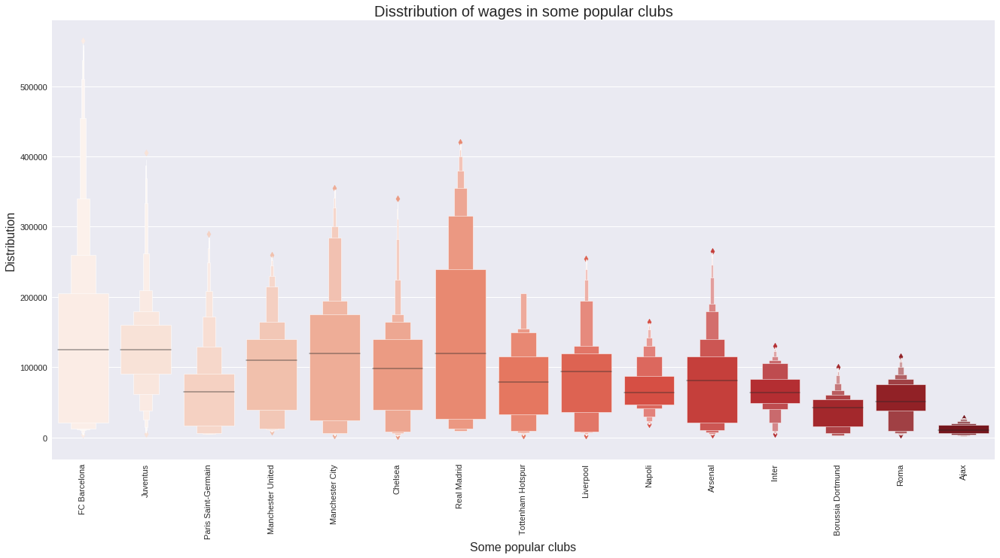

In [84]:
df_club = df.loc[df['Club'].isin(some_clubs) & df['Wage']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = 'Club', y = 'Wage', data = df_club, palette = 'Reds')
ax.set_xlabel(xlabel = 'Some popular clubs', fontsize = 16)
ax.set_ylabel(ylabel = 'Distribution', fontsize = 16)
ax.set_title(label = 'Disstribution of wages in some popular clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

Representing distribution of international reputation in top clubs

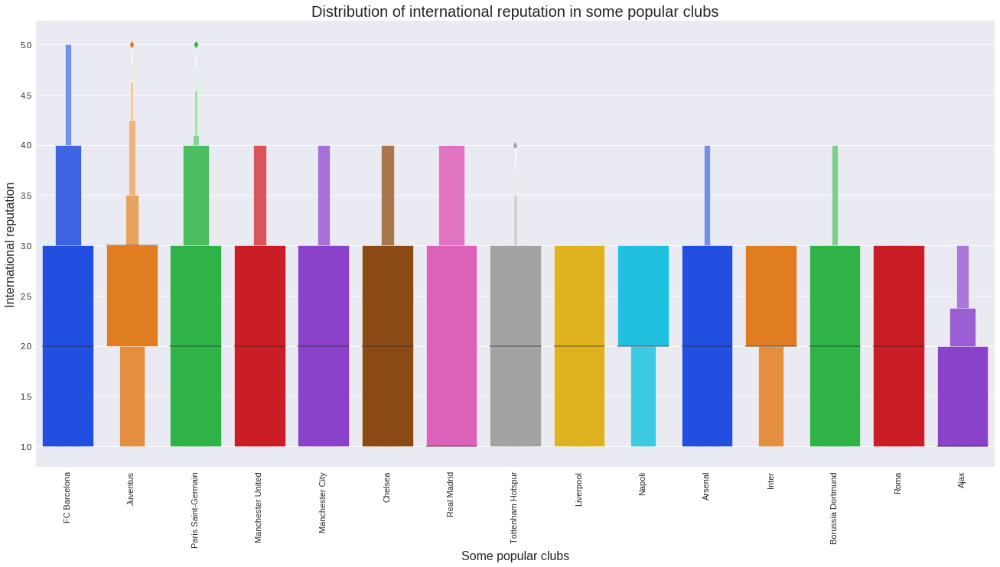

In [85]:
df_club = df.loc[df['Club'].isin(some_clubs) & df['International Reputation']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = 'Club', y = 'International Reputation', data = df_club, palette = 'bright')
ax.set_xlabel(xlabel = 'Some popular clubs', fontsize = 16)
ax.set_ylabel(ylabel = 'International reputation', fontsize = 16)
ax.set_title(label = 'Distribution of international reputation in some popular clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

Representing distribution of weight in top clubs

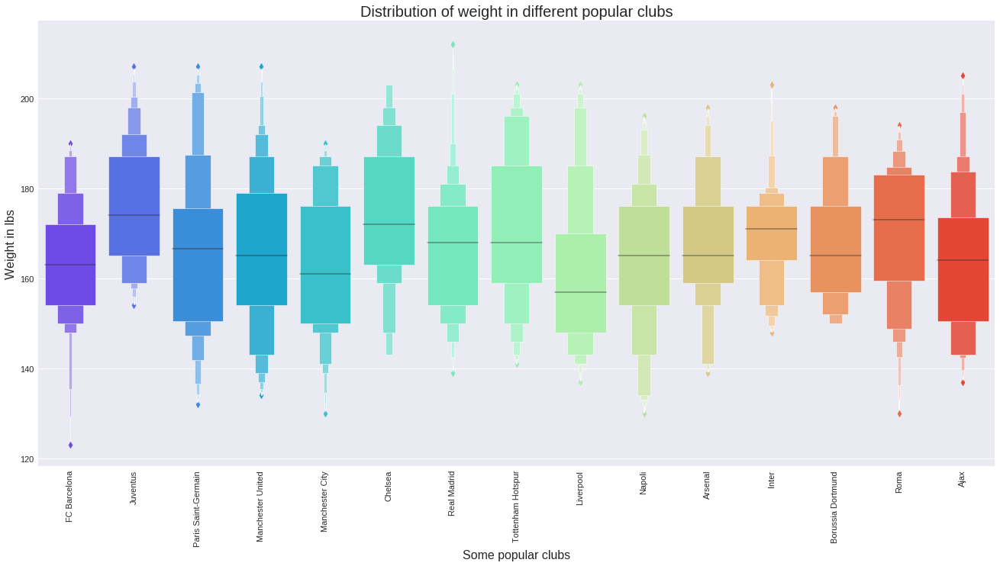

In [86]:
df_clubs = df.loc[df['Club'].isin(some_clubs) & df['Weight']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = 'Club', y = 'Weight', data = df_clubs, palette = 'rainbow')
ax.set_xlabel(xlabel = 'Some popular clubs', fontsize = 16)
ax.set_ylabel(ylabel = 'Weight in lbs', fontsize = 16)
ax.set_title(label = 'Distribution of weight in different popular clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

The clubs with players from highest number of different nationalities

In [87]:
df.groupby(df['Club'])['Nationality'].nunique().sort_values(ascending = False).head(11)

Club
No Club                   28
Brighton & Hove Albion    21
Fulham                    19
Udinese                   18
Napoli                    18
Empoli                    18
Eintracht Frankfurt       18
West Ham United           18
AS Monaco                 18
Lazio                     18
New York City FC          17
Name: Nationality, dtype: int64

The clubs with players from least number of different nationalities

In [88]:
df.groupby(df['Club'])['Nationality'].nunique().sort_values(ascending = True).head(10)

Club
Santos                       1
Ceará Sporting Club          1
América FC (Minas Gerais)    1
Paraná                       1
Chapecoense                  1
Padova                       1
Cittadella                   1
Sangju Sangmu FC             1
Ranheim Fotball              1
CA Osasuna                   1
Name: Nationality, dtype: int64

6. **National level analysis**

The top nations on the basis of average overall rating

In [89]:
d = {'Overall': 'Average_Rating'}
best_overall_country_df = df.groupby('Nationality').agg({'Overall':'mean'}).rename(columns = d)
nations = best_overall_country_df.Average_Rating.nlargest(5).index
print(nations)

Index(['United Arab Emirates', 'Central African Rep.', 'Israel',
       'Dominican Republic', 'Oman'],
      dtype='object', name='Nationality')


The top nations on the basis of attack

In [90]:
best_attack_nation_df = players.groupby('Nationality')[attck_list].sum().mean(axis = 1)
nations = best_attack_nation_df.nlargest(5).index
print(nations)

Index(['England', 'Germany', 'Spain', 'Argentina', 'France'], dtype='object', name='Nationality')


The top nations on the basis of defence

In [91]:
best_defense_nation_df = players.groupby('Nationality')['Defending'].sum()
nations = best_defense_nation_df.nlargest(5).index
print(nations)

Index(['England', 'Germany', 'Spain', 'France', 'Argentina'], dtype='object', name='Nationality')


Finding the nations with the most number of players

In [92]:
df['Nationality'].value_counts().head(15)

England                1662
Germany                1198
Spain                  1072
Argentina               937
France                  914
Brazil                  827
Italy                   702
Colombia                618
Japan                   478
Netherlands             453
Sweden                  397
China PR                392
Chile                   391
Republic of Ireland     368
Mexico                  366
Name: Nationality, dtype: int64

Comparing the top nations on the basis of a few important parameters

In [93]:
some_countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil', 'Italy', 'Colombia', 'Japan', 'Netherlands')

Representing distribution of weight in top nations

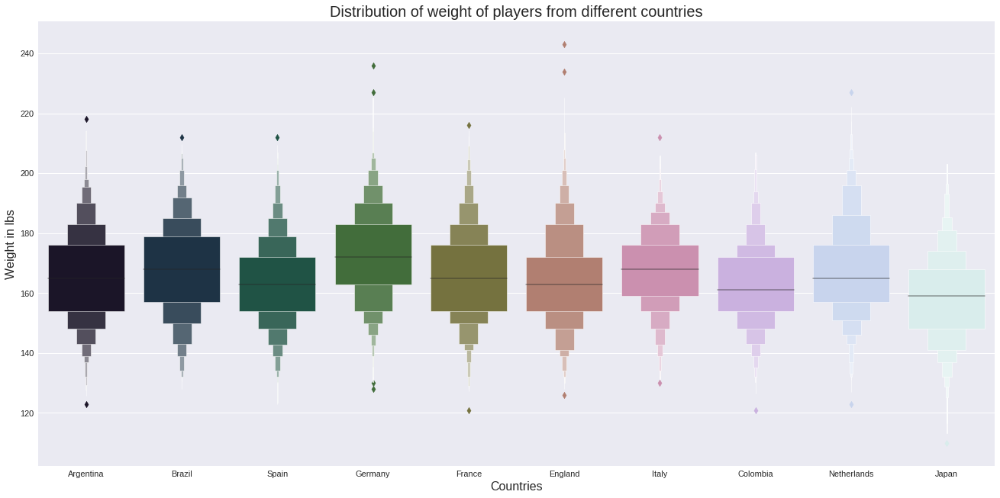

In [94]:
df_countries = df.loc[df['Nationality'].isin(some_countries) & df['Weight']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = df_countries['Nationality'], y = df_countries['Weight'], palette = 'cubehelix')
ax.set_xlabel(xlabel = 'Countries', fontsize = 16)
ax.set_ylabel(ylabel = 'Weight in lbs', fontsize = 16)
ax.set_title(label = 'Distribution of weight of players from different countries', fontsize = 20)
plt.show()

Representing distribution of overall rating in top nations

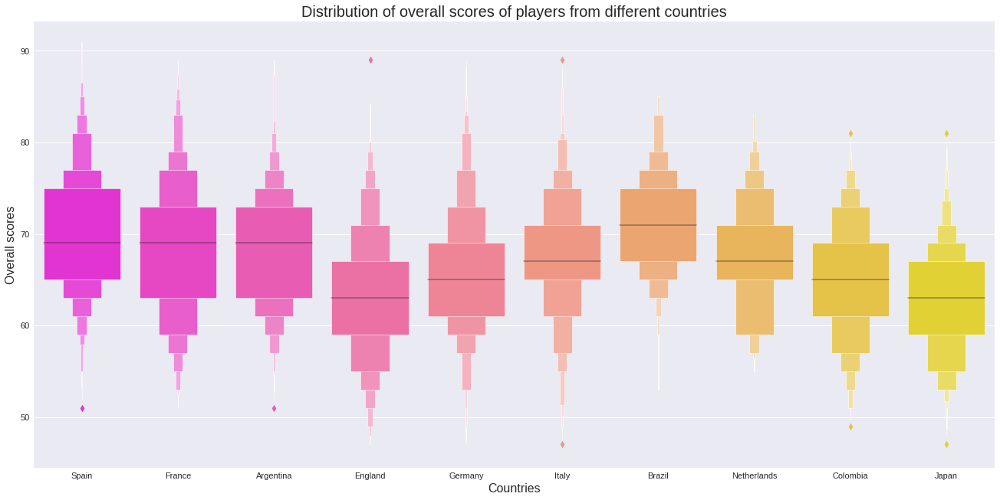

In [95]:
df_countries = df.loc[df['Nationality'].isin(some_countries) & df['Overall']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = df_countries['Nationality'], y = df_countries['Overall'], palette = 'spring')
ax.set_xlabel(xlabel = 'Countries', fontsize = 16)
ax.set_ylabel(ylabel = 'Overall scores', fontsize = 16)
ax.set_title(label = 'Distribution of overall scores of players from different countries', fontsize = 20)
plt.show()

Representing distribution of wages in top nations

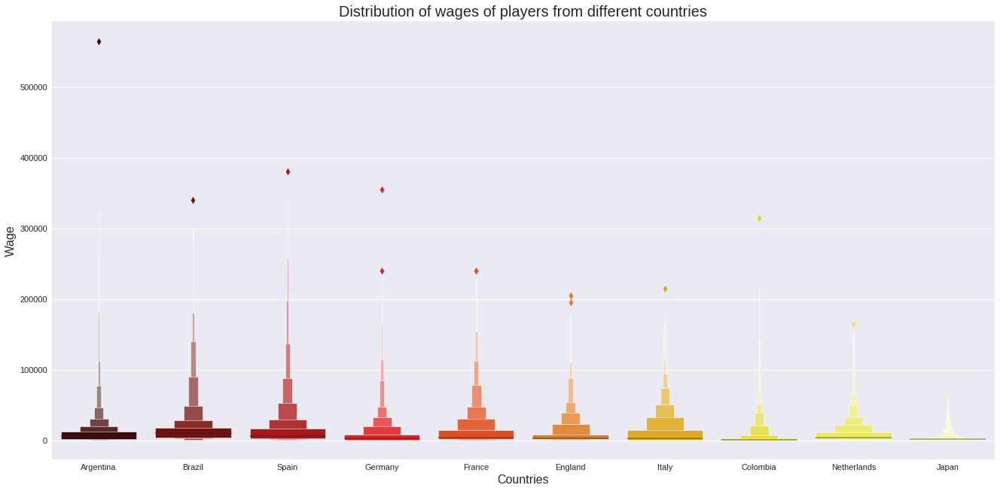

In [96]:
df_countries = df.loc[df['Nationality'].isin(some_countries) & df['Wage']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = df_countries['Nationality'], y = df_countries['Wage'], palette = 'hot')
ax.set_xlabel(xlabel = 'Countries', fontsize = 16)
ax.set_ylabel(ylabel = 'Wage', fontsize = 16)
ax.set_title(label = 'Distribution of wages of players from different countries', fontsize = 20)
plt.show()

Representing distribution of international reputation in top nations

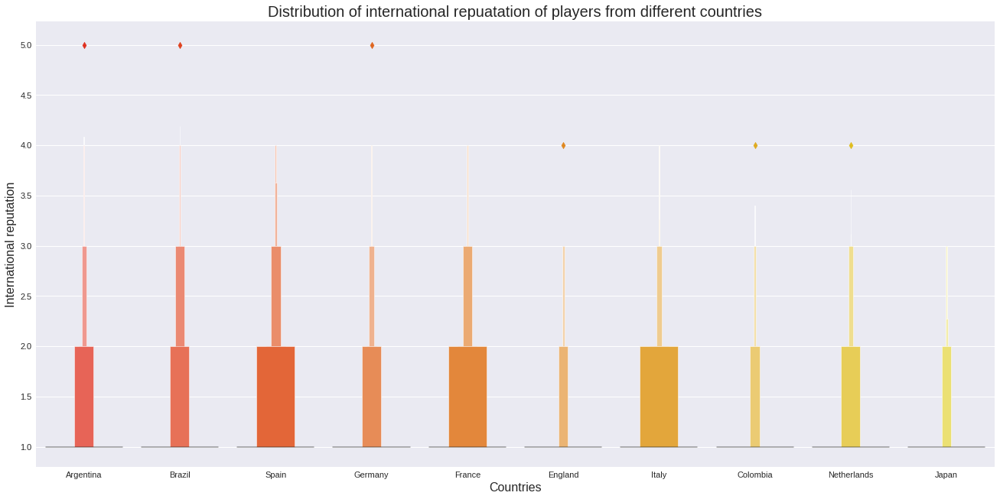

In [97]:
df_countries = df.loc[df['Nationality'].isin(some_countries) & df['International Reputation']]
plt.rcParams['figure.figsize'] = (20, 10)
ax = sns.boxenplot(x = df_countries['Nationality'], y = df_countries['International Reputation'], palette = 'autumn')
ax.set_xlabel(xlabel = 'Countries', fontsize = 16)
ax.set_ylabel(ylabel = 'International reputation', fontsize = 16)
ax.set_title(label = 'Distribution of international repuatation of players from different countries', fontsize = 20)
plt.show()

7. **Preparing data for modelling**

We will try to predict the overall rating of a player using various regression algorithms. For determining the important attributes for prediction, we will try to find correlation between them and then decide which attributes to use.

In [98]:
selected_columns = ['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value',
                    'Wage', 'Special', 'Preferred Foot', 'International Reputation', 'Weak Foot',
                    'Skill Moves', 'Work Rate', 'Body Type', 'Position', 'Height', 'Weight',
                    'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
                    'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
                    'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
                    'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
                    'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
                    'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
                    'GKKicking', 'GKPositioning', 'GKReflexes', 'Release Clause']

df_selected = pd.DataFrame(df, columns = selected_columns)
df_selected.columns

Index(['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value',
       'Wage', 'Special', 'Preferred Foot', 'International Reputation',
       'Weak Foot', 'Skill Moves', 'Work Rate', 'Body Type', 'Position',
       'Height', 'Weight', 'Finishing', 'HeadingAccuracy', 'ShortPassing',
       'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing',
       'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions',
       'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving',
       'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes',
       'Release Clause'],
      dtype='object')

In [99]:
df_selected.sample(5)

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
5700,Allan,21,Brazil,69,78,Eintracht Frankfurt,1600000.0,28000.0,1787,Left,...,56.0,40.0,54.0,49.0,5.0,5.0,7.0,13.0,14.0,0
10620,Y. Adli,17,France,65,84,Paris Saint-Germain,1100000.0,7000.0,1721,Right,...,65.0,59.0,57.0,55.0,14.0,12.0,9.0,10.0,14.0,€2.6M
582,F. Cervi,24,Argentina,79,84,SL Benfica,17000000.0,15000.0,1996,Left,...,81.0,42.0,50.0,53.0,12.0,8.0,9.0,11.0,10.0,€35.3M
14008,Y. Akgün,17,Turkey,61,79,Galatasaray SK,500000.0,5000.0,1491,Left,...,56.0,21.0,22.0,19.0,6.0,9.0,8.0,7.0,7.0,€1.3M
13352,B. Šerbečić,20,Bosnia Herzegovina,62,76,Rosenborg BK,600000.0,1000.0,1328,Right,...,46.0,64.0,64.0,59.0,10.0,14.0,8.0,7.0,9.0,€1.2M


Plotting a correlation heatmap

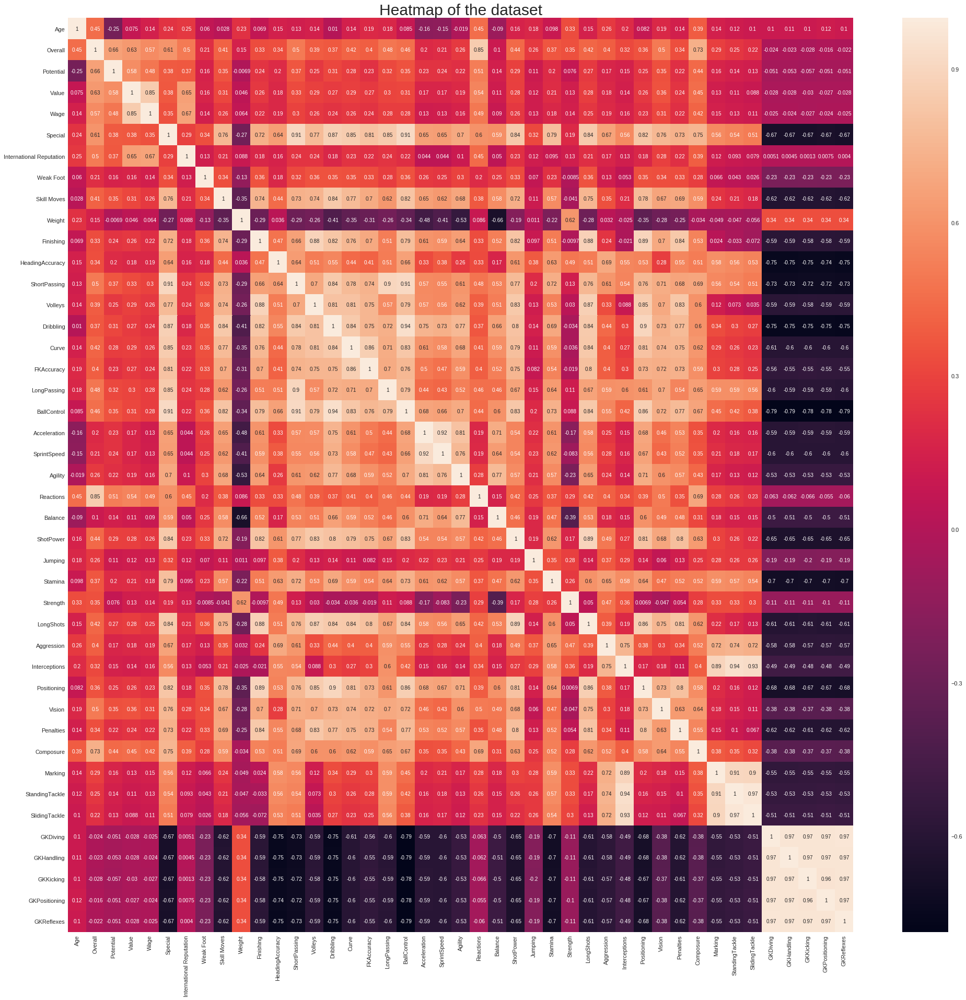

In [100]:
plt.rcParams['figure.figsize'] = (30, 30)
sns.heatmap(df_selected[['Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value',
                    'Wage', 'Special', 'Preferred Foot', 'International Reputation', 'Weak Foot',
                    'Skill Moves', 'Work Rate', 'Body Type', 'Position', 'Height', 'Weight',
                    'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
                    'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
                    'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
                    'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
                    'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
                    'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
                    'GKKicking', 'GKPositioning', 'GKReflexes', 'Release Clause']].corr(), annot = True)

plt.title('Heatmap of the dataset', fontsize = 30)
plt.show()

As we can observe, there is an extremely high correlation between the different attributes of a goalkeeper. We will plot a heatmap between these attributes.

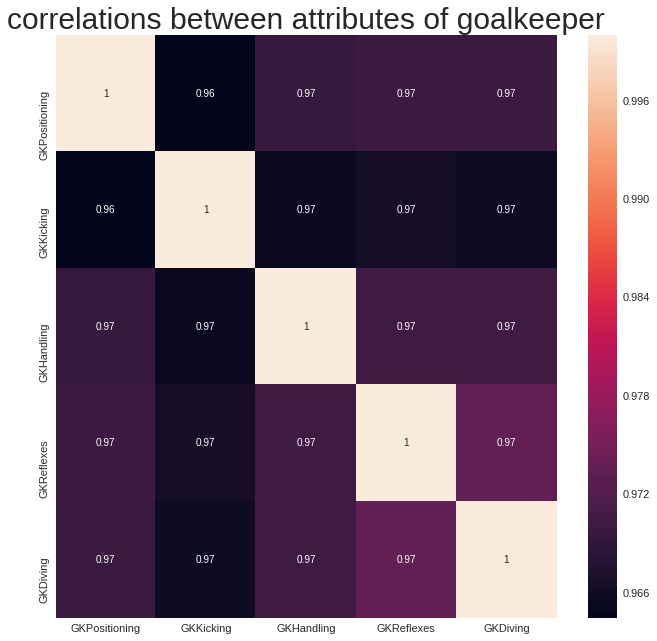

In [101]:
GK_attributes = df[['GKPositioning','GKKicking','GKHandling','GKReflexes','GKDiving']]

plt.rcParams['figure.figsize'] = (10, 10)
sns.heatmap(GK_attributes.corr(), annot = True)

plt.title('correlations between attributes of goalkeeper', fontsize = 30)
plt.show()

We will keep just 1 attribute out of these 5 as the other 4 attributes would be redundant for prediction.

Creating a new dataframe which will be used for prediction

In [102]:
dummy_df = df.copy()

Information about the types of columns in the dataframe.

In [103]:
print(dummy_df.keys())
print(dummy_df.shape)
print(dummy_df.select_dtypes(['O']).shape)        
print(dummy_df.select_dtypes([np.number]).shape)

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag',
       'Overall', 'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingT

Because of the high correlation between the attributes of a goalkeeper, we will only keep only 1 attribute out of the 5 as we do not want redundant features for our model.

In [104]:
dummy_df.drop(['GKPositioning', 'GKKicking', 'GKHandling', 'GKReflexes'], inplace = True, axis = 1)

Clearly, we also don't want to have 'rating' as one of our attributes as it is the mean of 'overall' and 'potential' and 'overall' is the variable which we want to predict.

In [105]:
dummy_df.drop(['Rating'], inplace = True, axis = 1)

'standing tackle', 'sliding tackle', 'marking' and 'interceptions' have extremely high correlation which is understandable since all of them are the attributes of a defender and thus we will only keep 'marking' for our model.

In [106]:
dummy_df.drop(['StandingTackle', 'SlidingTackle'], inplace = True, axis = 1)

In [107]:
dummy_df.drop(['Interceptions'], inplace = True, axis = 1)

'ball control' has a high correlation with 'dribbling' which makes sense since having a high or low rating in either one of them mostly implies the same for the other, implying that both the skills go hand in hand.

In [108]:
dummy_df.drop(['BallControl'], inplace = True, axis = 1)

'long shots' has a high correlation with 'shot power' since having a high or low rating in either of them automatically implies the same for the other as well in most of the cases.

In [109]:
dummy_df.drop(['LongShots'], inplace = True, axis = 1)

Searching for columns of string type which can be eliminated.

In [110]:
string_columns = dummy_df.select_dtypes(['O']).columns           
string_columns

Index(['Name', 'Photo', 'Nationality', 'Flag', 'Club', 'Club Logo',
       'Preferred Foot', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Joined', 'Loaned From', 'Contract Valid Until', 'Height', 'LS', 'ST',
       'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM',
       'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB',
       'RCB', 'RB', 'Release Clause'],
      dtype='object')

Clearly, we do not want columns such as 'Photo', 'Flag', 'Club Logo', 'Real Face', 'Joined', 'Loaned From', 'Contract Valid Until', 'Height', 'Release Clause', 'Preferred Foot', 'Nationality','LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW','LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM','CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Body Type'.

In [111]:
dummy_df.drop(['Photo', 'Flag', 'Club Logo', 'Real Face', 'Joined', 'Loaned From', 'Contract Valid Until', 'Height', 'Release Clause'],inplace = True,axis = 1)

In [112]:
dummy_df.drop(['Preferred Foot', 'Nationality'], inplace = True, axis = 1)

'Work rate' is an extremely important parameter for our model, but, we need to convert it to numeric type from string type since we can only use numeric values for the parameters in our model.

In [113]:
dummy_df[['w_r_attack','w_r_defence']] = dummy_df['Work Rate'].str.split('/',expand=True)

In [114]:
dummy_df.w_r_attack = dummy_df.w_r_attack.str.strip()
dummy_df.w_r_defence = dummy_df.w_r_defence.str.strip()

In [115]:
dummy_df.w_r_defence = dummy_df.w_r_defence.map({'High':3,'Medium':2,'Low':1})
dummy_df.w_r_attack = dummy_df.w_r_attack.map({'High':3,'Medium':2,'Low':1})

In [116]:
dummy_df.drop(['Work Rate'],inplace = True,axis = 1)

In [117]:
dummy_df.drop(['LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB'], inplace = True, axis = 1)

In [118]:
dummy_df.drop(['Body Type'], inplace = True, axis = 1)

In [119]:
string_columns = dummy_df.select_dtypes(['O']).columns           
string_columns

Index(['Name', 'Club', 'Position'], dtype='object')

Although we do not need the 'name' column for our model, we will keep it for referencing players later on and as far as the other 2 columns are concerned, we will encode them using scikit-learn's 'LabelEncoder' function.

In [120]:
le = LabelEncoder()
for column in string_columns[1:]:                                    
    dummy_df[column] = le.fit_transform(dummy_df[column])

In [121]:
string_columns = dummy_df.select_dtypes(['O']).columns      
string_columns

Index(['Name'], dtype='object')

Searching for columns of numeric type which can be eliminated.

In [122]:
number_columns = dummy_df.select_dtypes([np.number]).columns           
number_columns

Index(['Unnamed: 0', 'ID', 'Age', 'Overall', 'Potential', 'Club', 'Value',
       'Wage', 'Special', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Position', 'Jersey Number', 'Weight', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'Acceleration', 'SprintSpeed',
       'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina',
       'Strength', 'Aggression', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'GKDiving', 'Defending', 'General', 'Mental',
       'Passing', 'Mobility', 'Power', 'Shooting', 'w_r_attack',
       'w_r_defence'],
      dtype='object')

Clearly, we don't want columns such as 'Unnamed: 0', 'Jersey Number', 'ID'.

In [123]:
dummy_df.drop(['Unnamed: 0', 'Jersey Number', 'ID'], inplace = True, axis = 1)

In [124]:
dummy_df

,Name,Age,Overall,Potential,Club,Value,Wage,Special,International Reputation,Weak Foot,...,GKDiving,Defending,General,Mental,Passing,Mobility,Power,Shooting,w_r_attack,w_r_defence
0,L. Messi,31,94,94,212,110500000.0,565000.0,2202,5.0,4.0,...,6.0,29,89,71,87,91,74,88,2,2
1,Cristiano Ronaldo,33,94,94,326,77000000.0,405000.0,2228,5.0,4.0,...,7.0,27,88,73,81,91,83,88,3,1
2,Neymar Jr,26,92,93,436,118500000.0,290000.0,2143,5.0,5.0,...,9.0,28,85,72,80,94,69,84,3,2
3,De Gea,27,91,93,375,72000000.0,260000.0,1471,4.0,3.0,...,90.0,16,26,43,39,66,54,21,2,2
4,K. De Bruyne,27,91,92,374,102000000.0,355000.0,2281,4.0,5.0,...,15.0,59,79,81,92,81,76,85,3,3
5,E. Hazard,27,91,91,134,93000000.0,340000.0,2142,4.0,4.0,...,11.0,28,83,72,84,92,75,82,3,2
6,L. Modrić,32,91,91,471,67000000.0,420000.0,2280,4.0,4.0,...,13.0,70,81,80,89,84,77,78,3,3
7,L. Suárez,31,91,91,212,80000000.0,455000.0,2346,5.0,4.0,...,27.0,48,85,78,74,84,81,87,3,2
8,Sergio Ramos,32,91,91,471,51000000.0,380000.0,2201,4.0,3.0,...,11.0,90,78,77,74,78,82,68,3,2
9,J. Oblak,25,90,93,61,68000000.0,94000.0,1331,3.0,3.0,...,86.0,19,14,41,23,64,61,14,2,2


In [125]:
from sklearn.preprocessing import MinMaxScaler

We will create a new dataframe named 'dummy_df_scaled' which will contain the values of 'Value', 'Wage' and 'Special' between 0 and 1, since they are having a much higher range of values than the other columns, so, our model might give more importance to these columns which may result in a lower accuracy.

In [126]:
dummy_df_scaled = dummy_df.copy()

We will also train the linear regression algorithms on the unscaled data so as to compare the difference in performance for both, the unscaled and scaled dataset.

In [127]:
output_2 = dummy_df['Overall']
dummy_df.drop(['Overall'], inplace = True, axis = 1)

Changing the range of the values in all the numeric type columns of the data to (0, 1). 

In [128]:
scaling = MinMaxScaler(copy = False).fit(dummy_df_scaled.iloc[:, 1:])
dummy_df_scaled.iloc[:, 1:] = scaling.transform(dummy_df_scaled.iloc[:, 1:])

In [129]:
dummy_df_scaled

,Name,Age,Overall,Potential,Club,Value,Wage,Special,International Reputation,Weak Foot,...,GKDiving,Defending,General,Mental,Passing,Mobility,Power,Shooting,w_r_attack,w_r_defence
0,L. Messi,0.517241,1.000000,0.978723,0.325653,0.932489,1.000000,0.910836,1.00,0.75,...,0.066667,0.275862,1.000000,0.810811,0.940476,0.957143,0.790323,1.000000,0.5,0.5
1,Cristiano Ronaldo,0.586207,1.000000,0.978723,0.500768,0.649789,0.716312,0.926935,1.00,0.75,...,0.077778,0.252874,0.987654,0.837838,0.869048,0.957143,0.935484,1.000000,1.0,0.0
2,Neymar Jr,0.344828,0.958333,0.957447,0.669739,1.000000,0.512411,0.874303,1.00,1.00,...,0.100000,0.264368,0.950617,0.824324,0.857143,1.000000,0.709677,0.950617,1.0,0.5
3,De Gea,0.379310,0.937500,0.957447,0.576037,0.607595,0.459220,0.458204,0.75,0.50,...,1.000000,0.126437,0.222222,0.432432,0.369048,0.600000,0.467742,0.172840,0.5,0.5
4,K. De Bruyne,0.379310,0.937500,0.936170,0.574501,0.860759,0.627660,0.959752,0.75,1.00,...,0.166667,0.620690,0.876543,0.945946,1.000000,0.814286,0.822581,0.962963,1.0,1.0
5,E. Hazard,0.379310,0.937500,0.914894,0.205837,0.784810,0.601064,0.873684,0.75,0.75,...,0.122222,0.264368,0.925926,0.824324,0.904762,0.971429,0.806452,0.925926,1.0,0.5
6,L. Modrić,0.551724,0.937500,0.914894,0.723502,0.565401,0.742908,0.959133,0.75,0.75,...,0.144444,0.747126,0.901235,0.932432,0.964286,0.857143,0.838710,0.876543,1.0,1.0
7,L. Suárez,0.517241,0.937500,0.914894,0.325653,0.675105,0.804965,1.000000,1.00,0.75,...,0.300000,0.494253,0.950617,0.905405,0.785714,0.857143,0.903226,0.987654,1.0,0.5
8,Sergio Ramos,0.551724,0.937500,0.914894,0.723502,0.430380,0.671986,0.910217,0.75,0.50,...,0.122222,0.977011,0.864198,0.891892,0.785714,0.771429,0.919355,0.753086,1.0,0.5
9,J. Oblak,0.310345,0.916667,0.957447,0.093702,0.573840,0.164894,0.371517,0.50,0.50,...,0.955556,0.160920,0.074074,0.405405,0.178571,0.571429,0.580645,0.086420,0.5,0.5


8. **Modelling**

In [130]:
from sklearn.model_selection import train_test_split,cross_val_score,KFold
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.metrics import mean_squared_error
from IPython.display import display

/opt/conda/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


First of all, we will create a function which outputs a model's performance on various metrics and also prints details about the model's parameters.

The parameters to be passed to the function are:

1. model = Model to be used for prediction 

2. data = Data to be used for prediction(does not contain the column which is to be predicted)

3. output_df = The variable's column which is to be predicted

The function outputs the following:

1. R-squared score 

2. Root-mean-square error 

3. Cross-validation score

4. The error in the predicted value for each player

5. Limits of the error in prediction

6. Weights and constant of the linear model

7. Importance of each feature for the model

8. Prediction and residual plots

For understanding the different linear models such as Linear, Ridge, Lasso and ElasticNet regression, the importance of R-squared score and residual plot, take a look at the following links:

1. https://www.analyticsvidhya.com/blog/2017/06/a-comprehensive-guide-for-linear-ridge-and-lasso-regression/

2. https://blog.minitab.com/blog/adventures-in-statistics-2/why-you-need-to-check-your-residual-plots-for-regression-analysis

3. https://blog.minitab.com/blog/adventures-in-statistics-2/regression-analysis-how-do-i-interpret-r-squared-and-assess-the-goodness-of-fit

For more information about the 'PermutationImportance' function:

1. https://eli5.readthedocs.io/en/latest/blackbox/permutation_importance.html

In [131]:
def model_performance(model, data, output_df):
    
    # Splitting the data into train and test set
    x_train, x_test, y_train, y_test = train_test_split(data, output_df)
    
    train_names = x_train.iloc[:,0]
    x_train = x_train.iloc[:,1:]
    test_names = x_test.iloc[:,0]
    x_test = x_test.iloc[:,1:]
    
    start = time.time()
    model.fit(x_train, y_train)
    print("fitting time : {}".format(time.time()-start))

    start = time.time()
    y_pred = model.predict(x_test)
    print("\nModel's score is :", model.score(x_test, y_test))          # Returns the coefficient of determination R^2 of the prediction.
    print("testing time : {}".format(time.time() - start))
    
    print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
    
    #Cross-validation score
    crossScore = cross_val_score(model, X = data.iloc[:,1:], y = output_df, cv = KFold(n_splits = 5, shuffle = True)).mean()
    print("\nThe cross-validation score is:", crossScore) 
    
    comparisionRDF = pd.DataFrame(y_test)
    comparisionRDF['predicted'] = y_pred
    comparisionRDF['player Name'] = test_names
    comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
    print("\nThe error in the prediction for each player is:")
    print(comparisionRDF)
    
    #Limits of error
    print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))
    
    model.get_params()              
    weights = model.coef_           # Coefficients of all features/columns
    bias = model.intercept_         # Constant term in a linear line equation
    print("\nweights are:",weights)
    print("Constant is :",bias)
    
    print("\nThe importance of each feature for the model is:")
    perm = PermutationImportance(model).fit(x_test, y_test)
    display(eli5.show_weights(perm, feature_names = x_test.columns.tolist()))
    
    # Visualising the results
    plt.figure(figsize=(20, 10))
    sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
    plt.xlabel('Predictions')
    plt.ylabel('Overall')
    plt.title("Prediction of overall rating")
    plt.show()
    
    # Visualising the residual plot
    plt.figure(figsize=(20, 10))
    sns.scatterplot(y_pred, y_test - y_pred)
    plt.xlabel('Predictions')
    plt.ylabel('Residual')
    plt.title("Residual plot")
    plt.show()

Removing the 'Overall' column as it is the variable which we want to predict.

In [132]:
output = dummy_df_scaled['Overall']
dummy_df_scaled.drop(['Overall'], inplace = True, axis = 1)

In [133]:
from sklearn.linear_model import LinearRegression

fitting time : 0.0384366512298584

Model's score is : 0.9336445225439951
testing time : 0.0026667118072509766

RMSE : 0.037236218924864374

The cross-validation score is: 0.9311285896270783

The error in the prediction for each player is:
        Overall  predicted     player Name  error in Prediction
15157  0.291667   0.300168       Z. Medley             0.008501
8339   0.437500   0.416236     S. Jamieson             0.021264
1052   0.645833   0.617665      R. Inglese             0.028169
12198  0.354167   0.364185       A. Pierre             0.010019
10857  0.395833   0.448408     Q. Maceiras             0.052575
10499  0.395833   0.375426       G. Modica             0.020407
8887   0.416667   0.445022      L. Trotter             0.028355
4067   0.520833   0.516921        J. Grimm             0.003912
8310   0.437500   0.463303      R. Perraud             0.025803
13270  0.333333   0.123514        Vinicius             0.209819
13575  0.333333   0.299438       J. Murray             0.

Weight,Feature
2.0897 ± 0.0694,Special
0.3648 ± 0.0163,Potential
0.2711 ± 0.0095,Shooting
0.2697 ± 0.0108,General
0.2370 ± 0.0091,Age
0.1045 ± 0.0025,Defending
0.0763 ± 0.0037,Mental
0.0735 ± 0.0028,Dribbling
0.0603 ± 0.0034,Curve
0.0451 ± 0.0012,Reactions


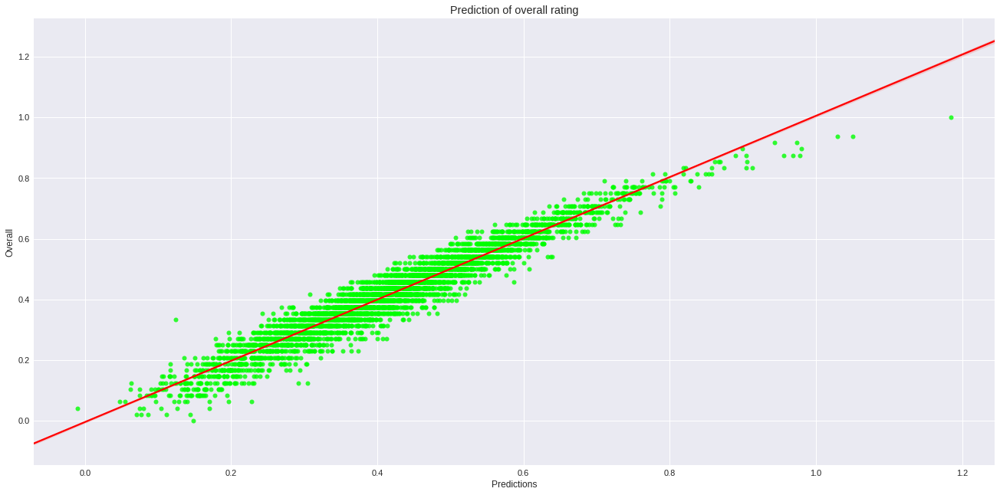

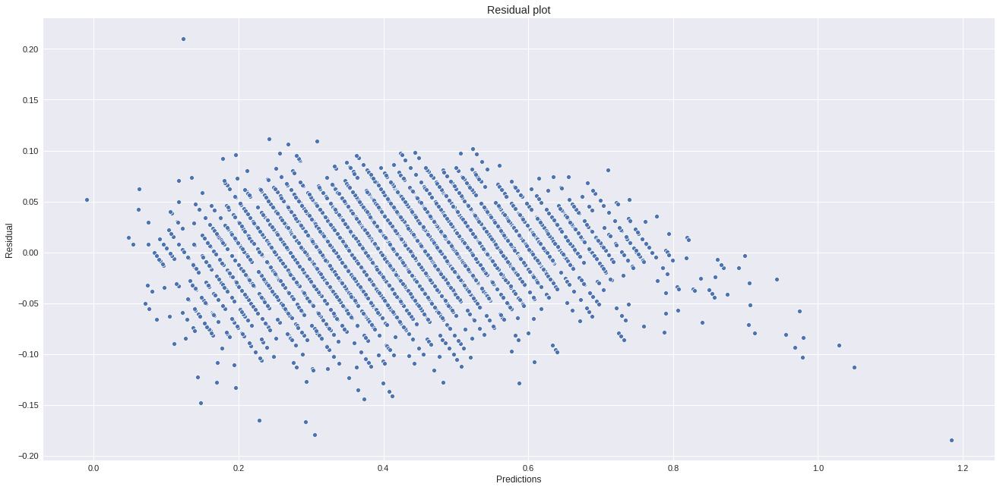

fitting time : 0.014963626861572266

Model's score is : 0.9307707654764227
testing time : 0.003330707550048828

RMSE : 1.835479554713433

The cross-validation score is: 0.9311457744480535

The error in the prediction for each player is:
       Overall  predicted       player Name  error in Prediction
6407        69  69.988168         S. Ekramy             0.988168
15026       60  63.075675         F. Rohner             3.075675
12817       63  63.074718     D. Stojanović             0.074718
15350       59  56.200550     Nuno Malheiro             2.799450
1436        76  77.056304      D. Limberský             1.056304
777         78  76.566965           K. Tete             1.433035
2846        73  73.284691         Cristiano             0.284691
16671       57  57.167452          S. Dieng             0.167452
18054       50  53.846009           C. Mesa             3.846009
9153        66  67.484760         A. Acosta             1.484760
9784        66  64.388420  C. Schösswendter     

Weight,Feature
2.0472 ± 0.0455,Special
0.3607 ± 0.0152,Potential
0.2807 ± 0.0059,Shooting
0.2361 ± 0.0085,Age
0.2263 ± 0.0062,General
0.1016 ± 0.0056,Defending
0.0834 ± 0.0031,Mental
0.0583 ± 0.0014,Dribbling
0.0510 ± 0.0023,Curve
0.0451 ± 0.0011,Reactions


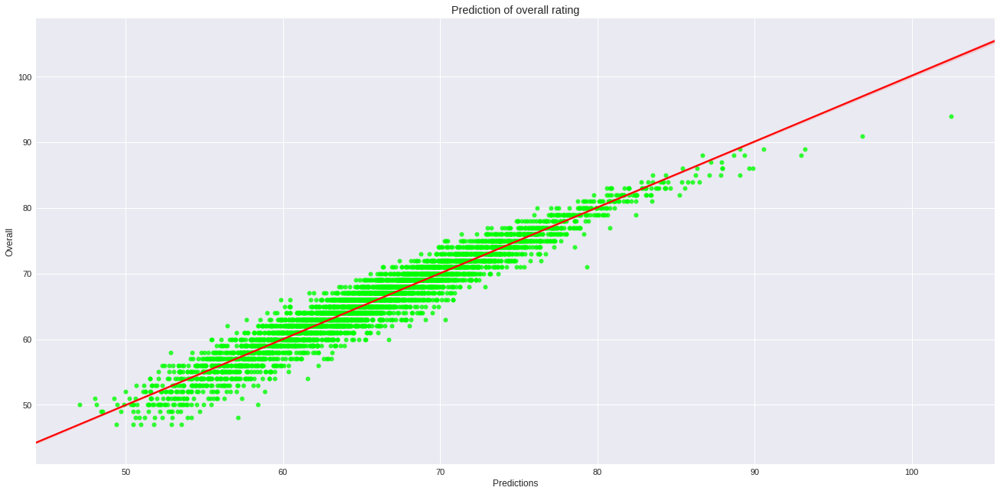

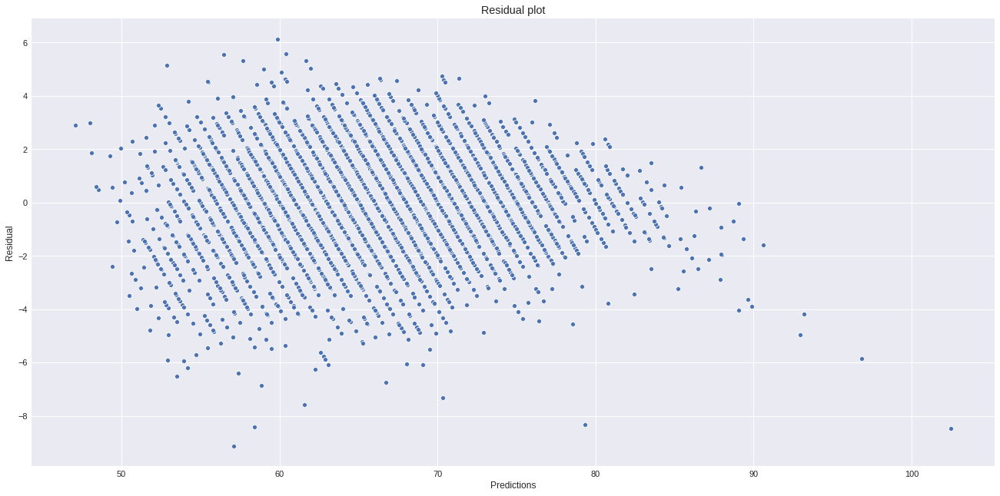

In [134]:
model = LinearRegression() 
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

The accuracy of the algorithm for both, unscaled and scaled data is similar, the reason for which is explained in the following link:
https://www.quora.com/Do-I-need-to-do-feature-scaling-for-simple-linear-regression

Let us try Ridge regression, which applies the L2 penalty.

In [135]:
from sklearn.linear_model import Ridge

fitting time : 0.013288497924804688

Model's score is : 0.929148971227334
testing time : 0.002603769302368164

RMSE : 0.038113071540787365

The cross-validation score is: 0.9305065639098835

The error in the prediction for each player is:
        Overall  predicted         player Name  error in Prediction
12671  0.354167   0.326901          A. Vrenezi             0.027266
7204   0.458333   0.460024         E. Knudtzon             0.001690
6482   0.479167   0.428799           Jon Toral             0.050368
13323  0.333333   0.390583          A. Poulsen             0.057250
7715   0.437500   0.378636              J. Aja             0.058864
9286   0.416667   0.420435         S. Anderson             0.003768
13217  0.333333   0.319869          W. Omsberg             0.013464
13514  0.333333   0.305605            B. Mwila             0.027728
9732   0.416667   0.427035            D. Stahl             0.010369
754    0.666667   0.668880             Vallejo             0.002213
3835   0.5416

Weight,Feature
0.4956 ± 0.0122,Special
0.3708 ± 0.0097,Potential
0.2434 ± 0.0039,Age
0.1540 ± 0.0061,General
0.1036 ± 0.0050,GKDiving
0.0547 ± 0.0021,Reactions
0.0363 ± 0.0012,Shooting
0.0326 ± 0.0022,Defending
0.0254 ± 0.0025,Curve
0.0221 ± 0.0002,Dribbling


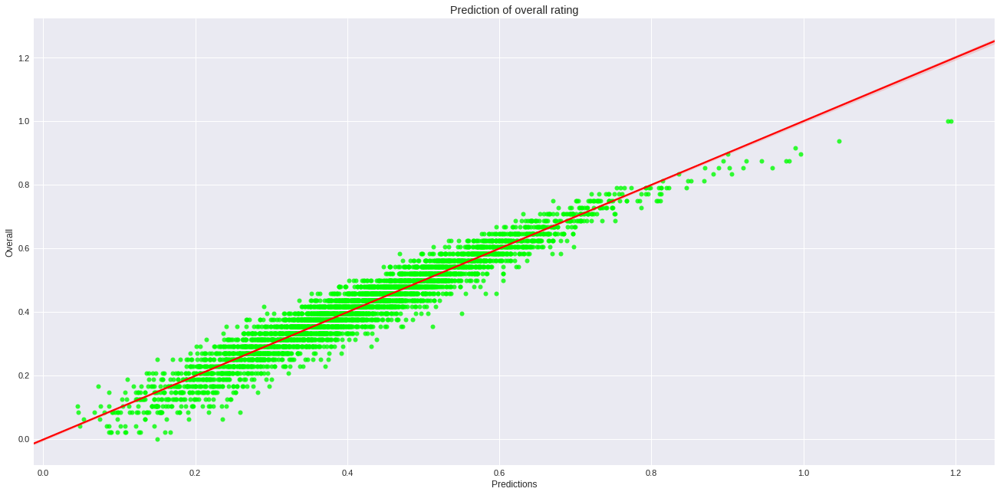

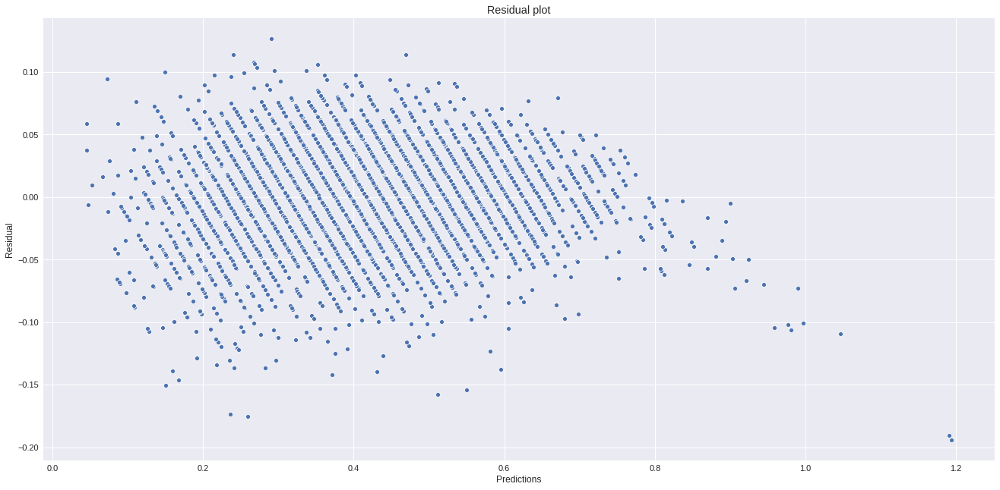

fitting time : 0.0058786869049072266

Model's score is : 0.930516581834023
testing time : 0.003046751022338867

RMSE : 1.8405223416168164

The cross-validation score is: 0.9309494340652101

The error in the prediction for each player is:
       Overall  predicted          player Name  error in Prediction
6360        69  70.044015              N. Lima             1.044015
3221        72  71.188242            J. Cuevas             0.811758
14773       60  61.484646         A. Al Hamdan             1.484646
2865        73  73.116853           F. Aguilar             0.116853
6114        69  70.916026       V. Demarconnay             1.916026
6408        69  67.097548          Júlio César             1.902452
14453       61  62.199147             P. Smyth             1.199147
12005       64  65.424761              L. Zima             1.424761
14043       61  60.351884           S. Bennett             0.648116
16013       58  57.815183            J. Debayo             0.184817
11903       64

Weight,Feature
2.0749 ± 0.0356,Special
0.3753 ± 0.0041,Potential
0.2811 ± 0.0078,Shooting
0.2464 ± 0.0050,Age
0.2292 ± 0.0043,General
0.1014 ± 0.0056,Defending
0.0749 ± 0.0030,Mental
0.0604 ± 0.0044,Dribbling
0.0507 ± 0.0024,Curve
0.0351 ± 0.0020,Reactions


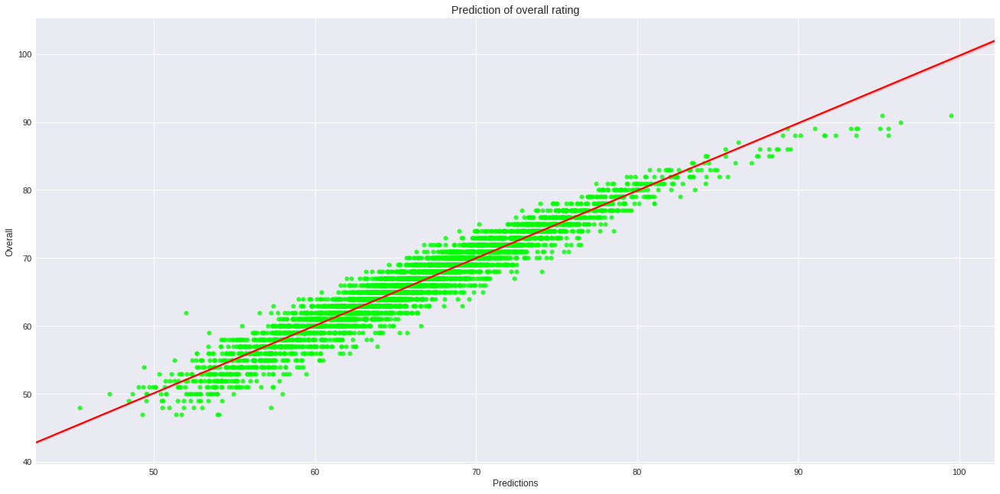

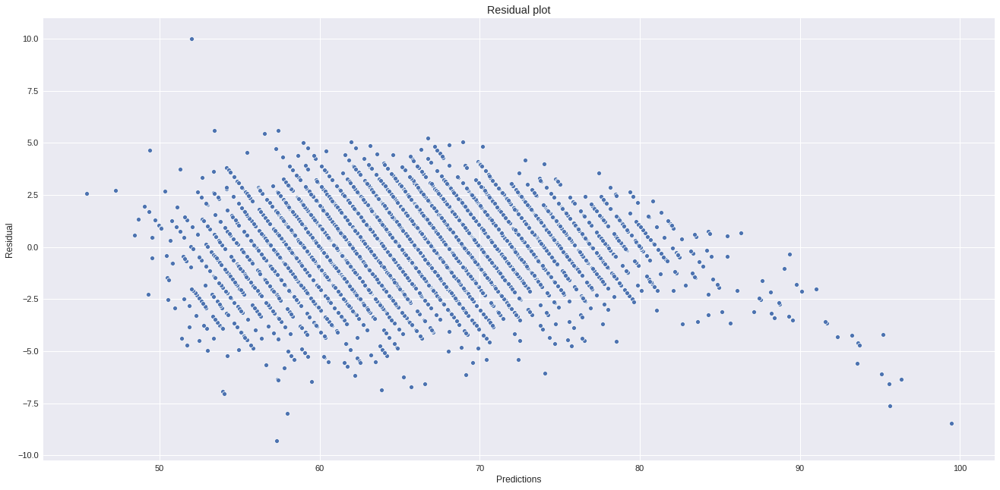

In [136]:
model = Ridge()
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

The residual plot for Ridge regression with the value of alpha as 1 looks better compared to Linear regression for both scaled and unscaled data, probably due to the penalty term which is added in Ridge regression.

fitting time : 0.004872560501098633

Model's score is : 0.9304257125438257
testing time : 0.002439737319946289

RMSE : 0.03777571337292401

The cross-validation score is: 0.9311047526441465

The error in the prediction for each player is:
        Overall  predicted       player Name  error in Prediction
16440  0.229167   0.301225         S. Osorio             0.072058
5193   0.500000   0.458102           N. Dyer             0.041898
3345   0.541667   0.497656  Vieiraldo Junior             0.044011
10277  0.395833   0.378789    Rúben Lameiras             0.017044
4654   0.520833   0.544019   K. Galanopoulos             0.023186
14918  0.291667   0.340835       L. Czyborra             0.049168
10804  0.395833   0.384875        B. Verboom             0.010958
8617   0.437500   0.450189          T. Kløve             0.012689
2508   0.583333   0.574835          M. Diouf             0.008499
10930  0.395833   0.403171    G. Castrovilli             0.007338
2694   0.562500   0.505670         

Weight,Feature
2.0275 ± 0.0545,Special
0.3601 ± 0.0098,Potential
0.2576 ± 0.0053,Shooting
0.2528 ± 0.0082,Age
0.2417 ± 0.0061,General
0.1114 ± 0.0051,Defending
0.0622 ± 0.0024,Mental
0.0578 ± 0.0028,Dribbling
0.0520 ± 0.0027,Curve
0.0437 ± 0.0016,Reactions


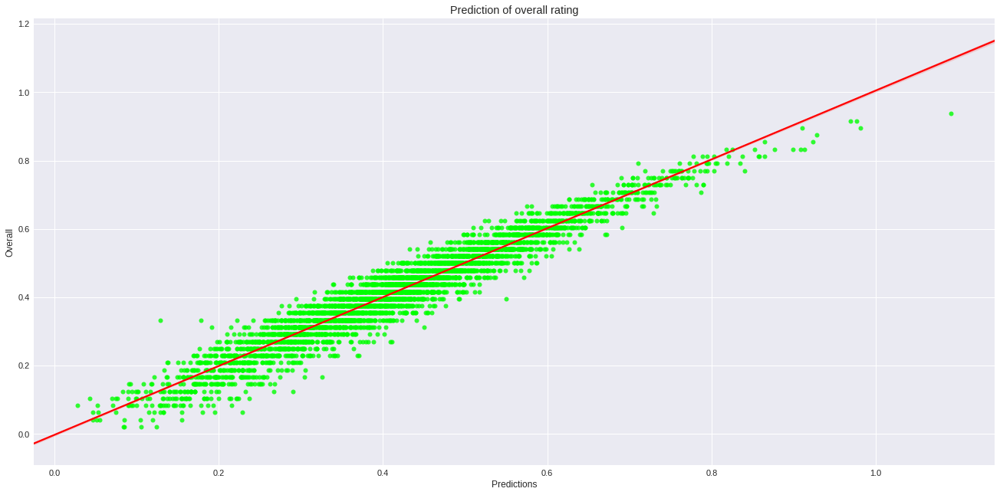

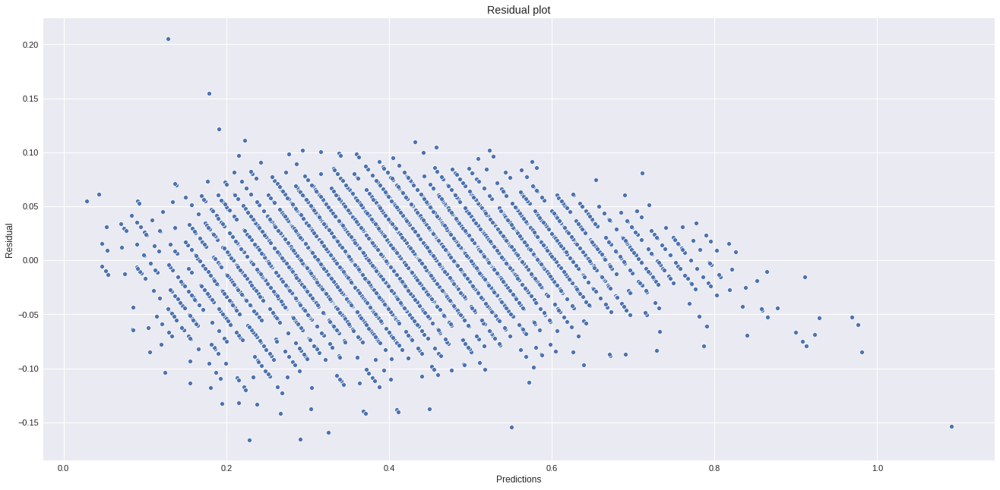

fitting time : 0.0057795047760009766

Model's score is : 0.9340914887190489
testing time : 0.0031957626342773438

RMSE : 1.7980059275269342

The cross-validation score is: 0.9310646768436139

The error in the prediction for each player is:
       Overall  predicted          player Name  error in Prediction
9568        66  64.484133          C. Gonzáles             1.515867
15798       59  59.963591           A. Beyazıt             0.963591
7090        68  70.166505             R. Würtz             2.166505
6632        68  67.312661                 Avto             0.687339
15729       59  58.725207             O. Drost             0.274793
393         81  81.129876          A. Candreva             0.129876
8736        67  65.171764            S. Muroya             1.828236
791         78  77.509015          N. Bentaleb             0.490985
3933        72  71.012880  Alexandre Frandeira             0.987120
5688        69  69.411929            M. Olsson             0.411929
4859        

Weight,Feature
2.0187 ± 0.0508,Special
0.3562 ± 0.0097,Potential
0.3100 ± 0.0102,Shooting
0.2337 ± 0.0062,Age
0.2108 ± 0.0082,General
0.1012 ± 0.0019,Defending
0.0582 ± 0.0038,Passing
0.0578 ± 0.0026,Mental
0.0471 ± 0.0031,Dribbling
0.0469 ± 0.0021,Curve


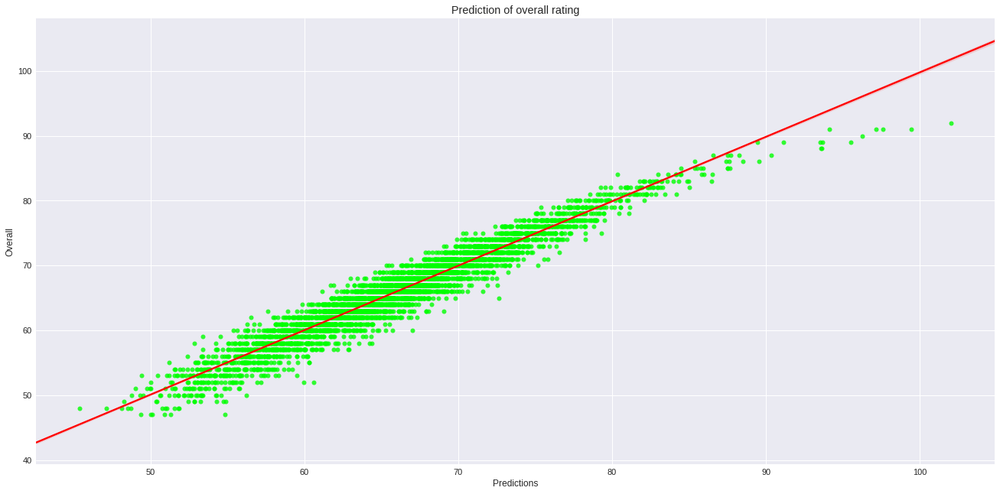

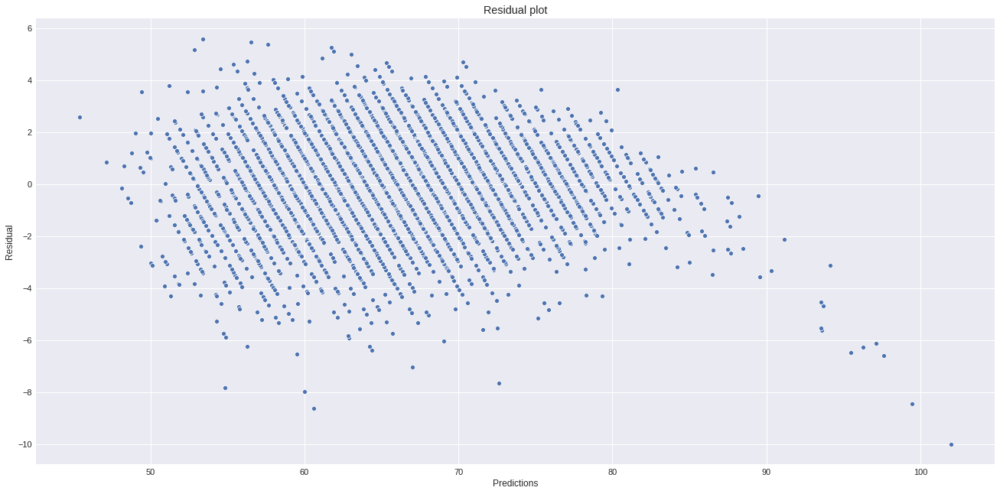

In [137]:
model = Ridge(alpha = 0.05)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.005013704299926758

Model's score is : 0.9305563737173752
testing time : 0.002360820770263672

RMSE : 0.038028197578687896

The cross-validation score is: 0.9308215243976964

The error in the prediction for each player is:
        Overall  predicted         player Name  error in Prediction
13867  0.333333   0.343614        J. Marulanda             0.010281
8054   0.437500   0.358932         Luís Cortez             0.078568
15547  0.270833   0.202076        C. Veerachat             0.068757
3784   0.541667   0.601650         P. Bardsley             0.059983
7140   0.458333   0.399330             D. Nagy             0.059003
17651  0.145833   0.189862         S. Fukahori             0.044028
16624  0.229167   0.258838          J. Ponceau             0.029671
3855   0.541667   0.544826      Choi Chul Soon             0.003159
8947   0.416667   0.472223          A. Angoula             0.055556
9423   0.416667   0.448986         N. Crovetto             0.032320
16150  0.250

Weight,Feature
0.7787 ± 0.0119,Special
0.3770 ± 0.0087,Potential
0.2431 ± 0.0079,Age
0.1806 ± 0.0066,General
0.1124 ± 0.0079,Shooting
0.0725 ± 0.0045,GKDiving
0.0487 ± 0.0021,Reactions
0.0449 ± 0.0037,Defending
0.0355 ± 0.0028,Dribbling
0.0304 ± 0.0020,Curve


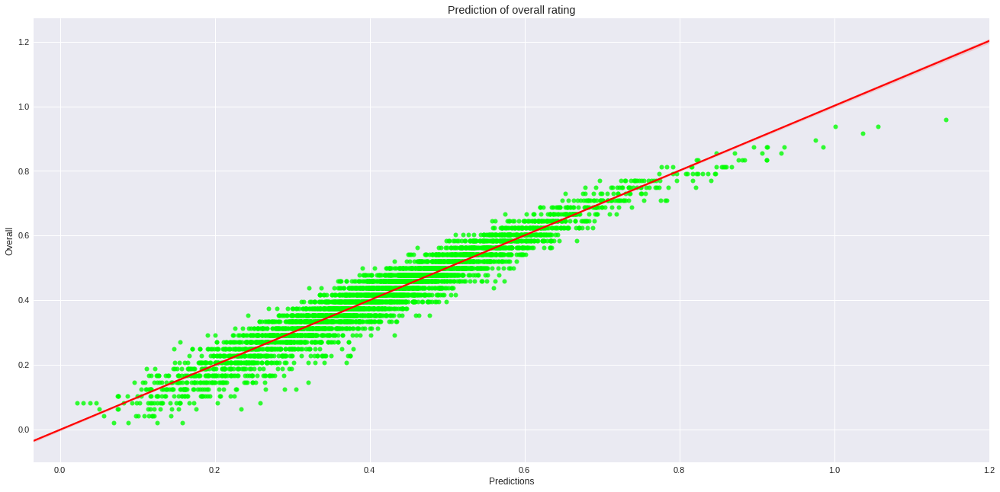

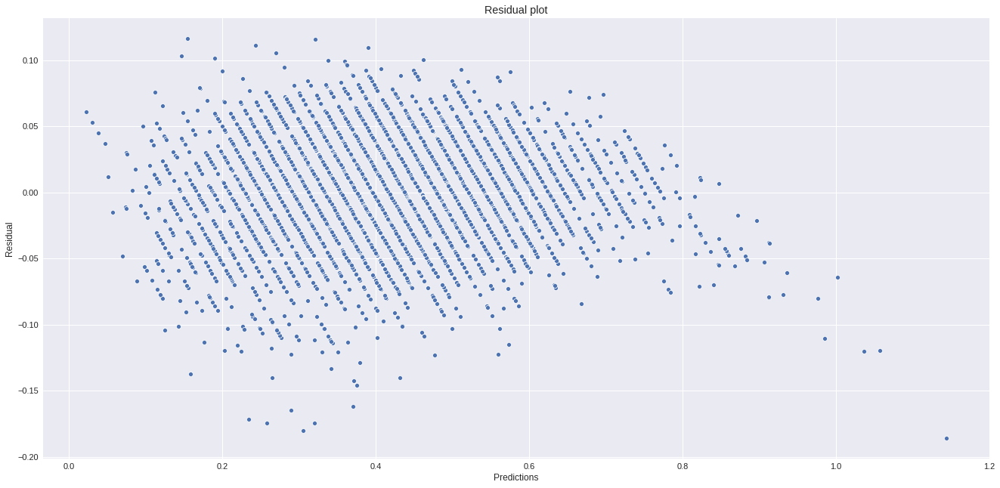

fitting time : 0.005688905715942383

Model's score is : 0.9306618498671818
testing time : 0.0030486583709716797

RMSE : 1.8166476921071915

The cross-validation score is: 0.9311004546713401

The error in the prediction for each player is:
       Overall  predicted        player Name  error in Prediction
5314        70  66.741815           A. Rudko             3.258185
13453       62  59.841456         S. Barratt             2.158544
6564        69  70.658016          A. Ienaga             1.658016
262         82  85.296485       G. Kondogbia             3.296485
3677        72  70.852538          V. Regini             1.147462
4464        71  70.543833          S. Malone             0.456167
5198        70  72.248134     A. Jędrzejczyk             2.248134
243         82  84.567163    F. Bernardeschi             2.567163
575         79  78.448585        S. Bergwijn             0.551415
7060        68  65.346310         N. Mazzola             2.653690
379         81  78.795762          

Weight,Feature
1.8476 ± 0.0690,Special
0.3831 ± 0.0121,Potential
0.3161 ± 0.0083,Shooting
0.2457 ± 0.0124,Age
0.2175 ± 0.0087,General
0.0985 ± 0.0022,Defending
0.0618 ± 0.0031,Mental
0.0538 ± 0.0013,Dribbling
0.0499 ± 0.0032,Curve
0.0432 ± 0.0011,Reactions


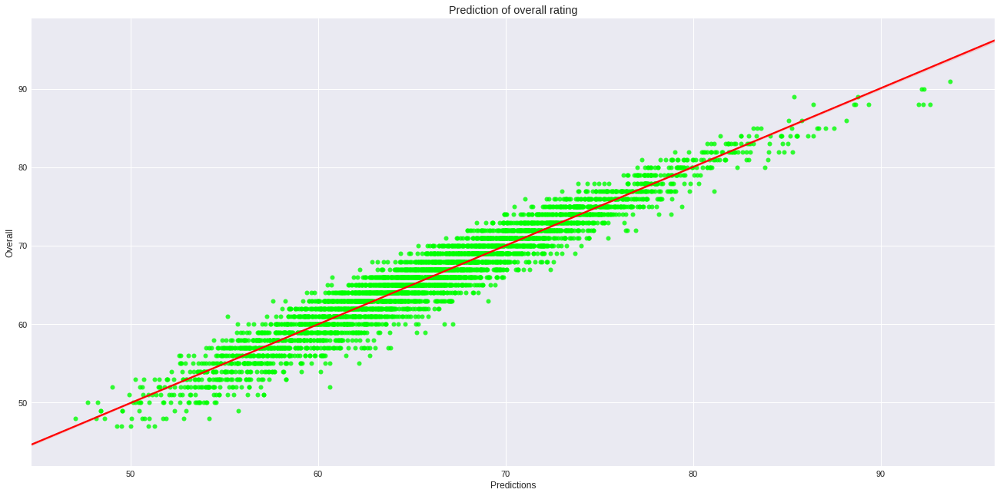

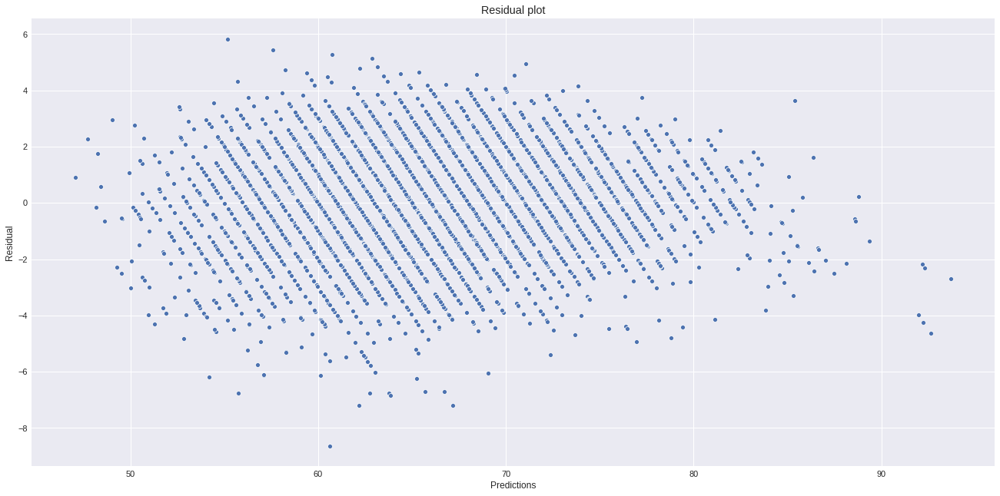

In [138]:
model = Ridge(alpha = 0.5)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.005483388900756836

Model's score is : 0.9277765209400194
testing time : 0.0026121139526367188

RMSE : 0.037919227962441494

The cross-validation score is: 0.9287353898001456

The error in the prediction for each player is:
        Overall  predicted      player Name  error in Prediction
515    0.708333   0.693592       A. Lallana             0.014741
7320   0.458333   0.457412        K. Pierie             0.000921
7414   0.458333   0.573295        S. Tonali             0.114961
7972   0.437500   0.406409     D. De Belder             0.031091
11863  0.375000   0.393053       N. Gouriye             0.018053
2104   0.583333   0.561545    Y. Khacheridi             0.021788
11133  0.375000   0.327938        A. Parmak             0.047062
2963   0.562500   0.557177          D. Alar             0.005323
5209   0.500000   0.489665       M. Odubajo             0.010335
9381   0.416667   0.428693       A. Kantari             0.012026
17101  0.187500   0.166720        D. Błanik 

Weight,Feature
0.3656 ± 0.0136,Potential
0.2310 ± 0.0071,Age
0.1684 ± 0.0059,GKDiving
0.1076 ± 0.0051,Special
0.0667 ± 0.0038,Reactions
0.0373 ± 0.0024,General
0.0163 ± 0.0018,Positioning
0.0149 ± 0.0017,Skill Moves
0.0132 ± 0.0013,Value
0.0126 ± 0.0021,Composure


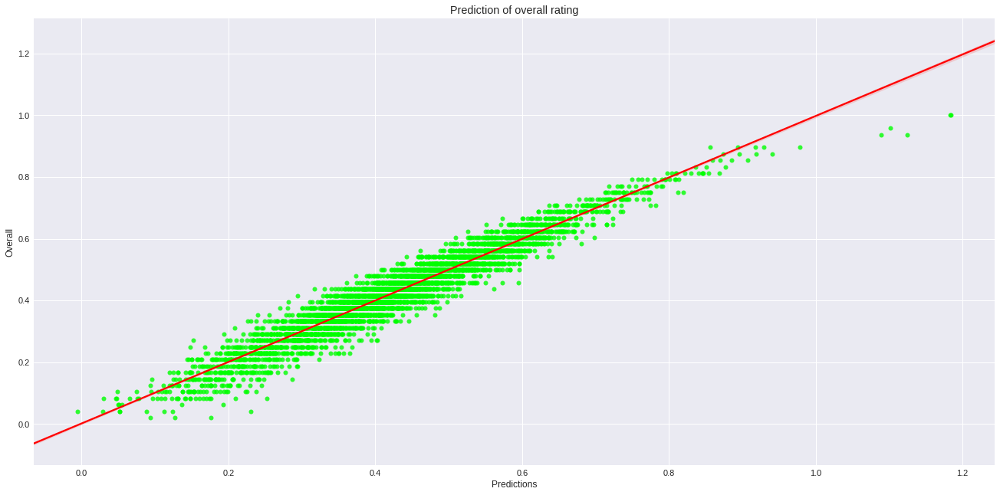

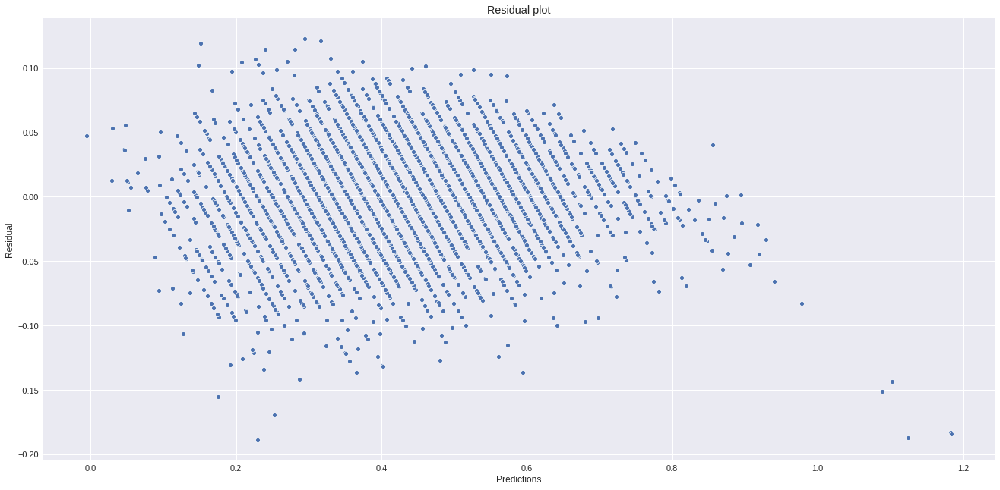

fitting time : 0.005770444869995117

Model's score is : 0.9278430941775743
testing time : 0.0030515193939208984

RMSE : 1.8189043055133813

The cross-validation score is: 0.9309991759540885

The error in the prediction for each player is:
       Overall  predicted      player Name  error in Prediction
12723       63  61.827986      M. Cichocki             1.172014
13936       62  65.307211         L. Price             3.307211
17673       53  53.014640           Yu Hao             0.014640
13149       62  60.765365          Li Peng             1.234635
7917        67  70.844322        G. Munari             3.844322
6814        68  71.226856     C. Rodríguez             3.226856
16639       57  55.178632       K. Wootton             1.821368
8340        67  65.163454        R. Grange             1.836546
8816        66  68.956989           C. Kum             2.956989
15671       59  61.977131    L. Tempelmann             2.977131
1117        77  74.853121           Danilo             2.

Weight,Feature
2.1571 ± 0.0620,Special
0.3780 ± 0.0120,Potential
0.3208 ± 0.0072,Shooting
0.2768 ± 0.0023,General
0.2465 ± 0.0097,Age
0.0987 ± 0.0022,Defending
0.0909 ± 0.0035,Mental
0.0657 ± 0.0027,Dribbling
0.0653 ± 0.0045,Passing
0.0577 ± 0.0018,Curve


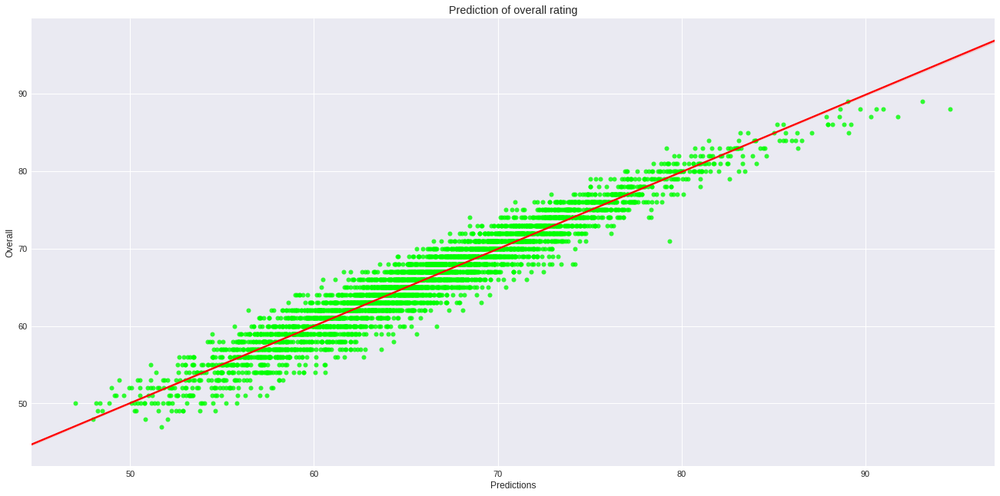

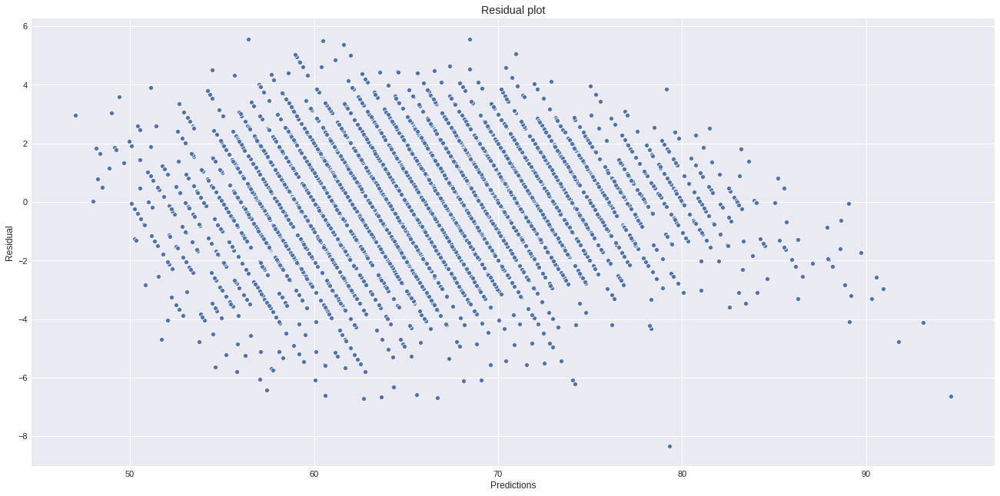

In [139]:
model = Ridge(alpha = 5)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

The optimal value of alpha for Ridge regression is 1 for this problem, since the residual plot is almost the best which we can achieve, while there is not much difference in the accuracy of the models with different values of alpha.

Now, let us try out Lasso regression, which applies the L1 penalty.

In [140]:
from sklearn.linear_model import Lasso

fitting time : 0.013985872268676758

Model's score is : -0.0005563738641825022
testing time : 0.0026946067810058594

RMSE : 0.14503405663016888

The cross-validation score is: -0.0003196954934602925

The error in the prediction for each player is:
        Overall  predicted       player Name  error in Prediction
2476   0.583333   0.420785     L. Villafañez             0.162549
12540  0.354167   0.420785      C. Rodríguez             0.066618
8522   0.437500   0.420785         M. Ibáñez             0.016715
10924  0.395833   0.420785        L. Prosser             0.024951
81     0.812500   0.420785           Alisson             0.391715
8774   0.416667   0.420785         D. de Wit             0.004118
3448   0.541667   0.420785           A. Mena             0.120882
10310  0.395833   0.420785    Luís Maximiano             0.024951
10960  0.395833   0.420785        G. Beretta             0.024951
6666   0.458333   0.420785        J. Sainati             0.037549
5853   0.479167   0.420785

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


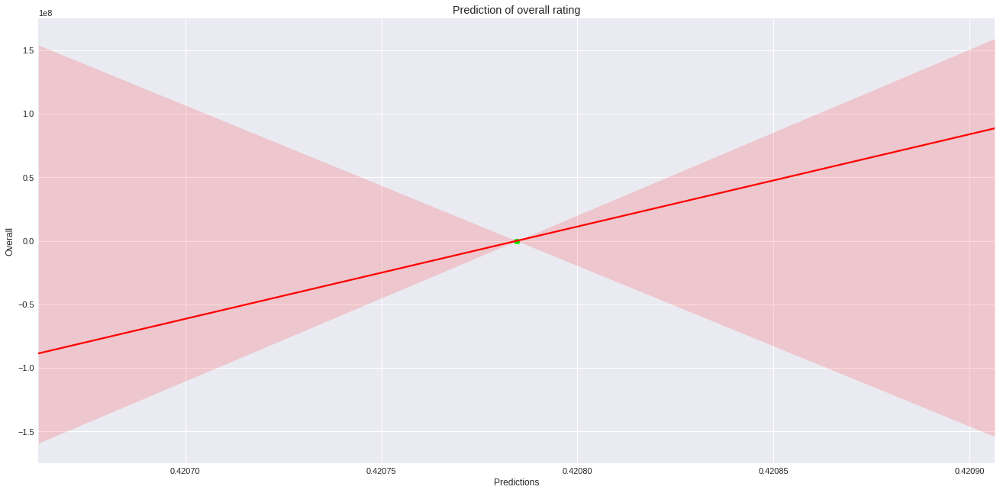

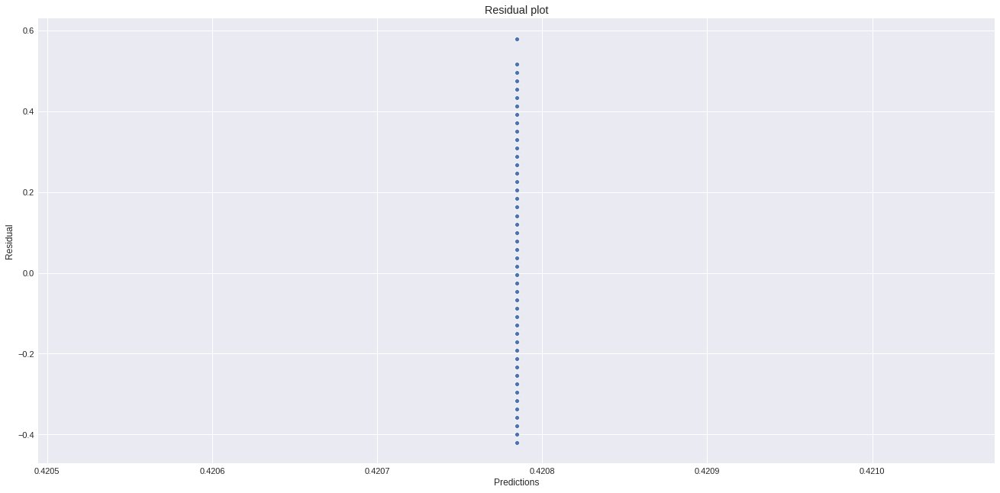

/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24605.85280844534, tolerance: 64.7577251995606
  positive)


fitting time : 0.436814546585083

Model's score is : 0.934798302954328
testing time : 0.003856658935546875

RMSE : 1.7810268632602195


/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25812.12784765825, tolerance: 69.92879585307236
  positive)
/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25611.89172217944, tolerance: 68.94025227600413
  positive)
/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25944.00123267062, tolerance: 69.91473105176445
  positive)
/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26106.9614420350


The cross-validation score is: 0.9300272866608548

The error in the prediction for each player is:
       Overall  predicted       player Name  error in Prediction
15564       59  59.525979       N. Sandberg             0.525979
5660        69  65.327325       V. Fındıklı             3.672675
15009       60  60.371116         A. Greene             0.371116
2747        73  68.802150          B. Alıcı             4.197850
493         80  77.552918            Maicon             2.447082
9649        66  66.918417         O. Käuper             0.918417
3680        72  69.864836  Cristian Lodeira             2.135164
10196       65  63.669176      L. Escalante             1.330824
2886        73  71.117037      E. Terranova             1.882963
1207        76  75.449961       David Juncà             0.550039
18206       46  53.088821         G. Nugent             7.088821
9879        66  68.386509        L. Vignali             2.386509
4479        71  70.710791      D. Foulquier            

Weight,Feature
1.4963 ± 0.0470,Special
0.3610 ± 0.0127,Potential
0.2308 ± 0.0072,Age
0.1223 ± 0.0047,Shooting
0.0855 ± 0.0031,Defending
0.0745 ± 0.0047,General
0.0462 ± 0.0022,Reactions
0.0336 ± 0.0015,Mental
0.0302 ± 0.0016,GKDiving
0.0242 ± 0.0009,Curve


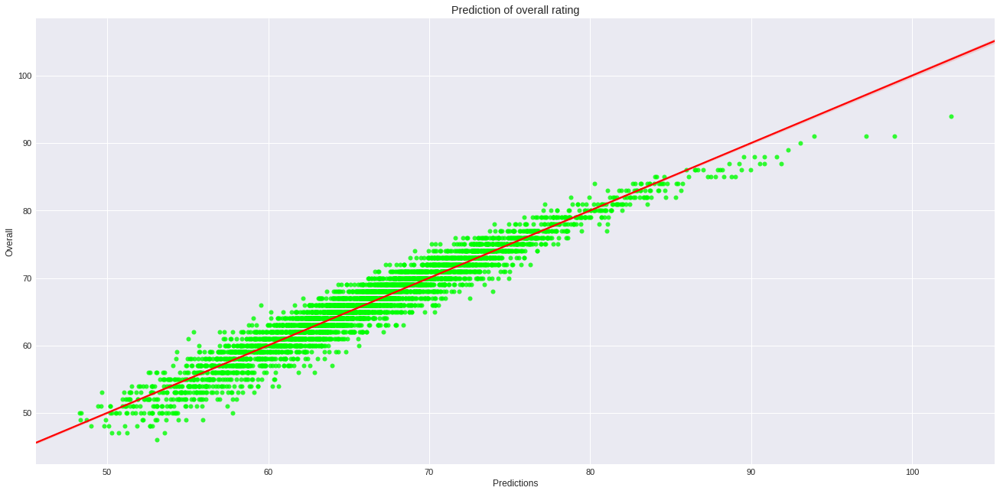

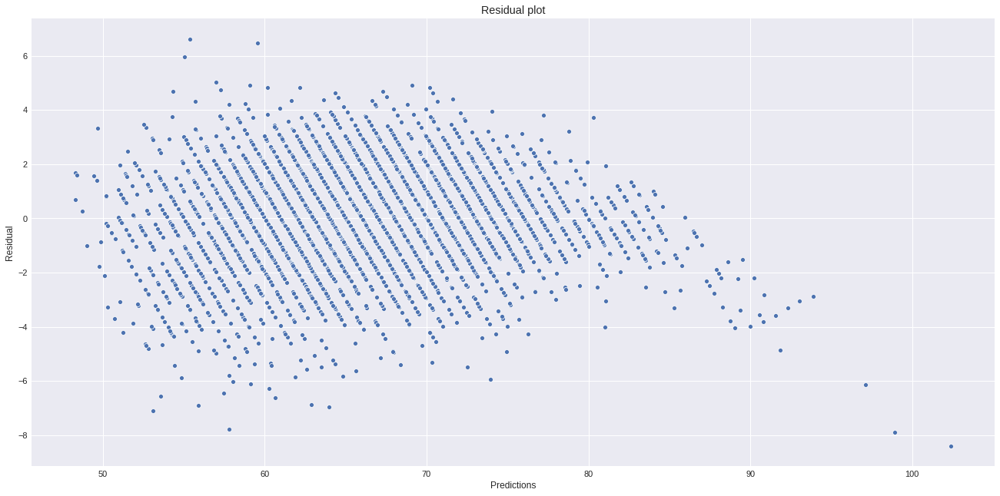

In [141]:
model = Lasso(alpha = 0.05)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.005219697952270508

Model's score is : -0.0011177612403763248
testing time : 0.0024793148040771484

RMSE : 0.14344468191177948

The cross-validation score is: -0.00019348887889805155

The error in the prediction for each player is:
        Overall  predicted        player Name  error in Prediction
15642  0.270833   0.420441        T. Mølgaard             0.149608
5293   0.500000   0.420441          M. Franke             0.079559
8494   0.437500   0.420441            B. Aloé             0.017059
8001   0.437500   0.420441        G. Maggiore             0.017059
1409   0.625000   0.420441           De Tomás             0.204559
755    0.666667   0.420441           J. Gomez             0.246225
1105   0.645833   0.420441          W. Hughes             0.225392
6890   0.458333   0.420441        Y. Bárcenas             0.037892
8437   0.437500   0.420441        A. Woodyard             0.017059
10065  0.395833   0.420441       F. Viteritti             0.024608
183    0.77083

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


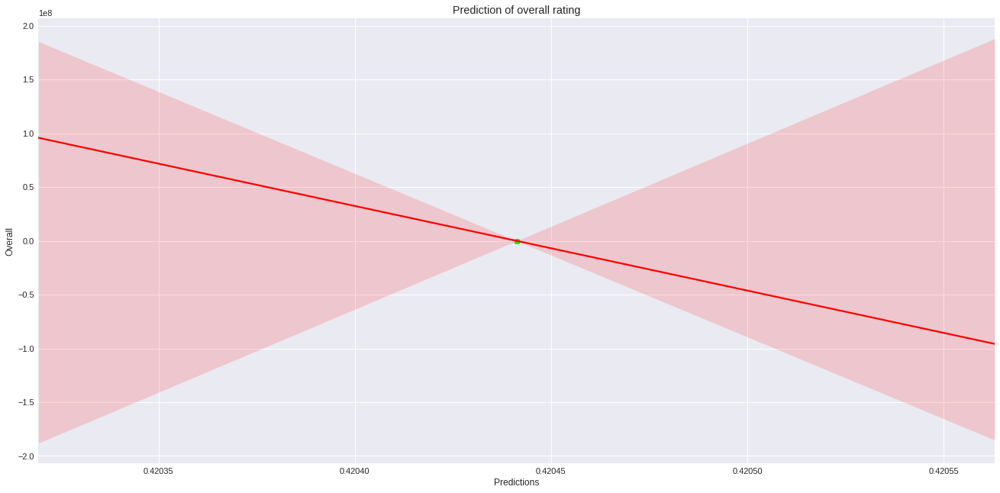

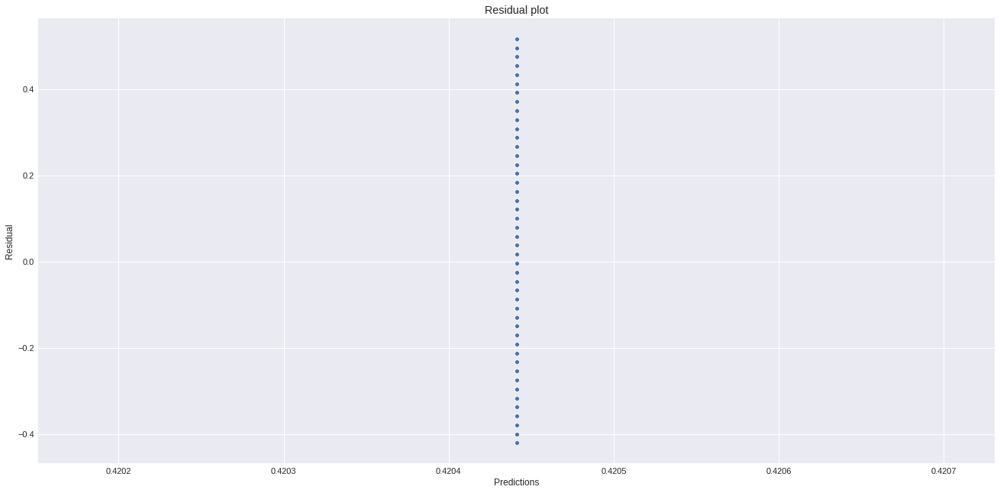

fitting time : 1.5173110961914062

Model's score is : 0.9337728370344369
testing time : 0.003738880157470703

RMSE : 1.8022082021587431

The cross-validation score is: 0.9299180663066593

The error in the prediction for each player is:
       Overall  predicted       player Name  error in Prediction
2918        73  75.766698  Benjamin Meseira             2.766698
4078        71  70.512484       D. Guerrero             0.487516
13662       62  63.974661          C. Arano             1.974661
4431        71  72.400983         S. Aigner             1.400983
1036        77  76.792236        N. Mukiele             0.207764
14627       61  62.212635      P. Wiesinger             1.212635
8514        67  66.956881      S. Szymański             0.043119
14619       61  58.765827     Baek Dong Gyu             2.234173
14120       61  62.796241          L. Marić             1.796241
3477        72  72.833017             Munir             0.833017
11657       64  62.909084     H. Canbazoğlu      

Weight,Feature
1.4143 ± 0.0461,Special
0.3717 ± 0.0136,Potential
0.2279 ± 0.0088,Age
0.1104 ± 0.0037,Shooting
0.0991 ± 0.0030,General
0.0815 ± 0.0036,Defending
0.0481 ± 0.0026,Reactions
0.0387 ± 0.0015,Mental
0.0338 ± 0.0019,GKDiving
0.0265 ± 0.0032,Curve


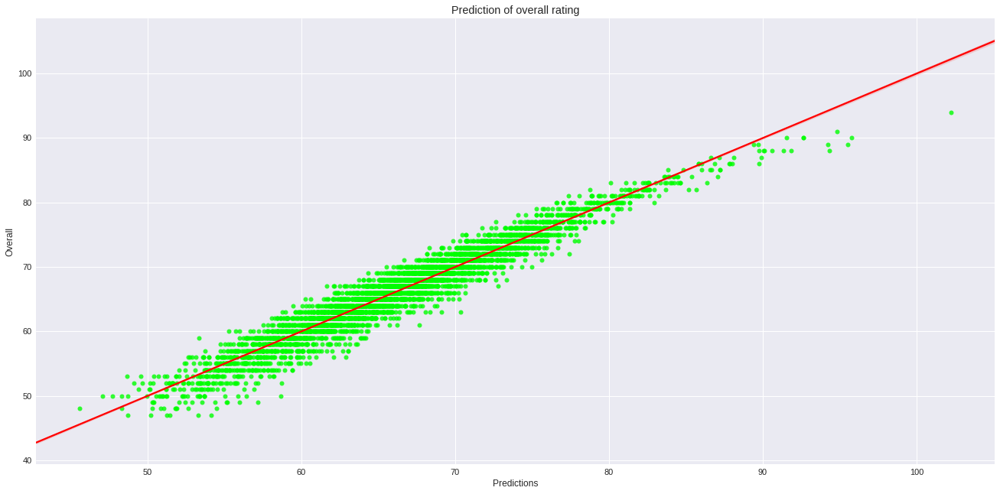

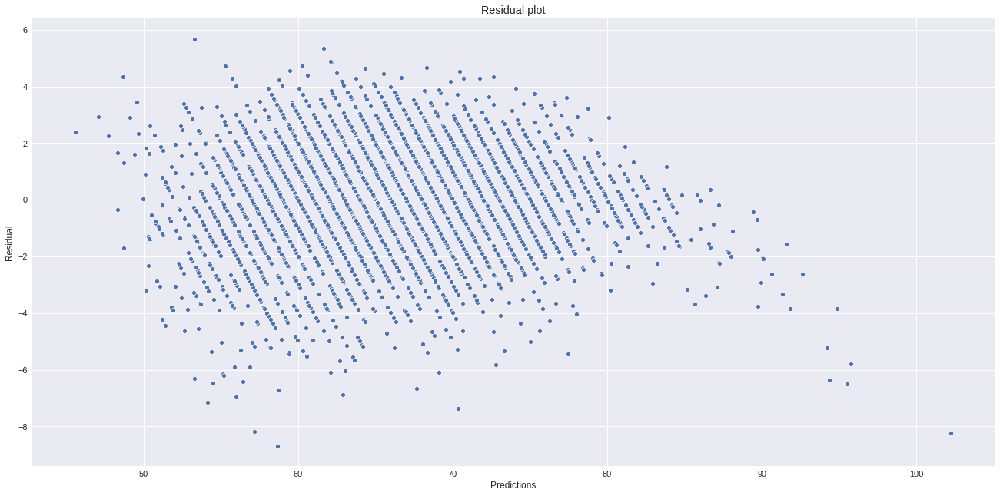

In [142]:
model = Lasso(alpha = 0.05, max_iter = 10000)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.008293867111206055

Model's score is : -0.0008977533146390382
testing time : 0.0024220943450927734

RMSE : 0.14638960747363364

The cross-validation score is: -0.0001407047647248749

The error in the prediction for each player is:
        Overall  predicted        player Name  error in Prediction
12378  0.354167   0.420543        M. Andersen             0.066377
9782   0.416667   0.420543       J. Fitzwater             0.003877
11068  0.375000   0.420543        J. Martínez             0.045543
15982  0.250000   0.420543        A. Ademoglu             0.170543
4752   0.500000   0.420543          R. Bianco             0.079457
12081  0.354167   0.420543       O. Söderberg             0.066377
17829  0.125000   0.420543        J. Riquelme             0.295543
1483   0.625000   0.420543         A. Souquet             0.204457
15818  0.270833   0.420543             I. Oda             0.149710
15403  0.270833   0.420543     Han Seung Wook             0.149710
8099   0.437500

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


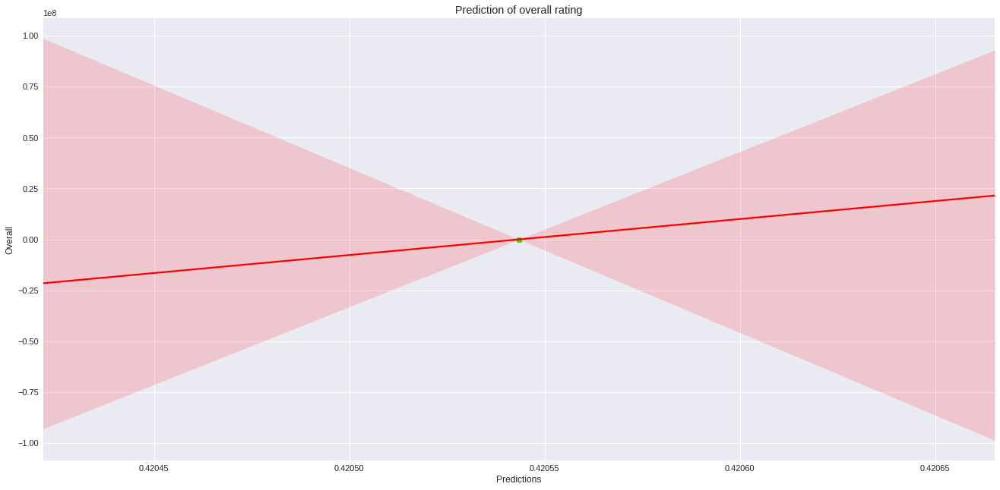

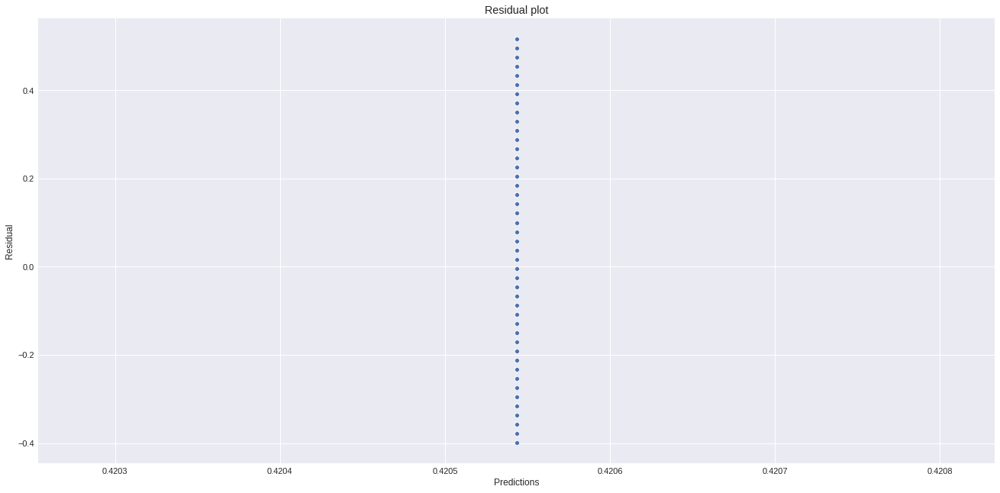

fitting time : 0.6074202060699463

Model's score is : 0.9257805187397401
testing time : 0.0037949085235595703

RMSE : 1.8760794885999463

The cross-validation score is: 0.924317962891293

The error in the prediction for each player is:
       Overall  predicted         player Name  error in Prediction
13088       62  62.781415            L. Nolan             0.781415
12305       63  63.227472          M. Nielsen             0.227472
12330       63  64.566431       Lee Kwang Sun             1.566431
6101        69  68.556262           M. Ibarra             0.443738
2871        73  69.269014         F. Sambueza             3.730986
10272       65  64.650715       Vítor Tormena             0.349285
4666        71  71.868734         B. Rienstra             0.868734
2134        74  73.297929           E. Krafth             0.702071
2939        73  73.831271         K. Westwood             0.831271
446         80  81.098192           M. Sanson             1.098192
384         81  79.407541  

Weight,Feature
0.5028 ± 0.0139,Special
0.3462 ± 0.0066,Potential
0.1957 ± 0.0082,Age
0.0716 ± 0.0017,Reactions
0.0660 ± 0.0026,GKDiving
0.0267 ± 0.0024,Value
0.0148 ± 0.0015,Composure
0.0143 ± 0.0002,Defending
0.0117 ± 0.0008,Positioning
0.0062 ± 0.0002,Balance


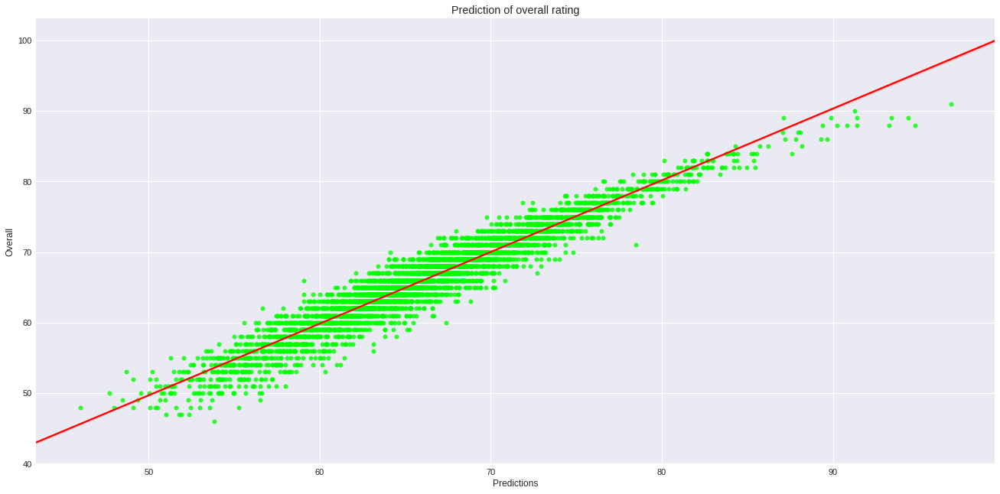

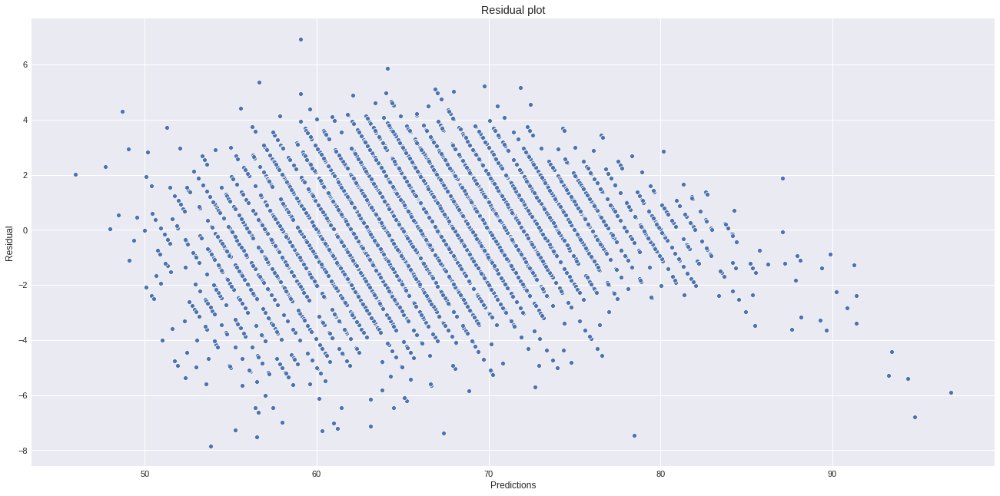

In [143]:
model = Lasso(alpha = 0.5, max_iter = 10000)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.005005598068237305

Model's score is : -0.00027085440310226083
testing time : 0.00257110595703125

RMSE : 0.14516423099759246

The cross-validation score is: -9.78829108190027e-05

The error in the prediction for each player is:
        Overall  predicted      player Name  error in Prediction
3695   0.541667   0.421042         P. Rubio             0.120624
13377  0.333333   0.421042       D. Erdoğan             0.087709
15504  0.270833   0.421042          M. Lund             0.150209
3649   0.541667   0.421042  M. Schmiedebach             0.120624
7716   0.437500   0.421042           Josema             0.016458
15190  0.291667   0.421042        T. Conlon             0.129376
10879  0.395833   0.421042         F. Forte             0.025209
10398  0.395833   0.421042          Aloísio             0.025209
12672  0.354167   0.421042       J. Jeffrey             0.066876
9038   0.416667   0.421042       F. Depaoli             0.004376
8759   0.437500   0.421042         U. R

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


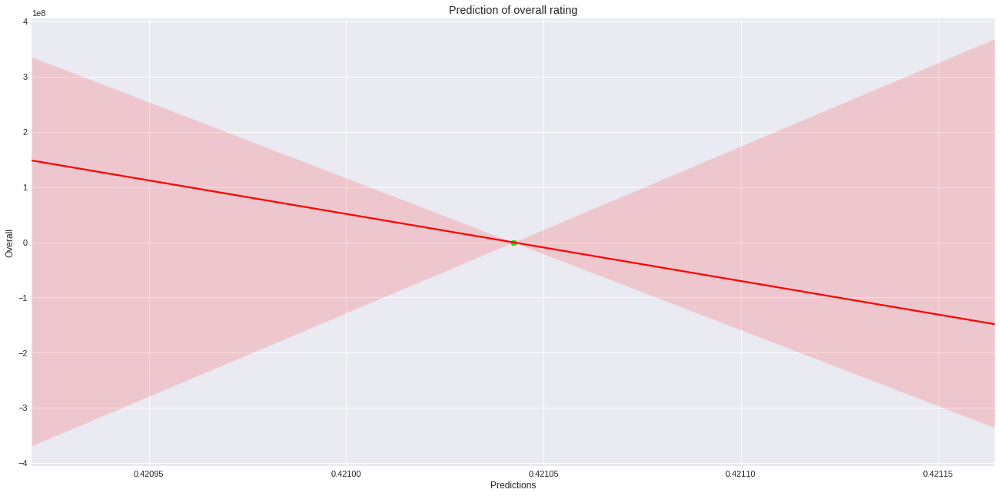

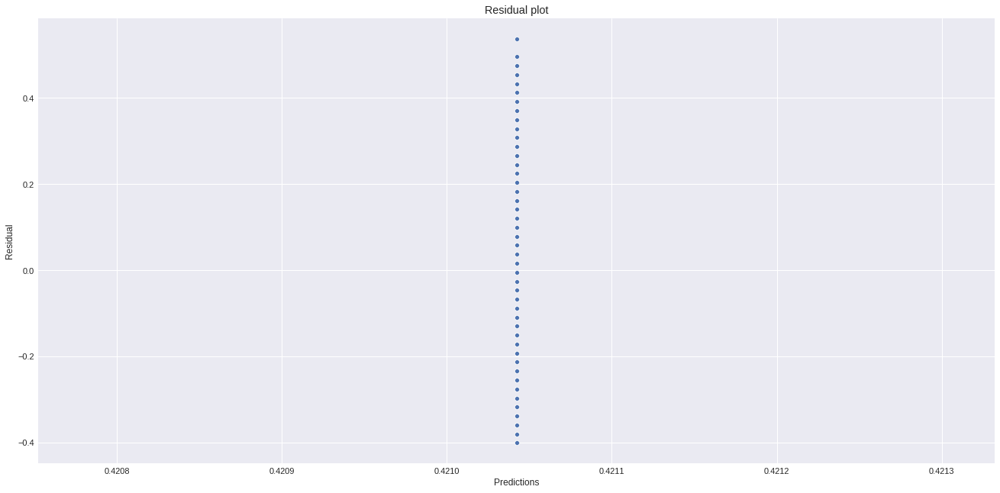

fitting time : 0.019723176956176758

Model's score is : 0.8485907427512668
testing time : 0.003055095672607422

RMSE : 2.666963986204846

The cross-validation score is: 0.8438516332320759

The error in the prediction for each player is:
       Overall  predicted      player Name  error in Prediction
16366       57  62.204236       F. Navarro             5.204236
4172        71  68.664241     A. Galabinov             2.335759
17424       54  57.435700     R. Masterson             3.435700
17082       55  58.477751    M. El Idrissy             3.477751
8262        67  68.399092          J. Miño             1.399092
4774        70  67.856758    J. Valenzuela             2.143242
15129       60  60.021552        J. Barmby             0.021552
2441        74  74.117019        A. Oyongo             0.117019
8999        66  61.053653        O. Ribera             4.946347
10141       65  62.498873    S. Avellaneda             2.501127
5713        69  69.275583          J. Gyau             0.27

Weight,Feature
0.5137 ± 0.0157,Special
0.2101 ± 0.0073,GKDiving
0.1713 ± 0.0054,Reactions
0.0734 ± 0.0028,Value
0.0327 ± 0.0007,Composure
0.0249 ± 0.0015,Potential
0.0155 ± 0.0012,Weight
0.0086 ± 0.0007,Strength
0.0043 ± 0.0004,Balance
0.0023 ± 0.0005,Wage


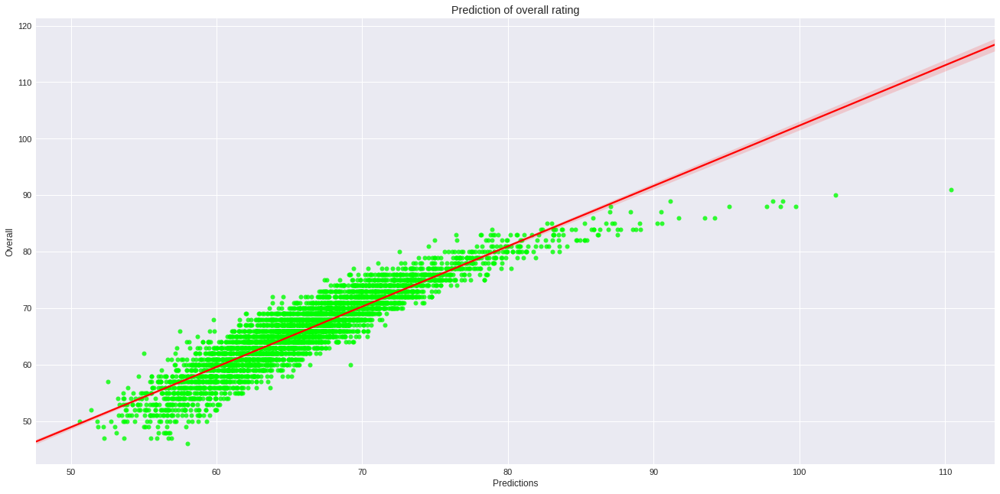

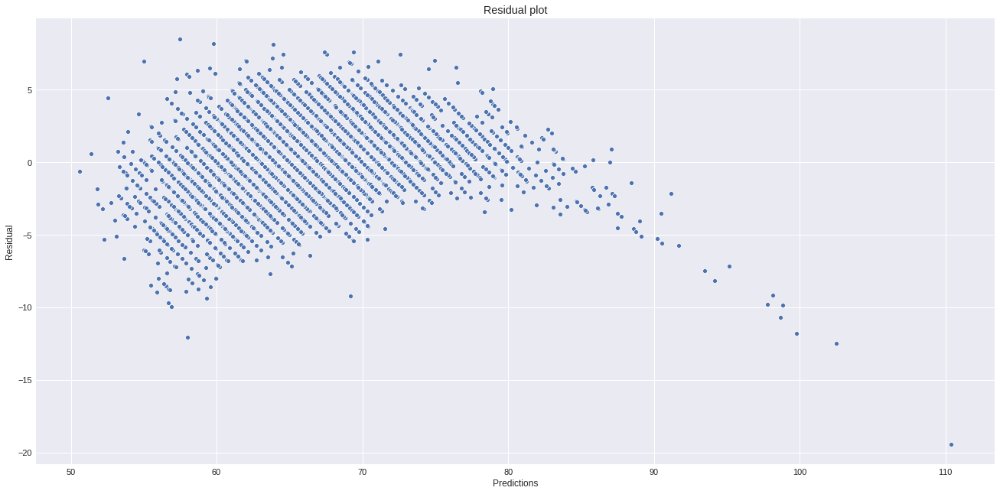

In [144]:
model = Lasso(alpha = 5, max_iter = 10000)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

You must have observed that Lasso regression gave an extremely low accuracy for scaled data since according to this algorithm, if the values of the features are small, it will have bigger coefficients which will result in bigger Lasso penalty and therefore the algorithm will assign weights close to 0 to almost all the variables which will result in extremely low accuracy. Also, the accuracy decreased as we increases the value of alpha, the reason being that the penalty for the features will increase with increase in the value of alpha which will result in a higher number of features having weights 0.

Let us try out ElasticNet regression, which is a combination of Lasso and Ridge regression.

In [145]:
from sklearn.linear_model import ElasticNet

fitting time : 0.008900642395019531

Model's score is : -4.2851024052881215e-05
testing time : 0.002420663833618164

RMSE : 0.14502034230551072

The cross-validation score is: -0.00024678933753841115

The error in the prediction for each player is:
        Overall  predicted         player Name  error in Prediction
8112   0.437500   0.421877            C. Gönen             0.015623
17358  0.166667   0.421877            I. Acero             0.255210
11637  0.375000   0.421877             Jauregi             0.046877
797    0.666667   0.421877              P. Max             0.244790
1782   0.604167   0.421877            Bustinza             0.182290
1349   0.625000   0.421877                Yoel             0.203123
10329  0.395833   0.421877          P. Twumasi             0.026044
7399   0.458333   0.421877      Hwang Hyun Soo             0.036456
5123   0.500000   0.421877          V. Osimhen             0.078123
12880  0.354167   0.421877                 Isi             0.067710
593

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


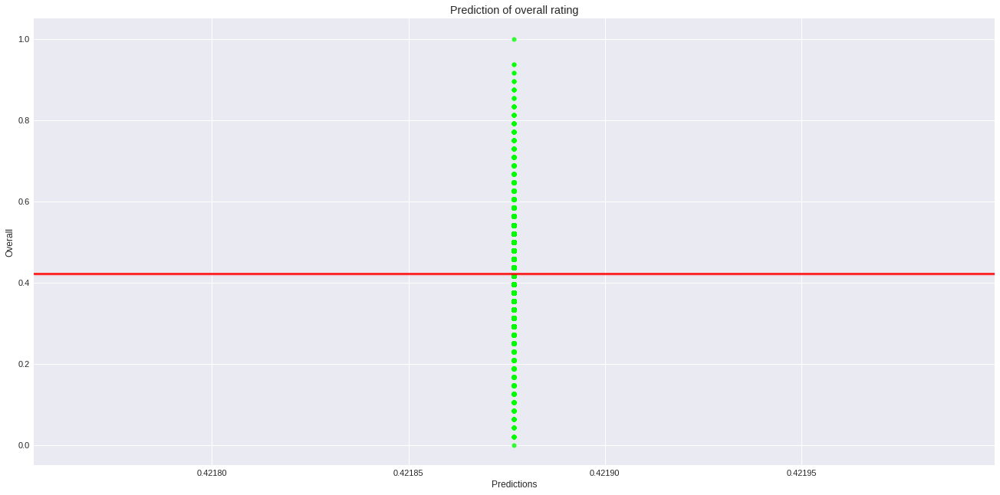

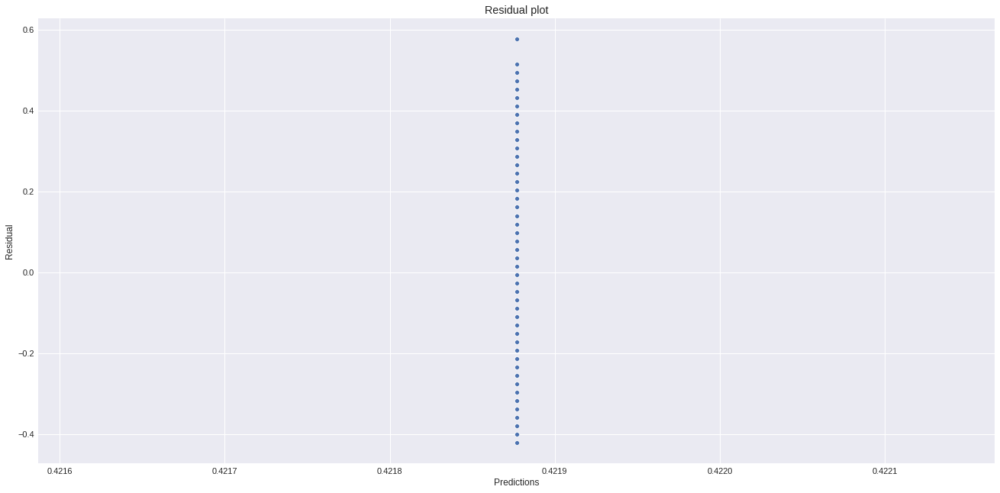

fitting time : 0.5338602066040039

Model's score is : 0.9230949958606555
testing time : 0.004035234451293945

RMSE : 1.9220456740731398


/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 85.94304596268921, tolerance: 69.4683032337796
  positive)



The cross-validation score is: 0.9230575588278482

The error in the prediction for each player is:
       Overall  predicted        player Name  error in Prediction
5805        69  71.277188     S. Bentivoglio             2.277188
16791       56  53.059290          T. Vermot             2.940710
12810       63  62.707663       M. Al Saiari             0.292337
7565        68  64.880325       A. Benedetti             3.119675
9426        66  66.526886    G. Merebashvili             0.526886
7162        68  65.711336         M. de Luna             2.288664
7357        68  66.481201           F. Godoy             1.518799
769         78  75.773388       Diego Carlos             2.226612
3503        72  70.510953           D. Gonzo             1.489047
6397        69  67.360746         F. Honorat             1.639254
15905       58  57.127268          N. Quindt             0.872732
17310       54  56.900521        E. Pastrana             2.900521
15780       59  61.201762      Park Jung S

Weight,Feature
0.6182 ± 0.0228,Special
0.2910 ± 0.0077,Potential
0.1643 ± 0.0066,Age
0.0786 ± 0.0051,GKDiving
0.0749 ± 0.0019,Reactions
0.0307 ± 0.0031,Value
0.0199 ± 0.0019,Defending
0.0165 ± 0.0007,Composure
0.0149 ± 0.0011,Positioning
0.0084 ± 0.0010,Balance


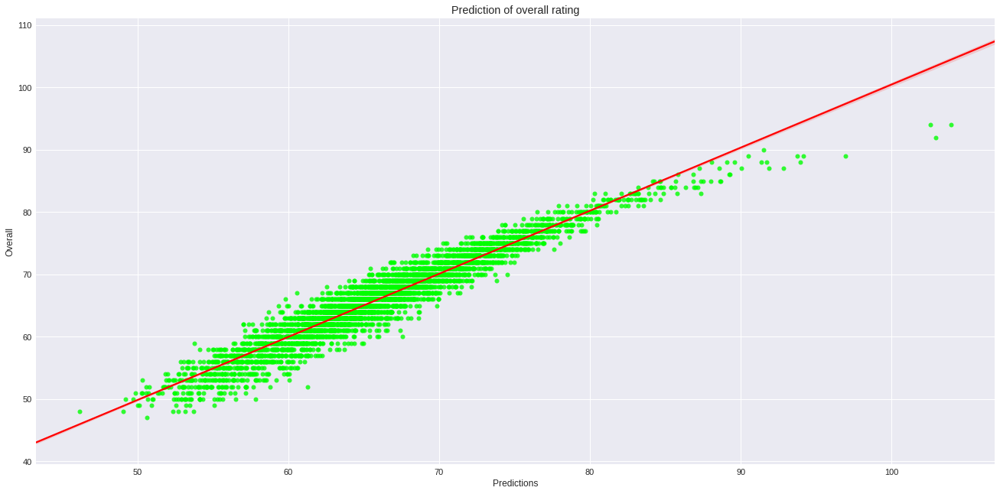

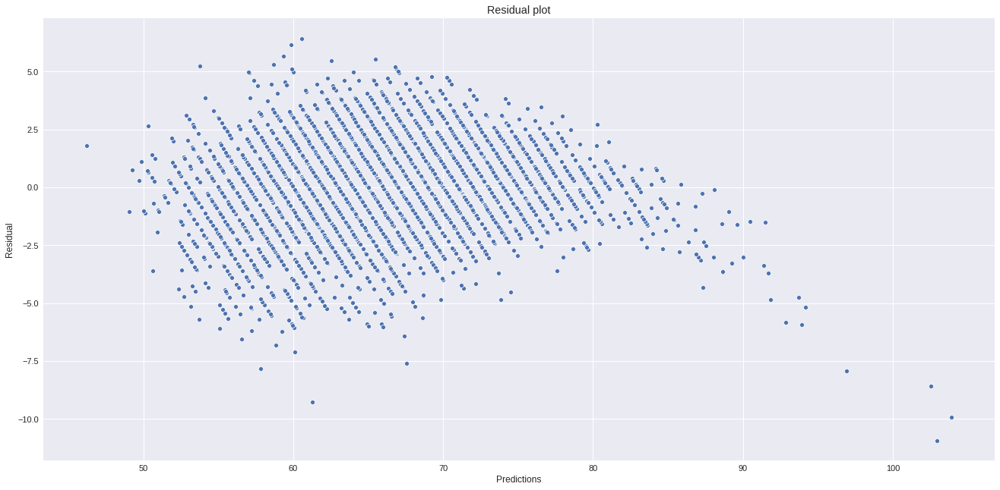

In [146]:
model = ElasticNet(alpha = 1, l1_ratio = 0.5)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.00535273551940918

Model's score is : -0.00010373979665234678
testing time : 0.0025010108947753906

RMSE : 0.14353795066417677

The cross-validation score is: -0.0002607439823796298

The error in the prediction for each player is:
        Overall  predicted         player Name  error in Prediction
16654  0.229167   0.422005         T. Abrahams             0.192838
5009   0.500000   0.422005          J. Sánchez             0.077995
2476   0.583333   0.422005       L. Villafañez             0.161328
16151  0.250000   0.422005          A. Beestin             0.172005
51     0.854167   0.422005       J. Vertonghen             0.432162
18173  0.041667   0.422005            R. Takae             0.380338
14781  0.291667   0.422005         K. O'Connor             0.130338
14110  0.312500   0.422005         A. Zendejas             0.109505
9020   0.416667   0.422005             L. Broź             0.005338
6020   0.479167   0.422005            U. Matić             0.057162
1630

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


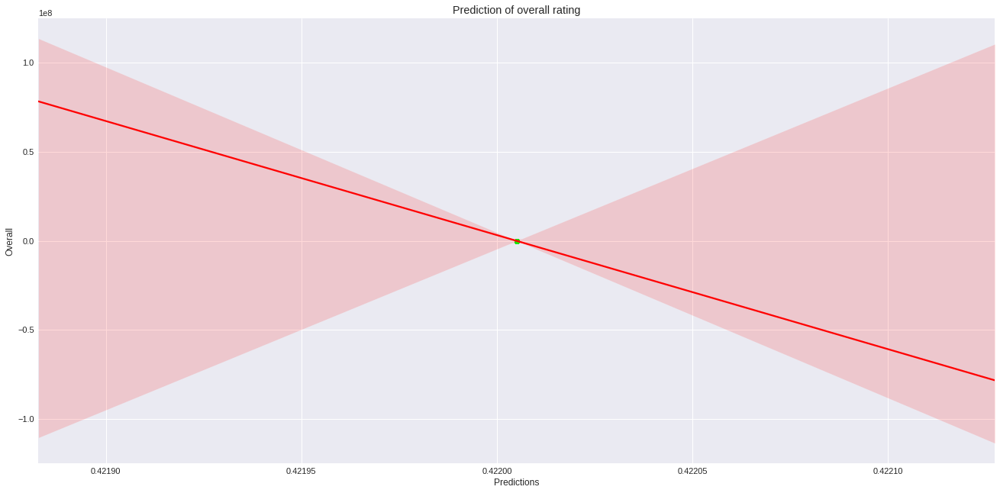

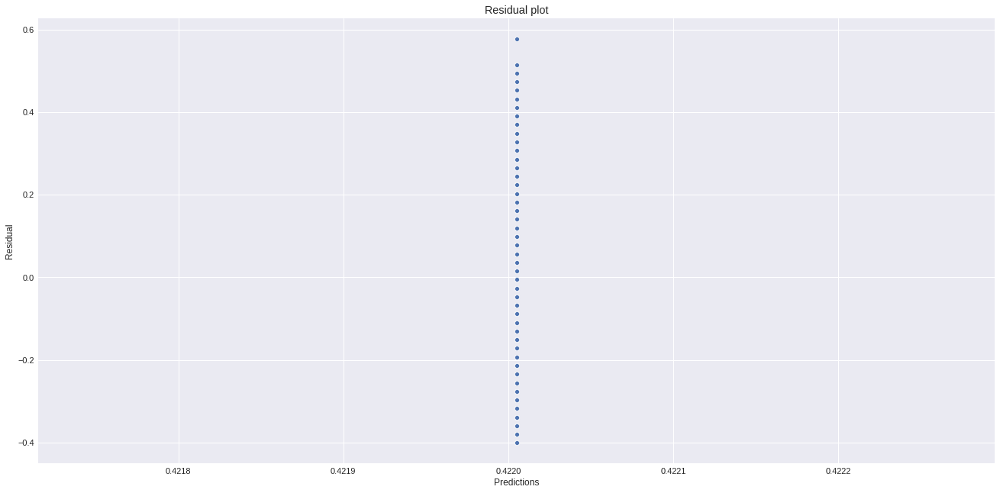

fitting time : 0.26087093353271484

Model's score is : 0.9271148491665273
testing time : 0.0036542415618896484

RMSE : 1.8910839746655077


/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4229.84649808782, tolerance: 69.68642077583249
  positive)
/opt/conda/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2726.05612153955, tolerance: 69.56145141425243
  positive)



The cross-validation score is: 0.9247349090799675

The error in the prediction for each player is:
       Overall  predicted         player Name  error in Prediction
2824        73  72.453820         Raul García             0.546180
3247        72  72.371944        Bruno Tabata             0.371944
3678        72  71.581469           H. Martín             0.418531
8040        67  64.647466          B. De Alba             2.352534
9407        66  66.998940            A. Nübel             0.998940
13774       62  62.388260            T. Payne             0.388260
10380       65  64.006889          G. Poussin             0.993111
3481        72  69.892520          J. Pereira             2.107480
2571        74  75.477186              L. Fer             1.477186
11225       64  63.614785          J. Laursen             0.385215
11269       64  65.260335      Álex Centelles             1.260335
5645        69  70.072305           C. Guzmán             1.072305
3288        72  71.716451    

Weight,Feature
0.7922 ± 0.0190,Special
0.3044 ± 0.0111,Potential
0.1702 ± 0.0056,Age
0.0749 ± 0.0043,Reactions
0.0670 ± 0.0013,GKDiving
0.0350 ± 0.0016,Defending
0.0231 ± 0.0008,Value
0.0210 ± 0.0025,Positioning
0.0201 ± 0.0012,Composure
0.0122 ± 0.0007,Shooting


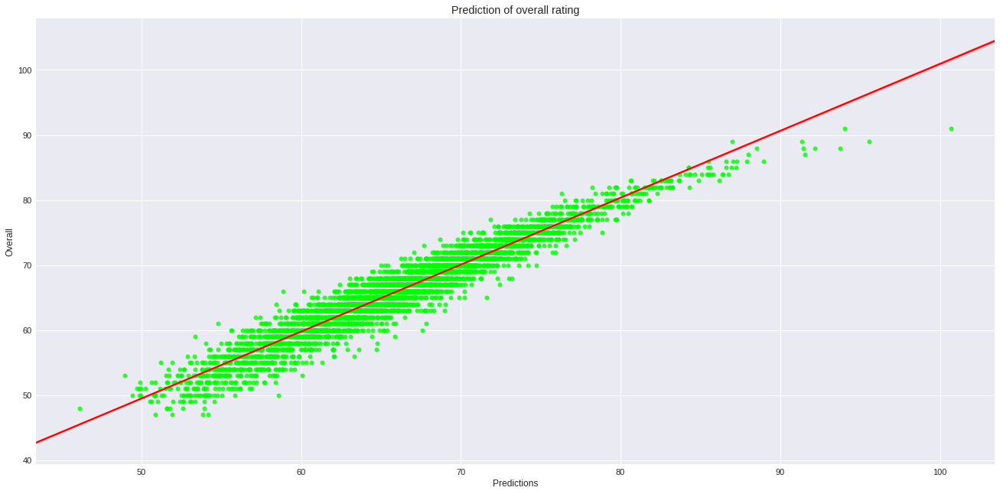

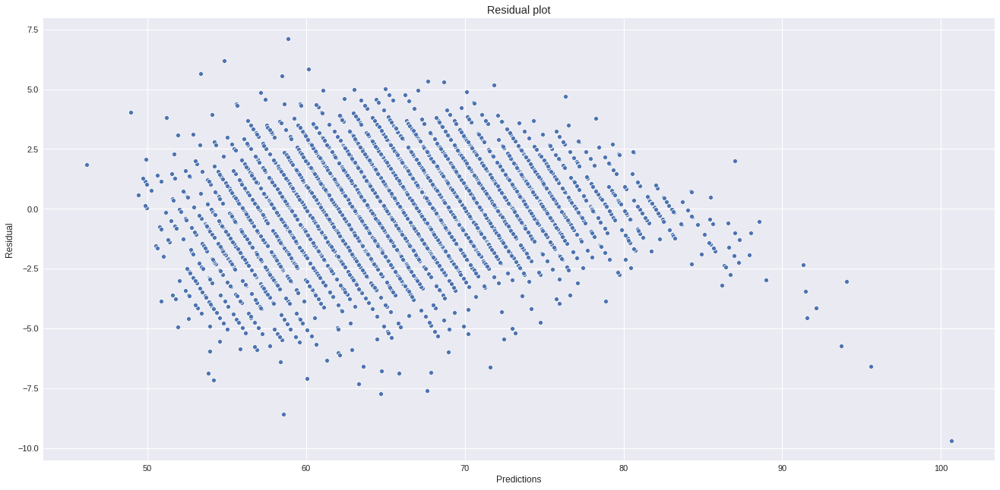

In [147]:
model = ElasticNet(alpha = 1, l1_ratio = 0.3)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

fitting time : 0.005173444747924805

Model's score is : -8.729438363497266e-06
testing time : 0.002450704574584961

RMSE : 0.14780199621038242

The cross-validation score is: -0.00015553525999489892

The error in the prediction for each player is:
        Overall  predicted      player Name  error in Prediction
9781   0.416667   0.421749         E. Butin             0.005082
7659   0.437500   0.421749        J. Lotiès             0.015751
59     0.833333   0.421749      V. van Dijk             0.411585
10192  0.395833   0.421749      J. Hamilton             0.025915
2049   0.604167   0.421749     C. Luyindama             0.182418
2244   0.583333   0.421749      A. Diamanti             0.161585
5326   0.500000   0.421749            Anuar             0.078251
1699   0.604167   0.421749          A. Song             0.182418
6739   0.458333   0.421749       R. Becerra             0.036585
6704   0.458333   0.421749    D. Guastavino             0.036585
15182  0.291667   0.421749     C. McD

/opt/conda/lib/python3.6/site-packages/eli5/formatters/html.py:234: RuntimeWarning: invalid value encountered in double_scalars
  rel_weight = (abs(weight) / weight_range) ** 0.7


Weight,Feature
0 ± 0.0000,Skill Moves
0 ± 0.0000,LongPassing
0 ± 0.0000,FKAccuracy
0 ± 0.0000,Curve
0 ± 0.0000,Dribbling
0 ± 0.0000,Volleys
0 ± 0.0000,ShortPassing
0 ± 0.0000,HeadingAccuracy
0 ± 0.0000,SprintSpeed
0 ± 0.0000,Crossing


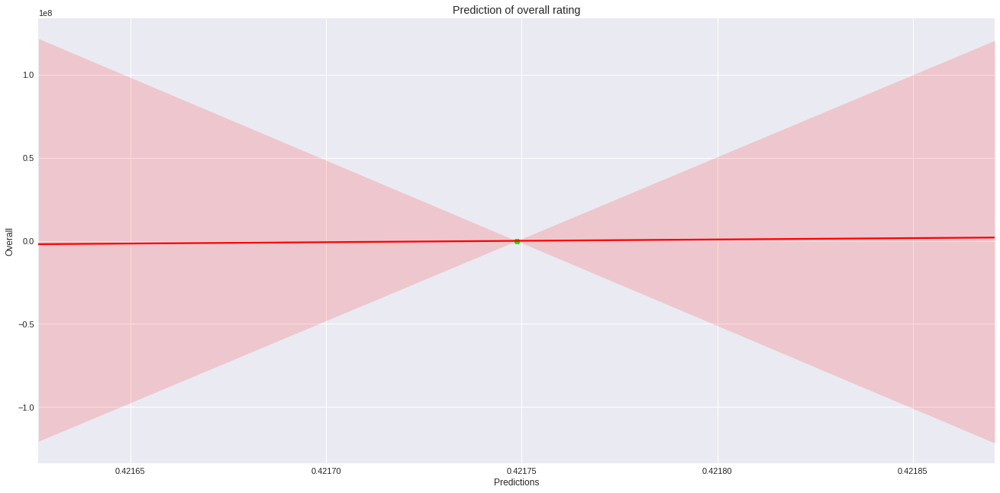

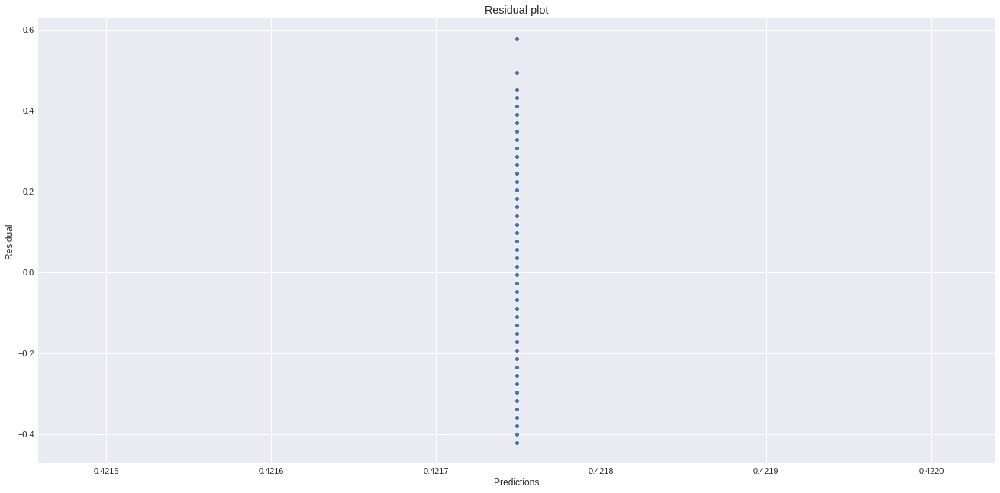

fitting time : 0.276839017868042

Model's score is : 0.9180212554987855
testing time : 0.0038042068481445312

RMSE : 1.9747724096081538

The cross-validation score is: 0.921084407149718

The error in the prediction for each player is:
       Overall  predicted          player Name  error in Prediction
16762       56  56.944734        F. Al Rashidi             0.944734
13469       62  62.495366           K. Brünker             0.495366
15853       58  58.644728            L. Saxton             0.644728
17550       53  55.459029          F. Figueroa             2.459029
16988       56  55.838473          A. Al Enazi             0.161527
15437       59  58.629486          M. Baghdadi             0.370514
12614       63  59.787588            K. Belmar             3.212412
14349       61  62.054433          I. La Rocca             1.054433
11164       64  65.603874              J. Bond             1.603874
18078       50  53.458873            B. Horton             3.458873
15216       60  6

Weight,Feature
0.4664 ± 0.0190,Special
0.2953 ± 0.0121,Potential
0.1544 ± 0.0047,Age
0.0846 ± 0.0045,Reactions
0.0809 ± 0.0033,GKDiving
0.0325 ± 0.0014,Value
0.0178 ± 0.0006,Composure
0.0101 ± 0.0008,Defending
0.0095 ± 0.0010,Positioning
0.0057 ± 0.0005,Balance


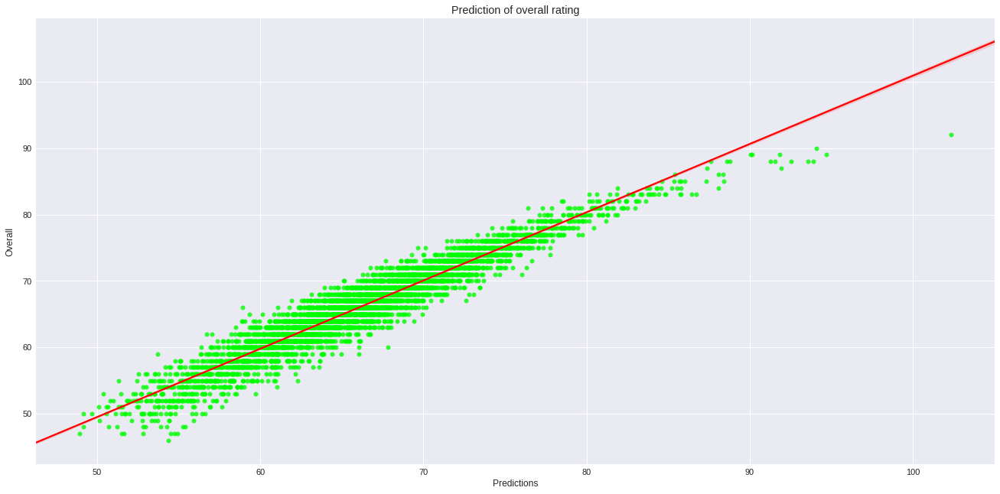

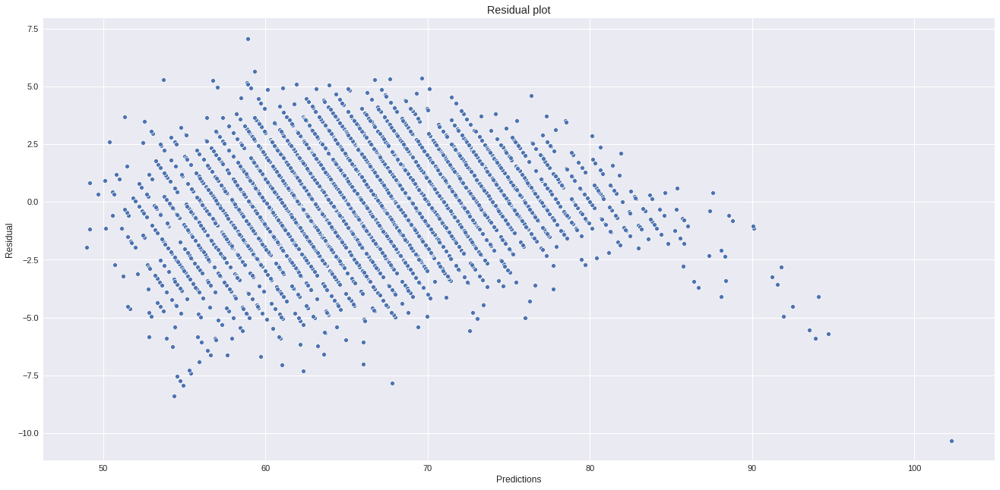

In [148]:
model = ElasticNet(alpha = 1, l1_ratio = 0.7)
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

There is not much difference in the performance of the algorithm for different values of l1 ratio, but as was the case with Lasso regression, the weights assigned to the variables are close to 0 for scaled data since ElasticNet regression has some amount of L1 penalty(Lasso regression).

In [149]:
from sklearn.svm import LinearSVR

/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


fitting time : 3.0424885749816895

Model's score is : 0.9310776327657516
testing time : 0.0031728744506835938

RMSE : 0.03748155784121359


/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



The cross-validation score is: 0.9245312726421178

The error in the prediction for each player is:
        Overall  predicted           player Name  error in Prediction
14533  0.312500   0.290879          P. Stępiński             0.021621
9511   0.416667   0.365997             D. Starkl             0.050670
8979   0.416667   0.414220             E. Sarraj             0.002447
12727  0.354167   0.307732             L. Suárez             0.046434
17245  0.187500   0.211396             M. Minder             0.023896
5507   0.500000   0.459408        I. Bel Hassani             0.040592
10760  0.395833   0.350111          Kim Nam Chun             0.045722
758    0.666667   0.650086           Dyego Sousa             0.016581
4097   0.520833   0.480780         F. Barrientos             0.040054
13179  0.333333   0.367488            D. Pelivan             0.034154
1119   0.645833   0.631837          K. Mitroglou             0.013996
10516  0.395833   0.367696               D. Sosa            

Weight,Feature
2.0291 ± 0.0327,Special
0.3672 ± 0.0070,Potential
0.2486 ± 0.0103,Age
0.2211 ± 0.0070,Shooting
0.1862 ± 0.0093,General
0.1232 ± 0.0057,Mental
0.0869 ± 0.0056,Defending
0.0534 ± 0.0024,Dribbling
0.0485 ± 0.0032,Curve
0.0482 ± 0.0009,Reactions


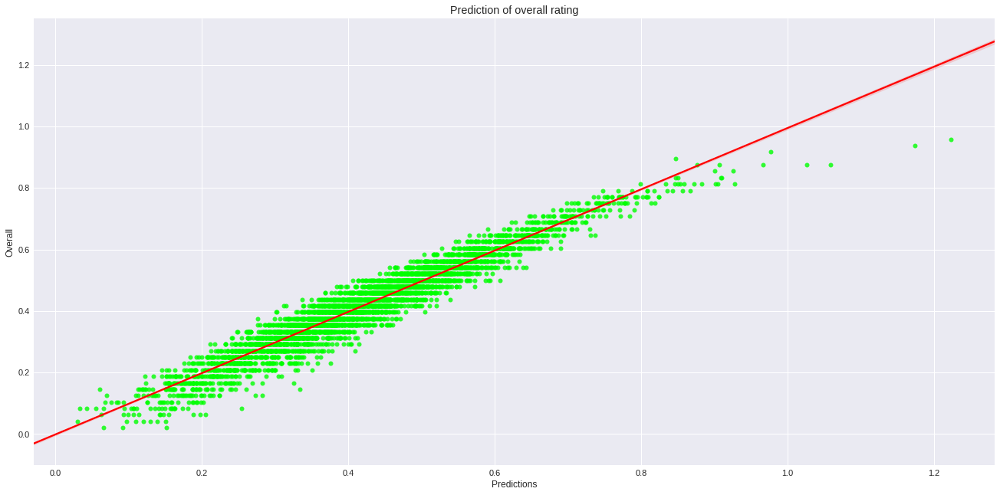

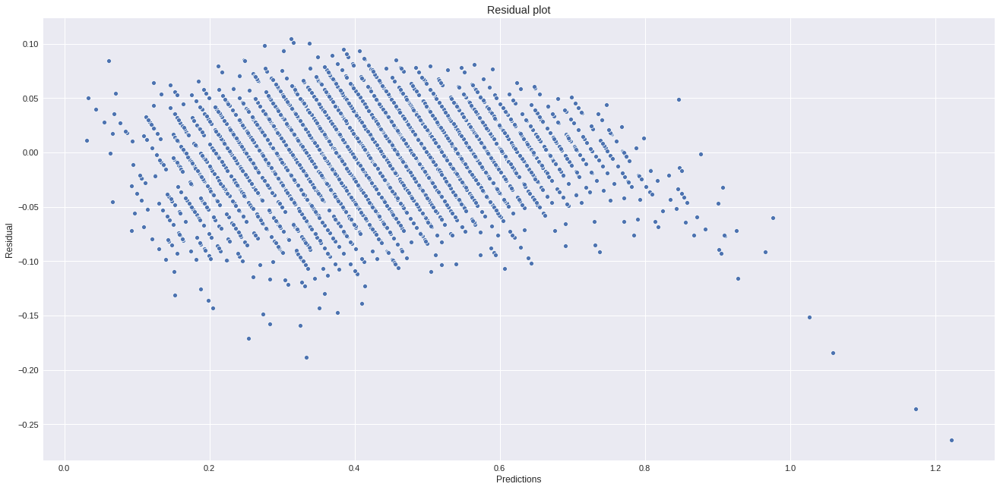

/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


fitting time : 3.8190739154815674

Model's score is : -3.1981183859897406
testing time : 0.003962993621826172

RMSE : 14.356042273659977


/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/opt/conda/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



The cross-validation score is: -10.271326946235108

The error in the prediction for each player is:
       Overall  predicted      player Name  error in Prediction
15926       58  58.367800        M. Onuoha             0.367800
1095        77  52.838797     N. Jørgensen            24.161203
15846       58  54.619665         M. Guehi             3.380335
11717       64  60.935491       R. Edwards             3.064509
14443       61  63.319629       B. Purkiss             2.319629
12508       63  65.224856         O. Mfulu             2.224856
1832        75  53.290498       A. Haidara            21.709502
8733        67  65.919541       L. Brattan             1.080459
10847       65  61.022765     J. Caenepeel             3.977235
10861       65  59.479704        D. Poleon             5.520296
2129        74  55.699646          C. Atsu            18.300354
10866       65  65.251271    F. Sporkslede             0.251271
9441        66  66.180022        H. Kawano             0.180022
118

Weight,Feature
5.2811 ± 0.0860,Special
0.4749 ± 0.0059,Reactions
0.4000 ± 0.0209,Potential
0.1795 ± 0.0113,Composure
0.1405 ± 0.0299,GKDiving
0.1026 ± 0.0074,HeadingAccuracy
0.0542 ± 0.0032,General
0.0367 ± 0.0056,Penalties
0.0209 ± 0.0046,Weight
0.0207 ± 0.0012,Volleys


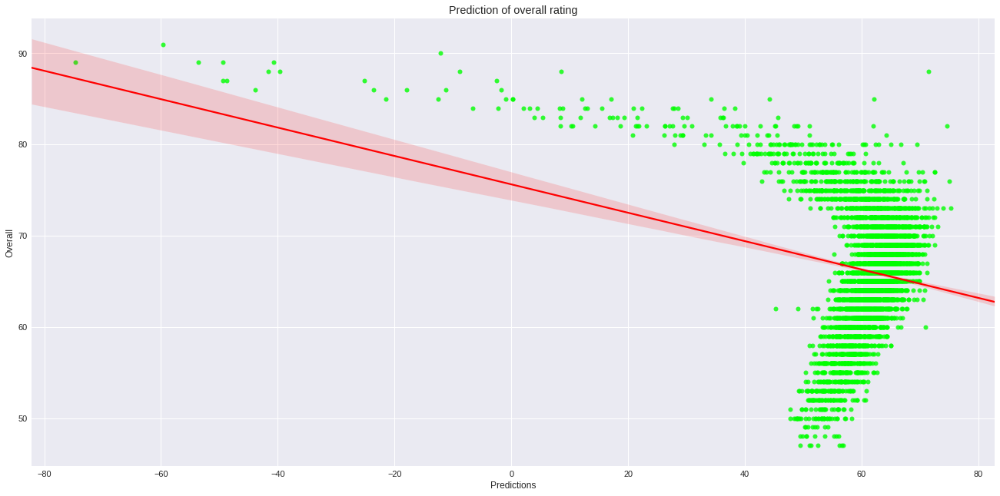

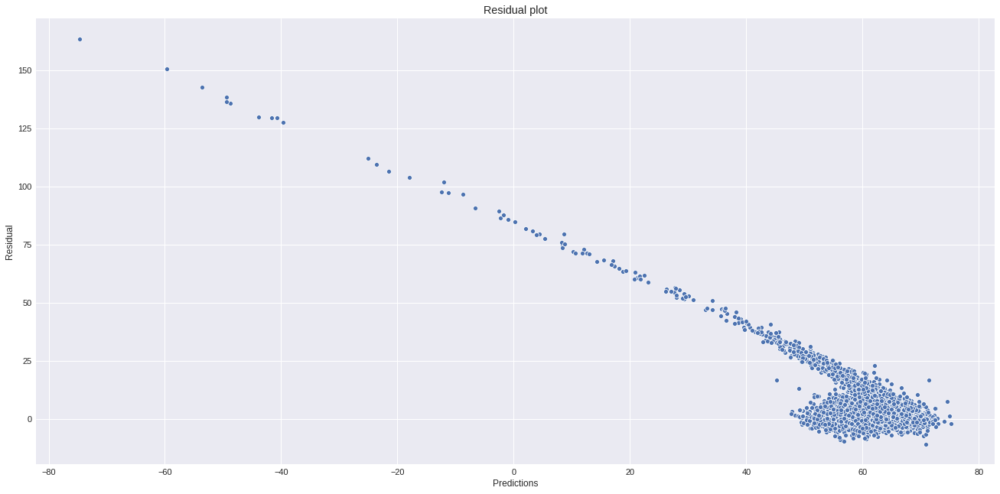

In [150]:
model = LinearSVR()
model_performance(model, dummy_df_scaled, output)
model_performance(model, dummy_df, output_2)

As you might have observed for the case of LinearSVR, the scaled data gives a much better performance than unscaled data, the reason for which is explained in the given link:

https://stackoverflow.com/questions/15436367/svm-scaling-input-values

Although the answer is about SVM, the same concept applies to LinearSVR as well.

Now, we will apply ensemble algorithms over the scaled data which will hopefully give a much better performance than the linear algorithms.
For understanding the reason due to which ensemble methods mostly work better than individual models, refer the given link:

https://www.quora.com/How-do-ensemble-methods-work-and-why-are-they-superior-to-individual-models

To understand the working of the ensemble algorithms, the scikit-learn documentation is an excellent source:

https://scikit-learn.org/stable/modules/ensemble.html

We will do a random grid search over the hyperparameters rather than a normal grid search. For understanding the concepts of hyperparameter tuning, refer the following article:

https://www.oreilly.com/ideas/evaluating-machine-learning-models/page/5/hyperparameter-tuning

The following paper shows that randomly chosen trials are more efficient for hyper-parameter optimization than trials on a regular grid.

http://jmlr.csail.mit.edu/papers/volume13/bergstra12a/bergstra12a.pdf

In [151]:
from sklearn.model_selection import RandomizedSearchCV

Splitting the data into train and test set.

In [152]:
x_train, x_test, y_train, y_test = train_test_split(dummy_df_scaled, output)
    
train_names = x_train.iloc[:,0]
x_train = x_train.iloc[:,1:]
test_names = x_test.iloc[:,0]
x_test = x_test.iloc[:,1:]

Let us first try Random Forest regression. 

In [153]:
from sklearn.ensemble import RandomForestRegressor

In [154]:
model = RandomForestRegressor()
print('Parameters currently in use:\n')
print(model.get_params())

Parameters currently in use:

{'bootstrap': True, 'criterion': 'mse', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 'warn', 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [155]:
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],# Number of trees in random forest
               'max_features': ['auto', 'sqrt'],# Number of features to consider at every split
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],# Maximum number of levels in tree
               'min_samples_split': [2, 5, 10, 20],# Minimum number of samples required to split a node
               'min_samples_leaf': [1, 2, 4, 10, 25],# Minimum number of samples required at each leaf node 
               'bootstrap': [True, False]}# Method of selecting samples for training each tree
print(random_grid)
        
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 5 different combinations
model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 2, cv = 3, verbose = 1, n_jobs = 1)
        
# Fit the random search model
model_random.fit(x_train, y_train)

print("\nThe best parameters for the model:", model_random.best_params_)
        
model = model_random.best_estimator_
        
start = time.time()
model.fit(x_train, y_train)
print("fitting time : {}".format(time.time()-start))
        
start = time.time()
y_pred = model.predict(x_test)
print("testing time : {}".format(time.time() - start))

print("\nThe importance of each feature for the model:", model.feature_importances_)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'min_samples_split': [2, 5, 10, 20], 'min_samples_leaf': [1, 2, 4, 10, 25], 'bootstrap': [True, False]}
Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.6min finished



The best parameters for the model: {'n_estimators': 1600, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 80, 'bootstrap': False}
fitting time : 68.23817276954651
testing time : 1.3527514934539795

The importance of each feature for the model: [3.58266011e-02 4.81371930e-02 6.13665886e-04 2.27867459e-01
 1.07704296e-01 5.33754524e-02 1.87644477e-02 9.84493298e-05
 2.96924431e-03 6.18333258e-04 1.87931949e-03 6.07787234e-03
 4.04219664e-03 1.02094791e-02 3.02667511e-02 3.16789818e-03
 1.71925581e-02 2.44176558e-03 1.15621898e-03 4.64191579e-03
 1.43816188e-03 1.32263788e-03 8.01213802e-04 1.25283067e-01
 9.71249023e-04 1.11240457e-02 1.18620597e-03 2.61455730e-03
 4.62117402e-03 4.81780024e-03 1.45515526e-02 9.00760841e-03
 9.51304504e-04 6.81331340e-02 1.38978187e-02 1.87148596e-02
 2.55470674e-02 4.58054981e-02 3.57322225e-02 2.19626572e-02
 2.45501599e-03 3.15923900e-03 8.71134338e-03 6.90419539e-05
 7.04071283e-05]


Although I have only used 2 iterations for the random search for this algorithm and Extra Trees regressor, you can try out more iterations which might increase the acccuracy of the models. The reason being that even with 5 iterations, it took about 45 minutes to find the optimal set of features for these 2 algorithms.


Model's score is : 0.9826528107356904

RMSE : 0.01877335135298448

The cross-validation score is: 0.9842583373127809

The error in the prediction for each player is:
        Overall  predicted            player Name  error in Prediction
12559  0.354167   0.347022                Y. Mena             0.007145
2268   0.583333   0.578966          Erick Gameira             0.004367
12495  0.354167   0.345730           Kim Jin Hyuk             0.008436
16777  0.208333   0.194344              Marc Vito             0.013989
3770   0.541667   0.543493               M. Abeid             0.001826
11531  0.375000   0.397596              R. Allsop             0.022596
16248  0.250000   0.273169           E. Linthorst             0.023169
265    0.750000   0.755090                 Morata             0.005090
2092   0.583333   0.566028               T. Melia             0.017305
1144   0.645833   0.656213            B. Džemaili             0.010379
10013  0.395833   0.385582            M. McKenzie   

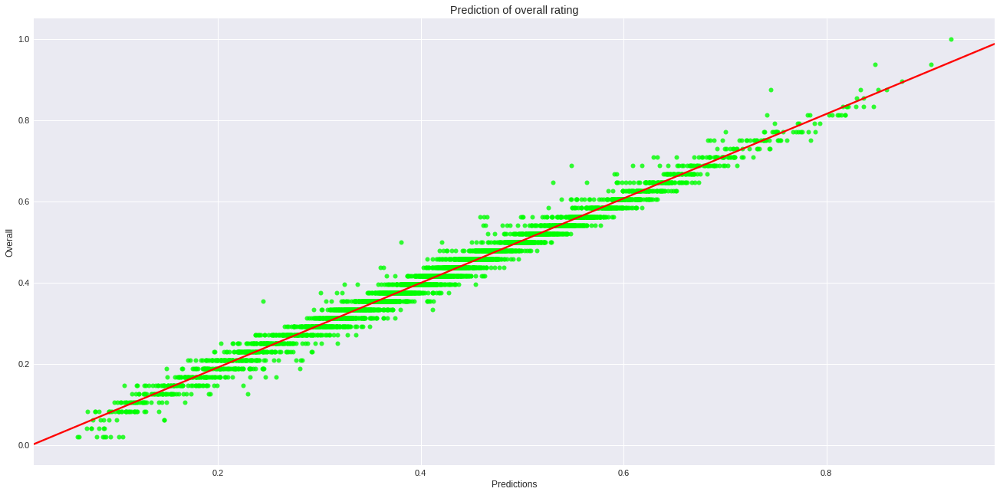

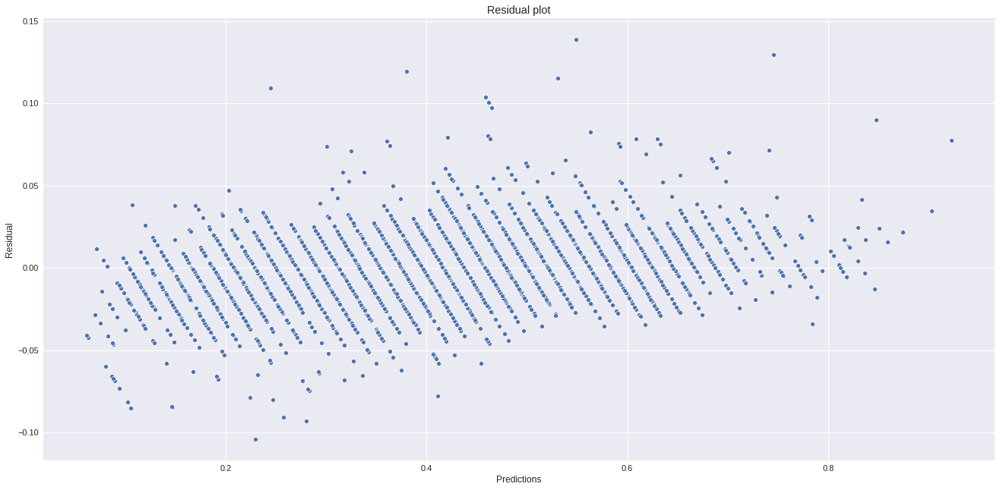

In [156]:
print("\nModel's score is :", model.score(x_test, y_test))
print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
        
crossScore = cross_val_score(model, X = dummy_df_scaled.iloc[:,1:], y = output, cv = KFold(n_splits = 5, shuffle = True)).mean()
print("\nThe cross-validation score is:", crossScore)
        
comparisionRDF = pd.DataFrame(y_test)
comparisionRDF['predicted'] = y_pred
comparisionRDF['player Name'] = test_names
comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
print("\nThe error in the prediction for each player is:")
print(comparisionRDF)
    
#Limits of error
print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))

print('\nParameters currently in use:\n')
print(model.get_params())
    
#Visualising the results
plt.figure(figsize=(20, 10))
sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Prediction of overall rating")
plt.show()

#Visualising the residual plot
plt.figure(figsize=(20, 10))
sns.scatterplot(y_pred, y_test - y_pred)
plt.xlabel('Predictions')
plt.ylabel('Residual')
plt.title("Residual plot")
plt.show()

We can see a huge jump in the score and a decrease in RMSE compared to the linear models even though we had only used 2 iterations for the random search of the hyperparameters, this demonstrates the power of ensembling algorithms. Also, the residual plot has drastically improved compared to the linear models.

Now, let us try Extra Trees regression.

In [157]:
from sklearn.ensemble import ExtraTreesRegressor

In [158]:
model = ExtraTreesRegressor()
print('Parameters currently in use:\n')
print(model.get_params())

Parameters currently in use:

{'bootstrap': False, 'criterion': 'mse', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 'warn', 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [159]:
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],# Number of trees in random forest
               'max_features': ['auto', 'sqrt'],# Number of features to consider at every split
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],# Maximum number of levels in tree
               'min_samples_split': [2, 5, 10, 20],# Minimum number of samples required to split a node
               'min_samples_leaf': [1, 2, 4, 10, 25],# Minimum number of samples required at each leaf node 
               'bootstrap': [True, False]}# Method of selecting samples for training each tree
print(random_grid)
        
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 10 different combinations
model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 2, cv = 3, verbose = 1, n_jobs = 1)
        
# Fit the random search model
model_random.fit(x_train, y_train)


print("\nThe best parameters for the model:", model_random.best_params_)
        
model = model_random.best_estimator_
        
start = time.time()
model.fit(x_train, y_train)
print("fitting time : {}".format(time.time()-start))
        
start = time.time()
y_pred = model.predict(x_test)
print("testing time : {}".format(time.time() - start))

print("\nThe importance of each feature for the model:", model.feature_importances_)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'min_samples_split': [2, 5, 10, 20], 'min_samples_leaf': [1, 2, 4, 10, 25], 'bootstrap': [True, False]}
Fitting 3 folds for each of 2 candidates, totalling 6 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.3min finished



The best parameters for the model: {'n_estimators': 1600, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 80, 'bootstrap': True}
fitting time : 65.2994966506958
testing time : 1.2014899253845215

The importance of each feature for the model: [5.42147354e-02 7.42288701e-02 2.15549920e-04 2.23492447e-01
 5.71725645e-02 6.31830780e-02 2.36762357e-02 1.86639147e-04
 1.94771865e-03 2.77337188e-04 7.14482714e-04 1.33365400e-03
 1.04932299e-03 4.79807847e-03 2.18826564e-02 5.84399115e-04
 6.00124481e-03 5.01969531e-04 2.66556356e-04 2.28645906e-03
 3.67795766e-04 3.15311687e-04 2.41740232e-04 2.48120424e-01
 2.64130591e-04 3.81867982e-03 2.59879492e-04 5.04944470e-04
 2.83708159e-03 1.20702796e-03 3.06703507e-03 2.72854561e-03
 3.26770021e-04 8.99468413e-02 4.51715258e-03 1.12927058e-02
 1.08056355e-02 3.62325506e-02 2.81553318e-02 1.32438079e-02
 4.36341565e-04 7.29092393e-04 2.22927529e-03 1.66744750e-04
 1.71155761e-04]



Model's score is : 0.9925158339317676

RMSE : 0.012331018737064768

The cross-validation score is: 0.9931692076100422

The error in the prediction for each player is:
        Overall  predicted            player Name  error in Prediction
12559  0.354167   0.359036                Y. Mena             0.004869
2268   0.583333   0.581688          Erick Gameira             0.001645
12495  0.354167   0.359665           Kim Jin Hyuk             0.005499
16777  0.208333   0.201708              Marc Vito             0.006625
3770   0.541667   0.534811               M. Abeid             0.006855
11531  0.375000   0.385978              R. Allsop             0.010978
16248  0.250000   0.252135           E. Linthorst             0.002135
265    0.750000   0.769787                 Morata             0.019787
2092   0.583333   0.576515               T. Melia             0.006818
1144   0.645833   0.646818            B. Džemaili             0.000985
10013  0.395833   0.392080            M. McKenzie  

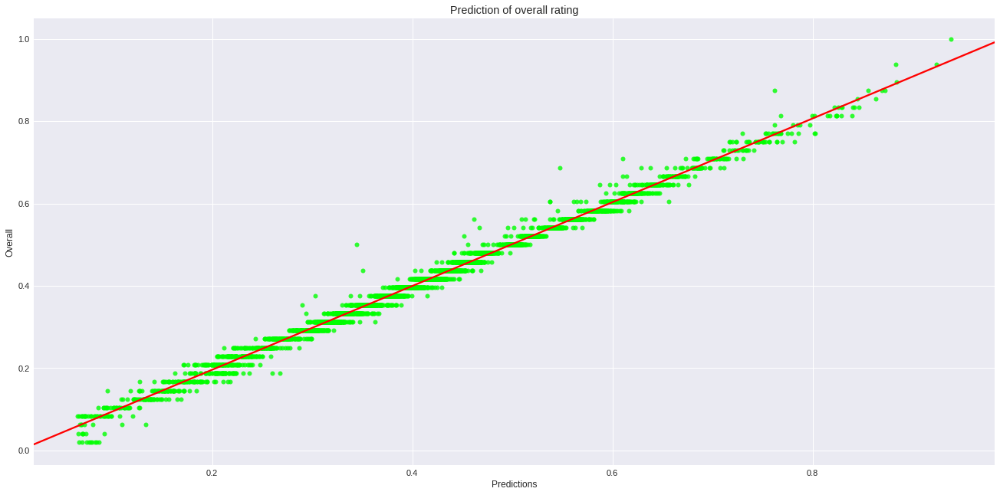

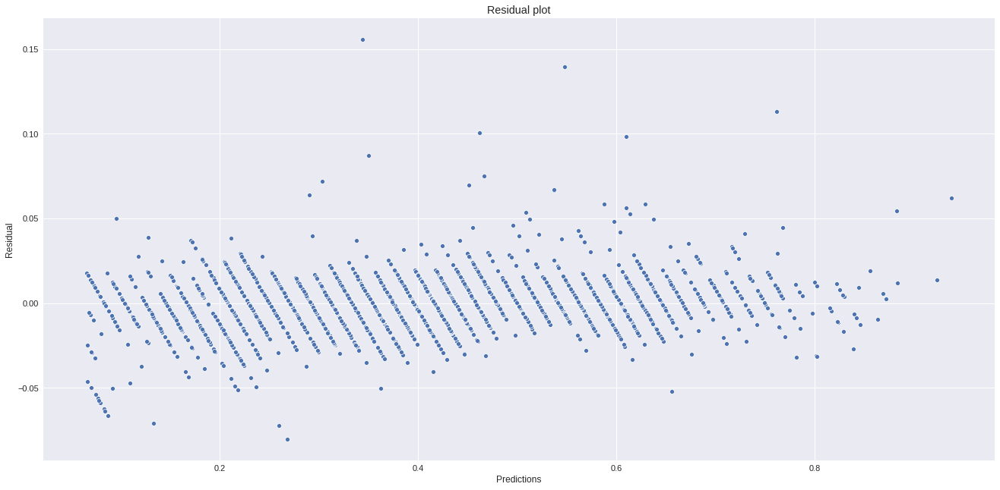

In [160]:
print("\nModel's score is :", model.score(x_test, y_test))
print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
        
crossScore = cross_val_score(model, X = dummy_df_scaled.iloc[:,1:], y = output, cv = KFold(n_splits = 5, shuffle = True)).mean()
print("\nThe cross-validation score is:", crossScore)
        
comparisionRDF = pd.DataFrame(y_test)
comparisionRDF['predicted'] = y_pred
comparisionRDF['player Name'] = test_names
comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
print("\nThe error in the prediction for each player is:")
print(comparisionRDF)
    
#Limits of error
print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))

print('\nParameters currently in use:\n')
print(model.get_params())
    
#Visualising the results
plt.figure(figsize=(20, 10))
sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Prediction of overall rating")
plt.show()

#Visualising the residual plot
plt.figure(figsize=(20, 10))
sns.scatterplot(y_pred, y_test - y_pred)
plt.xlabel('Predictions')
plt.ylabel('Residual')
plt.title("Residual plot")
plt.show()

Let us use AdaBoost regression

In [161]:
from sklearn.ensemble import AdaBoostRegressor

In [162]:
model = AdaBoostRegressor()
print('Parameters currently in use:\n')
print(model.get_params())

Parameters currently in use:

{'base_estimator': None, 'learning_rate': 1.0, 'loss': 'linear', 'n_estimators': 50, 'random_state': None}


In [163]:
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)],# Maximum number of trees at which boosting is terminated
               'learning_rate': [0.01, 0.05, 0.1, 0.3, 1],# Learning rate of the algorithm
               'loss': ['linear', 'square', 'exponential']}# Loss function to be used for updating the weights
print(random_grid)
        
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 5, cv = 3, verbose = 1, n_jobs = 1)

# Fit the random search model
model_random.fit(x_train, y_train)
        
print("\nThe best parameters for the model:", model_random.best_params_)
        
model = model_random.best_estimator_
        
start = time.time()
model.fit(x_train, y_train)
print("fitting time : {}".format(time.time()-start))
        
start = time.time()
y_pred = model.predict(x_test)
print("testing time : {}".format(time.time() - start))        
        
print("\nThe weights given to different estimators:", model.estimator_weights_)
        
print("\nThe errors of different estimators:", model.estimator_errors_)

{'n_estimators': [20, 40, 60, 80, 100, 120, 140, 160, 180, 200], 'learning_rate': [0.01, 0.05, 0.1, 0.3, 1], 'loss': ['linear', 'square', 'exponential']}
Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  1.2min finished



The best parameters for the model: {'n_estimators': 180, 'loss': 'square', 'learning_rate': 0.1}
fitting time : 11.17264437675476
testing time : 0.11348915100097656

The weights given to different estimators: [0.39270693 0.38117959 0.35466381 0.3577962  0.35314373 0.33937534
 0.38281356 0.32443127 0.31546593 0.3555714  0.34624779 0.3038523
 0.33806683 0.35023308 0.28069495 0.29034184 0.27581267 0.3343872
 0.33133287 0.28683237 0.25266134 0.33127078 0.30624339 0.30594013
 0.30467666 0.31884566 0.28527952 0.29661057 0.30322373 0.28618885
 0.2875011  0.2989922  0.26454229 0.27758707 0.28463221 0.27388768
 0.2534129  0.27903482 0.28937993 0.2645649  0.25550915 0.26471505
 0.24763738 0.27277296 0.22489598 0.26463421 0.24012237 0.25197834
 0.30627145 0.27699068 0.23524319 0.23441904 0.25841908 0.23204275
 0.27825939 0.26706028 0.29309409 0.24712446 0.2622403  0.23419121
 0.29068732 0.22802983 0.23606928 0.2789449  0.22862224 0.28054596
 0.25154364 0.24126547 0.22934357 0.29007405 0.27826973


Model's score is : 0.9360171240125326

RMSE : 0.036054471058690085

The cross-validation score is: 0.936894553822382

The error in the prediction for each player is:
        Overall  predicted            player Name  error in Prediction
12559  0.354167   0.363123                Y. Mena             0.008957
2268   0.583333   0.579490          Erick Gameira             0.003844
12495  0.354167   0.369248           Kim Jin Hyuk             0.015081
16777  0.208333   0.188314              Marc Vito             0.020020
3770   0.541667   0.535007               M. Abeid             0.006660
11531  0.375000   0.402692              R. Allsop             0.027692
16248  0.250000   0.304179           E. Linthorst             0.054179
265    0.750000   0.763800                 Morata             0.013800
2092   0.583333   0.532571               T. Melia             0.050762
1144   0.645833   0.641834            B. Džemaili             0.003999
10013  0.395833   0.368323            M. McKenzie   

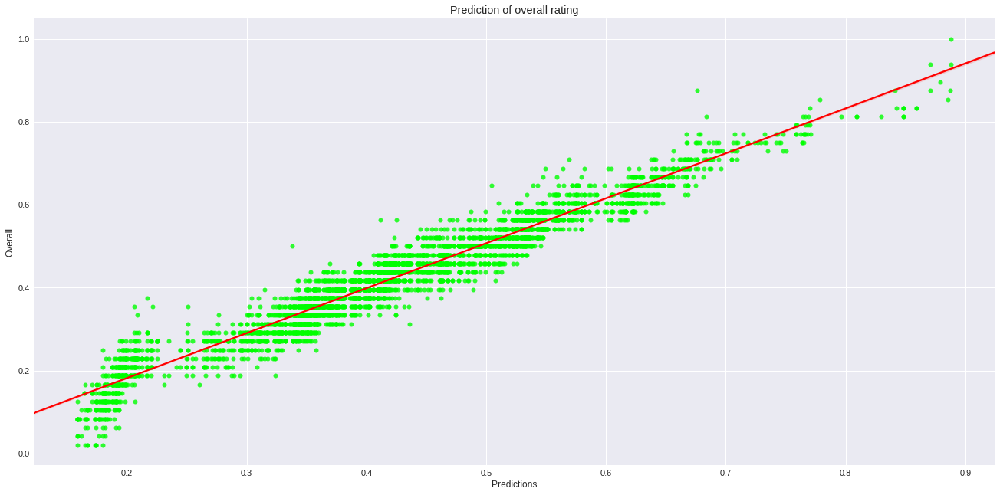

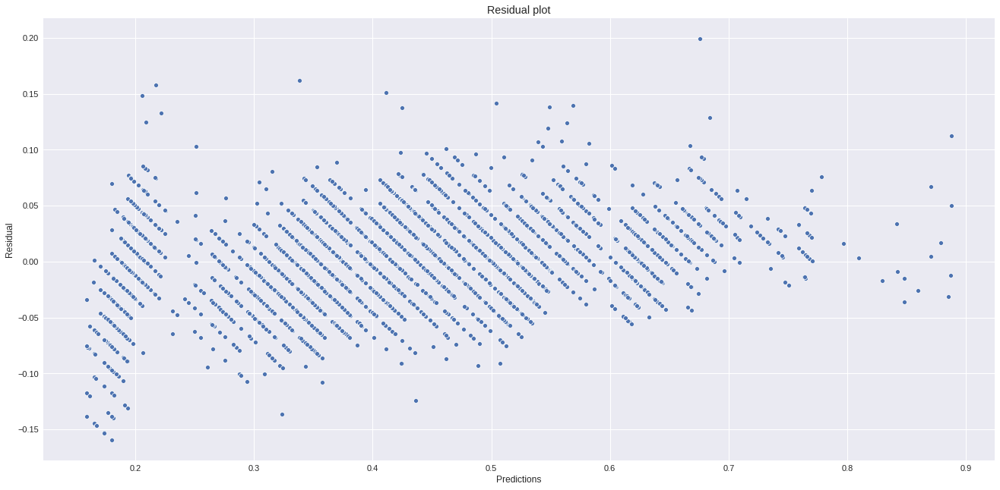

In [164]:
print("\nModel's score is :", model.score(x_test, y_test))
print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
        
crossScore = cross_val_score(model, X = dummy_df_scaled.iloc[:,1:], y = output, cv = KFold(n_splits = 5, shuffle = True)).mean()
print("\nThe cross-validation score is:", crossScore)
        
comparisionRDF = pd.DataFrame(y_test)
comparisionRDF['predicted'] = y_pred
comparisionRDF['player Name'] = test_names
comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
print("\nThe error in the prediction for each player is:")
print(comparisionRDF)
    
#Limits of error
print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))

print('\nParameters currently in use:\n')
print(model.get_params())
    
#Visualising the results
plt.figure(figsize=(20, 10))
sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Prediction of overall rating")
plt.show()

#Visualising the residual plot
plt.figure(figsize=(20, 10))
sns.scatterplot(y_pred, y_test - y_pred)
plt.xlabel('Predictions')
plt.ylabel('Residual')
plt.title("Residual plot")
plt.show()

Let us now try Gradient Boosting regression.

In [165]:
from sklearn.ensemble import GradientBoostingRegressor

In [166]:
model = GradientBoostingRegressor()
print('Parameters currently in use:\n')
print(model.get_params())

Parameters currently in use:

{'alpha': 0.9, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'ls', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'presort': 'auto', 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [167]:
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],# Number of trees 
               'max_features': ['auto', 'sqrt'],# Number of features to consider at every split
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],# Maximum number of levels in tree
               'min_samples_split': [2, 5, 10, 20],# Minimum number of samples required to split a node
               'min_samples_leaf': [1, 2, 4, 10, 25]}# Minimum number of samples required at each leaf node
print(random_grid)
        
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 5, cv = 3, verbose = 1, n_jobs = 1)

# Fit the random search model
model_random.fit(x_train, y_train)
        
print("\nThe best parameters for the model:", model_random.best_params_)
        
model = model_random.best_estimator_
        
start = time.time()
model.fit(x_train, y_train)
print("fitting time : {}".format(time.time()-start))
        
start = time.time()
y_pred = model.predict(x_test)
print("testing time : {}".format(time.time() - start))

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'min_samples_split': [2, 5, 10, 20], 'min_samples_leaf': [1, 2, 4, 10, 25]}
Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  5.6min finished



The best parameters for the model: {'n_estimators': 1600, 'min_samples_split': 20, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 10}
fitting time : 57.791279315948486
testing time : 0.0986332893371582



Model's score is : 0.9963165573188261

RMSE : 0.008650758893556314

The cross-validation score is: 0.9964081308703883

The error in the prediction for each player is:
        Overall  predicted            player Name  error in Prediction
12559  0.354167   0.355335                Y. Mena             0.001168
2268   0.583333   0.582927          Erick Gameira             0.000407
12495  0.354167   0.360384           Kim Jin Hyuk             0.006218
16777  0.208333   0.206037              Marc Vito             0.002296
3770   0.541667   0.529896               M. Abeid             0.011771
11531  0.375000   0.378202              R. Allsop             0.003202
16248  0.250000   0.246718           E. Linthorst             0.003282
265    0.750000   0.748556                 Morata             0.001444
2092   0.583333   0.584346               T. Melia             0.001012
1144   0.645833   0.646313            B. Džemaili             0.000480
10013  0.395833   0.392673            M. McKenzie  

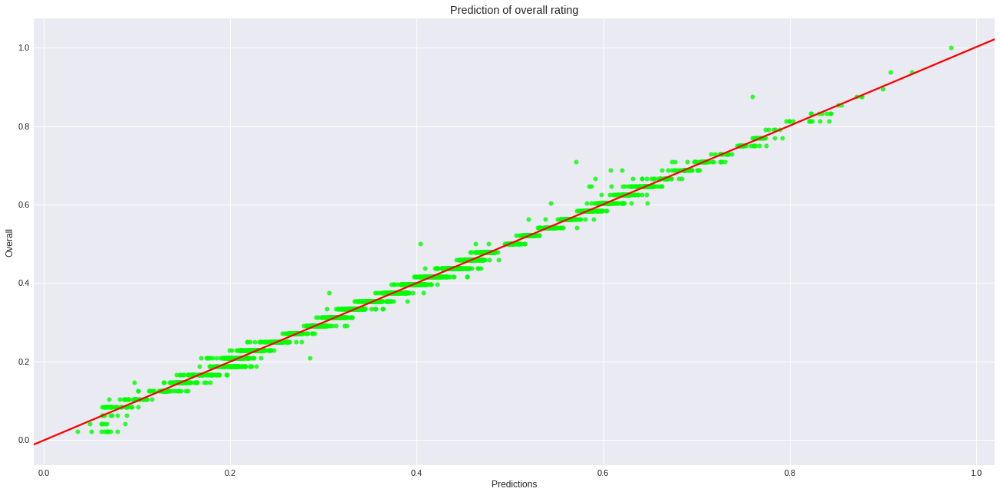

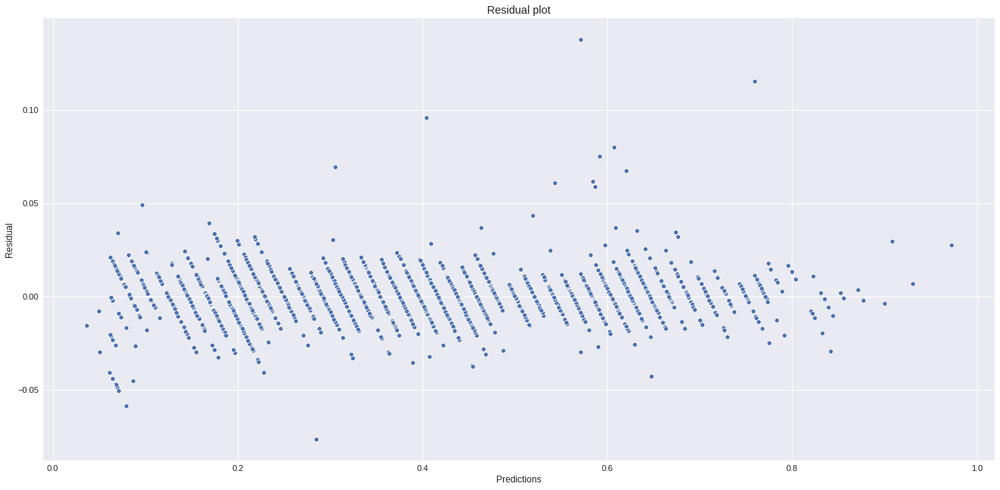

In [168]:
print("\nModel's score is :", model.score(x_test, y_test))
print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
        
crossScore = cross_val_score(model, X = dummy_df_scaled.iloc[:,1:], y = output, cv = KFold(n_splits = 5, shuffle = True)).mean()
print("\nThe cross-validation score is:", crossScore)
        
comparisionRDF = pd.DataFrame(y_test)
comparisionRDF['predicted'] = y_pred
comparisionRDF['player Name'] = test_names
comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
print("\nThe error in the prediction for each player is:")
print(comparisionRDF)
    
#Limits of error
print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))

print('\nParameters currently in use:\n')
print(model.get_params())
    
#Visualising the results
plt.figure(figsize=(20, 10))
sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Prediction of overall rating")
plt.show()

#Visualising the residual plot
plt.figure(figsize=(20, 10))
sns.scatterplot(y_pred, y_test - y_pred)
plt.xlabel('Predictions')
plt.ylabel('Residual')
plt.title("Residual plot")
plt.show()

Let us try the XGBoost algorithm. For a tutorial on hyperparameter tuning of the XGBoost algorithm, refer the following article:

https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/

For understanding the effectiveness of this algorithm, take a look at the following link:

https://towardsdatascience.com/https-medium-com-vishalmorde-xgboost-algorithm-long-she-may-rein-edd9f99be63d

In [169]:
import xgboost as xgb

In [170]:
model = xgb.XGBRegressor()
print('Parameters currently in use:\n')
print(model.get_params())

Parameters currently in use:

{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'importance_type': 'gain', 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 3, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'n_jobs': 1, 'nthread': None, 'objective': 'reg:linear', 'random_state': 0, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': None, 'silent': None, 'subsample': 1, 'verbosity': 1}


In [171]:
# Create the random grid
random_grid = {'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],# Number of trees
               'learning_rate': [0.01, 0.05, 0.1, 0.3, 1],# Learning rate of the algorithm
               'min_child_weight': [1, 3, 5, 7, 9],# Minimum sum of instance weight needed in a child
               'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],# Maximum number of levels in a tree
               'colsample_bytree': [0.5, 0.8, 1],# Subsample ratio of columns when constructing each tree,
               'scale_pos_weight': [1, 2, 3, 4, 5]}# Balancing of positive and negative weights
print(random_grid)
        
# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 5, cv = 3, verbose = 1, n_jobs = 1)

# Fit the random search model
model_random.fit(x_train, y_train)
        
print("\nThe best parameters for the model:", model_random.best_params_)
        
model = model_random.best_estimator_
        
start = time.time()
model.fit(x_train, y_train)
print("fitting time : {}".format(time.time()-start))
        
start = time.time()
y_pred = model.predict(x_test)
print("testing time : {}".format(time.time() - start))
        
print("\nThe underlying xgboost booster of this model:", model.get_booster())
        
print("\nThe number of xgboost boosting rounds:", model.get_num_boosting_rounds())
    
print("\nXgboost type parameters:", model.get_xgb_params())        

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'learning_rate': [0.01, 0.05, 0.1, 0.3, 1], 'min_child_weight': [1, 3, 5, 7, 9], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'colsample_bytree': [0.5, 0.8, 1], 'scale_pos_weight': [1, 2, 3, 4, 5]}
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[05:41:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:42:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:43:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:44:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:44:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:44:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:44:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:45:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:45:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:45:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:46:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:47:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:49:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:49:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:49:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  7.8min finished
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:49:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

The best parameters for the model: {'scale_pos_weight': 4, 'n_estimators': 1000, 'min_child_weight': 3, 'max_depth': 80, 'learning_rate': 0.1, 'colsample_bytree': 1}
[05:50:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fitting time : 21.11470603942871
testing time : 0.0969538688659668

The underlying xgboost booster of this model: <xgboost.core.Booster object at 0x7ff0f18cb6d8>

The number of xgboost boosting rounds: 1000

Xgboost type parameters: {'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 0, 'importance_type': 'gain', 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 80, 'min_child_weight': 3, 'missing': None, 'n_estimators': 1000, 'nthread': 1, 'objective': 'reg:linear', 'reg_alpha': 0, 'reg_lambda': 1, 


Model's score is : 0.9958925101449747

RMSE : 0.009135146144076569
[05:50:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:50:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:51:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:51:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:51:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

The cross-validation score is: 0.9962555691879995

The error in the prediction for each player is:
        Overall  predicted            player Name  error in Prediction
12559  0.354167   0.357726                Y. Mena             0.003560
2268   0.583333   0.583473          Erick Gameira             0.000140
12495  0.354167   0.365067           Kim Jin Hyuk             0.010900
16777  0.208333   0.193139              Marc Vito             0.015194
3770   0.541667   0.531761               M. Abeid             0.009905
11531  0.375000   0.374862              R. Allsop             0.000138
16248  0.250000   0.250366           E. Linthorst             0.000366
265    0.750000   0.749560                 Morata             0.000440
2092   0.583333   0.582316               T. Melia             0.001018
1144   0.645833   0.646727            B. Džemaili             0

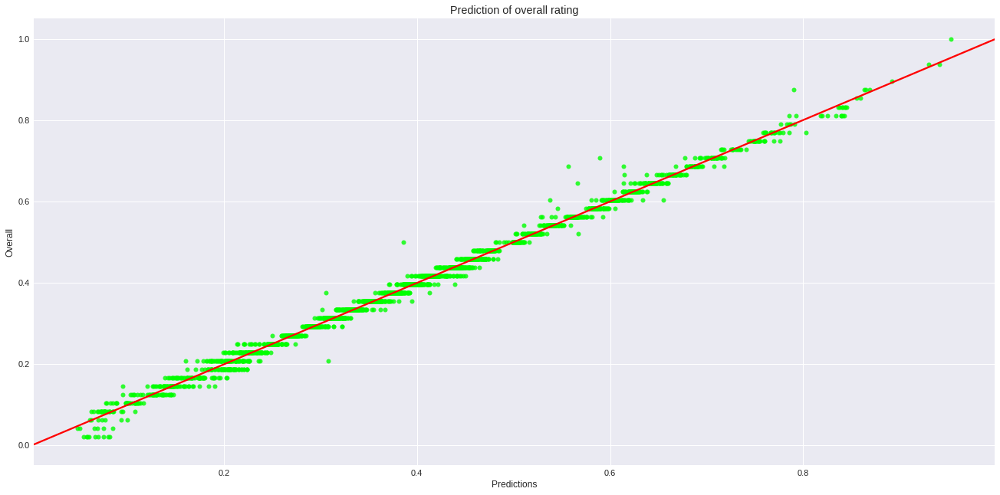

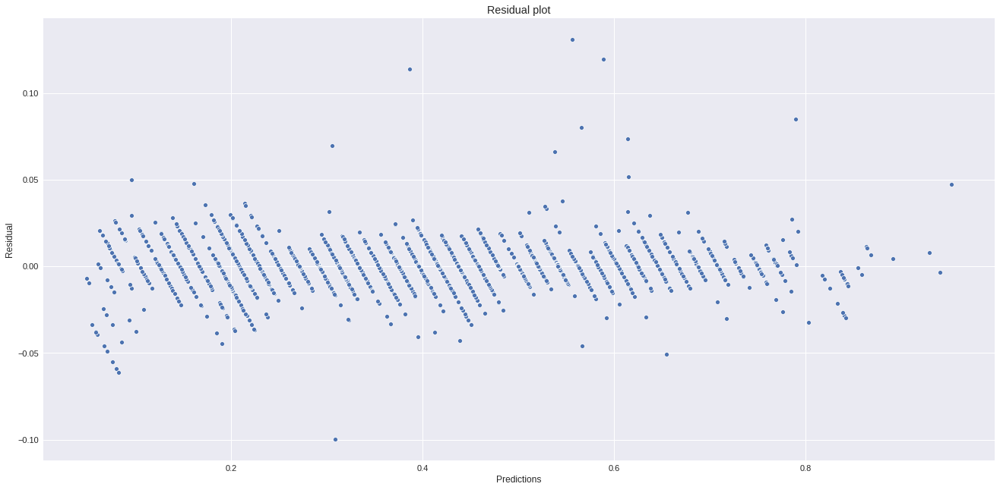

In [172]:
print("\nModel's score is :", model.score(x_test, y_test))
print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
        
crossScore = cross_val_score(model, X = dummy_df_scaled.iloc[:,1:], y = output, cv = KFold(n_splits = 5, shuffle = True)).mean()
print("\nThe cross-validation score is:", crossScore)
        
comparisionRDF = pd.DataFrame(y_test)
comparisionRDF['predicted'] = y_pred
comparisionRDF['player Name'] = test_names
comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
print("\nThe error in the prediction for each player is:")
print(comparisionRDF)
    
#Limits of error
print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))

print('\nParameters currently in use:\n')
print(model.get_params())
    
#Visualising the results
plt.figure(figsize=(20, 10))
sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Prediction of overall rating")
plt.show()

#Visualising the residual plot
plt.figure(figsize=(20, 10))
sns.scatterplot(y_pred, y_test - y_pred)
plt.xlabel('Predictions')
plt.ylabel('Residual')
plt.title("Residual plot")
plt.show()

As observed above, all the ensemble algorithms performed much better than the linear algorithms, hence, proving their supremacy.

Now, let us try k-nearest neighbours regression.

In [173]:
from sklearn.neighbors import KNeighborsRegressor

In [174]:
# Create the random grid
random_grid = {'n_neighbors': [5, 10, 15, 20],# Number of neighbors
               'weights': ['uniform', 'distance'],# Whether to weigh each point in the neighborhood equally or by the inverse of their distance
               'leaf_size': [20, 30, 40, 50]}# To be passed to the algorithm which will be used to compute the nearest neighbors
print(random_grid)

# Use the random grid to search for best hyperparameters
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
model_random = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 5, cv = 3, verbose = 1, n_jobs = 1)

# Fit the random search model
model_random.fit(x_train, y_train)
        
print("\nThe best parameters for the model:", model_random.best_params_)
        
model = model_random.best_estimator_
        
start = time.time()
model.fit(x_train, y_train)
print("fitting time : {}".format(time.time()-start))
        
start = time.time()
y_pred = model.predict(x_test)
print("testing time : {}".format(time.time() - start))

{'n_neighbors': [5, 10, 15, 20], 'weights': ['uniform', 'distance'], 'leaf_size': [20, 30, 40, 50]}
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[05:52:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:52:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:52:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:53:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:53:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:53:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:53:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:53:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:54:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:54:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:54:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:54:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:55:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:55:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:55:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  3.5min finished
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:55:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

The best parameters for the model: {'weights': 'uniform', 'n_neighbors': 20, 'leaf_size': 30}
[05:56:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
fitting time : 21.197992086410522
testing time : 0.10456705093383789



Model's score is : 0.9958925101449747

RMSE : 0.009135146144076569
[05:56:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:56:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:57:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:57:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/opt/conda/lib/python3.6/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[05:58:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

The cross-validation score is: 0.9961818789570588

The error in the prediction for each player is:
        Overall  predicted            player Name  error in Prediction
12559  0.354167   0.357726                Y. Mena             0.003560
2268   0.583333   0.583473          Erick Gameira             0.000140
12495  0.354167   0.365067           Kim Jin Hyuk             0.010900
16777  0.208333   0.193139              Marc Vito             0.015194
3770   0.541667   0.531761               M. Abeid             0.009905
11531  0.375000   0.374862              R. Allsop             0.000138
16248  0.250000   0.250366           E. Linthorst             0.000366
265    0.750000   0.749560                 Morata             0.000440
2092   0.583333   0.582316               T. Melia             0.001018
1144   0.645833   0.646727            B. Džemaili             0

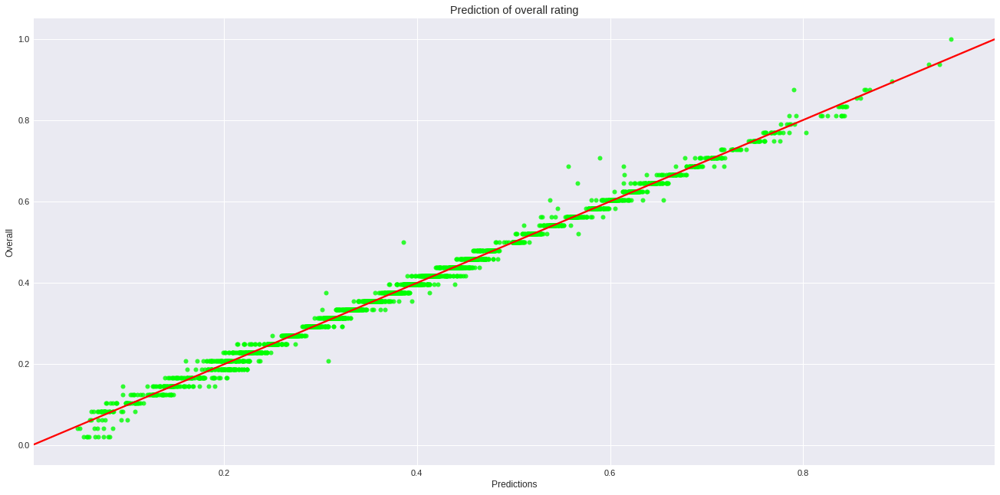

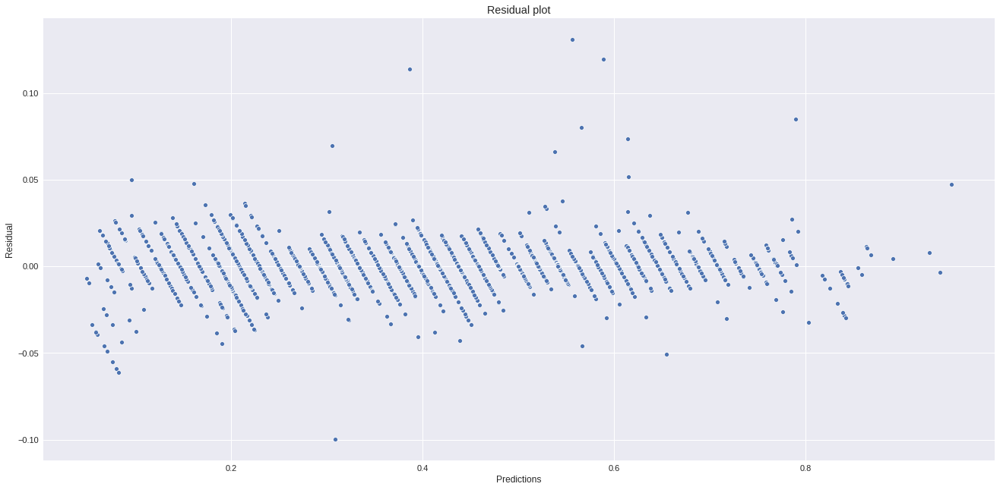

In [175]:
print("\nModel's score is :", model.score(x_test, y_test))
print('\nRMSE : '+str(np.sqrt(mean_squared_error(y_test, y_pred))))
        
crossScore = cross_val_score(model, X = dummy_df_scaled.iloc[:,1:], y = output, cv = KFold(n_splits = 5, shuffle = True)).mean()
print("\nThe cross-validation score is:", crossScore)
        
comparisionRDF = pd.DataFrame(y_test)
comparisionRDF['predicted'] = y_pred
comparisionRDF['player Name'] = test_names
comparisionRDF['error in Prediction'] = np.abs(comparisionRDF['predicted'] - comparisionRDF['Overall'])
print("\nThe error in the prediction for each player is:")
print(comparisionRDF)
    
#Limits of error
print("\nLimit of error of our model is ({},{})".format(comparisionRDF['error in Prediction'].min(),comparisionRDF['error in Prediction'].max()))

print('\nParameters currently in use:\n')
print(model.get_params())
    
#Visualising the results
plt.figure(figsize=(20, 10))
sns.regplot(y_pred, y_test, scatter_kws = {'color':'lime'}, line_kws = {'color':'red'})
plt.xlabel('Predictions')
plt.ylabel('Overall')
plt.title("Prediction of overall rating")
plt.show()

#Visualising the residual plot
plt.figure(figsize=(20, 10))
sns.scatterplot(y_pred, y_test - y_pred)
plt.xlabel('Predictions')
plt.ylabel('Residual')
plt.title("Residual plot")
plt.show()

Even k-nearest neighbours performs significantly better than linear models and is at par with ensemble models.

Finally, let us try to fit a neural network on the scaled data. We will build the neural network using Keras.

In [176]:
from keras.layers import Input,Dense
from keras.models import Model
from keras.optimizers import Adam

Using TensorFlow backend.


Splitting the data into train and test set.

In [177]:
x_train_nn, x_test_nn, y_train_nn, y_test_nn = train_test_split(dummy_df_scaled, output)
    
train_names_nn = x_train_nn.iloc[:,0]
x_train_nn = x_train_nn.iloc[:,1:]
test_names_nn = x_test_nn.iloc[:,0]
x_test_nn = x_test_nn.iloc[:,1:]

We will build a five layered neural network with 3 hidden layers, however, this is not based on any theory, rather, it is based on trial and error and since this model gave a great performance, I went ahead with this, you can try building your own architecture and experiment with them. The learning rate was also selected after doing a few experiments, however, there are techniques which can assist in finding an optimal learning rate, one such technique is described here:

https://arxiv.org/abs/1506.01186

The loss and the metric, both, are mean squared error since we will compare the performance of the neural network with the other algorithms using this metric.

In [178]:
input_layer = Input((dummy_df_scaled.shape[1] - 1,))
y = Dense(64, kernel_initializer = 'he_normal', activation = 'relu')(input_layer)
y = Dense(32, kernel_initializer = 'he_normal', activation = 'relu')(y)
y = Dense(8, kernel_initializer = 'he_normal', activation = 'relu')(y)
y = Dense(1, kernel_initializer = 'he_normal', activation = 'sigmoid')(y)

model = Model(inputs = input_layer, outputs = y)
model.compile(optimizer = Adam(lr = 0.001), loss = 'mse', metrics = ['mean_squared_error'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 45)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                2944      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 264       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 9         
Total params: 5,297
Trainable params: 5,297
Non-trainable params: 0
_________________________________________________________________


In [179]:
history = model.fit(x_train_nn, y_train_nn, epochs = 1000, batch_size = 512)

Epoch 1/1000
13655/13655 [==============================] - 2s 111us/step - loss: 0.0207 - mean_squared_error: 0.0207
Epoch 2/1000
13655/13655 [==============================] - 0s 6us/step - loss: 0.0136 - mean_squared_error: 0.0136
Epoch 3/1000
13655/13655 [==============================] - 0s 6us/step - loss: 0.0084 - mean_squared_error: 0.0084
Epoch 4/1000
13655/13655 [==============================] - 0s 6us/step - loss: 0.0051 - mean_squared_error: 0.0051
Epoch 5/1000
13655/13655 [==============================] - 0s 6us/step - loss: 0.0035 - mean_squared_error: 0.0035
Epoch 6/1000
13655/13655 [==============================] - 0s 6us/step - loss: 0.0028 - mean_squared_error: 0.0028
Epoch 7/1000
13655/13655 [==============================] - 0s 6us/step - loss: 0.0024 - mean_squared_error: 0.0024
Epoch 8/1000
13655/13655 [==============================] - 0s 7us/step - loss: 0.0021 - mean_squared_error: 0.0021
Epoch 9/1000
13655/13655 [==============================] - 0s 6us/ste

Plotting the graph of epochs vs. loss

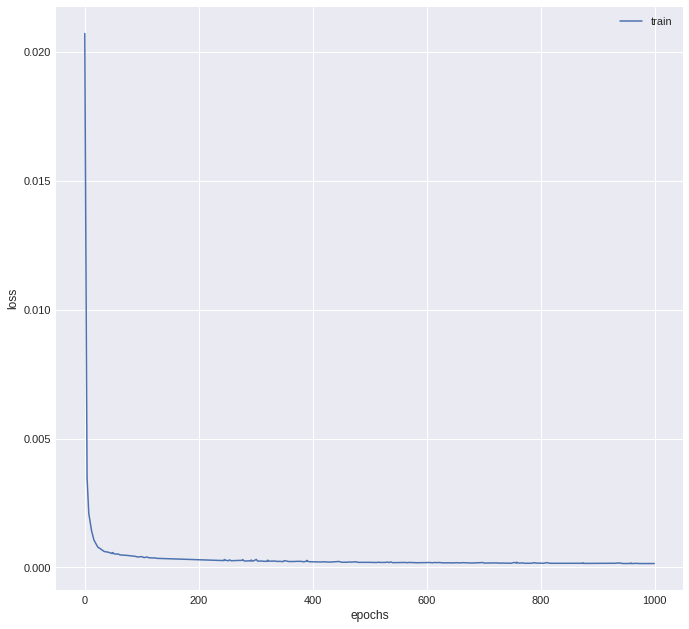

In [180]:
plt.plot(history.history['loss'], label = 'train')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend()
plt.show()

In [181]:
scores = model.evaluate(x_test,y_test)
print("Test Set MSE(loss, metric):",scores)

4552/4552 [==============================] - 0s 44us/step
Test Set MSE(loss, metric): [0.000189572227630815, 0.000189572227630815]


Since the loss and the metric are the same, both the outputs from model.evaluate are the same. As observed from the mean squared error, neural network outperforms all the methods tested so far in this kernel and so far, we have not even tried to optimise the neural network. This goes on to show why neural networks have become so popular nowadays, with one of the major reasons being the unprecedented accuracy which they can achieve.

This was my first kernel, wherein I learned a whole lot of new techniques and concepts. It was a great learning experience for me and I would like to thank the Kaggle community for creating such a wonderful platform where people who are new to data science, like me, can leverage their skills so easily. Any suggestions or comments are welcome. Please consider upvoting this kernel if it was helpful in any way to you, it would be much appreciated.

Thank you